# All the quantitative assessment in one place

In [235]:
%matplotlib inline
import numpy as np
import scipy.io
import cv2
import h5py
import matplotlib.pyplot as plt
import tensorflow as tf
import torch

In [236]:
import numpy as np


def mse(x, y):
    return np.mean(np.abs(x - y)**2)

def psnr(x, y):

    if x.dtype == np.uint8:
        max_intensity = 256
    else:
        max_intensity = 1

    mse = np.sum((x - y) ** 2).astype(float) / x.size
    return 20 * np.log10(max_intensity) - 10 * np.log10(mse)





# U-net 20x

In [19]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/results_unetNormalised_20_Results_unetNormalised_20und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,1,2,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')

recon_unet20 = recon


(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


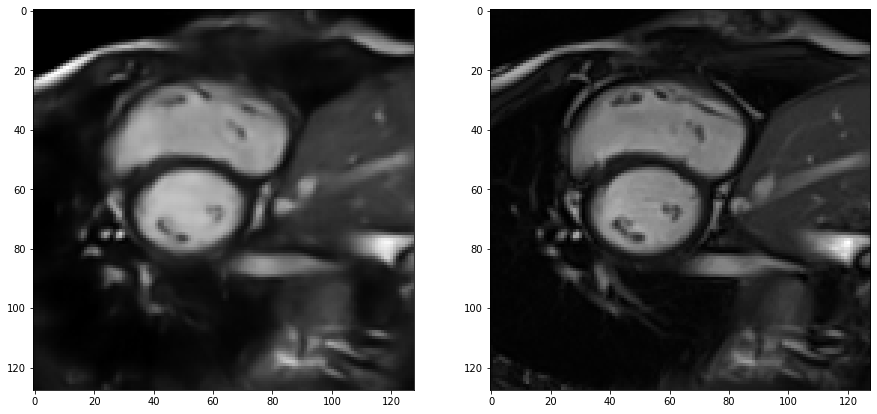

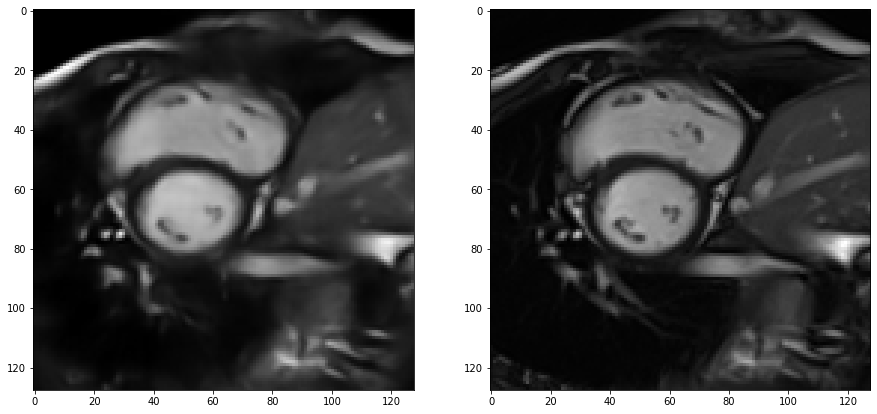

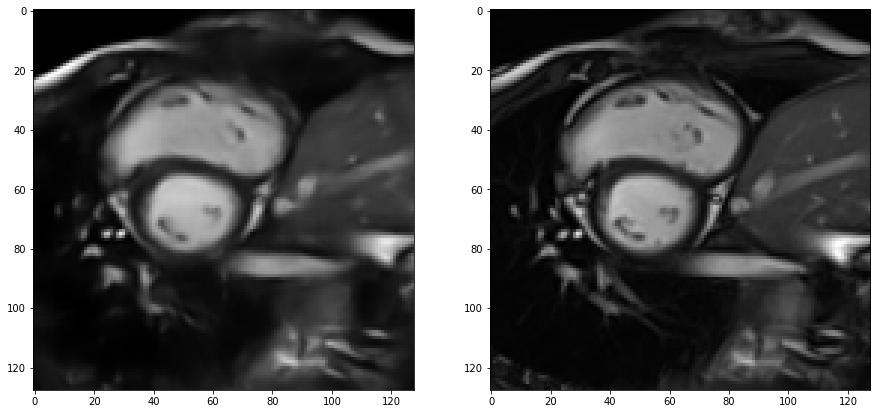

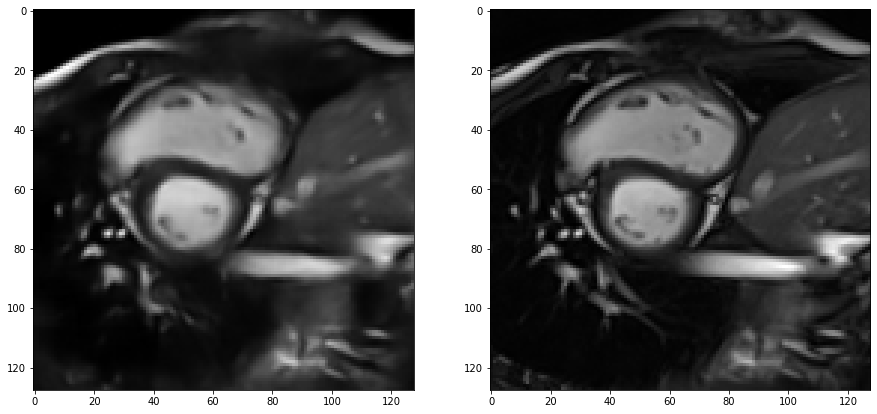

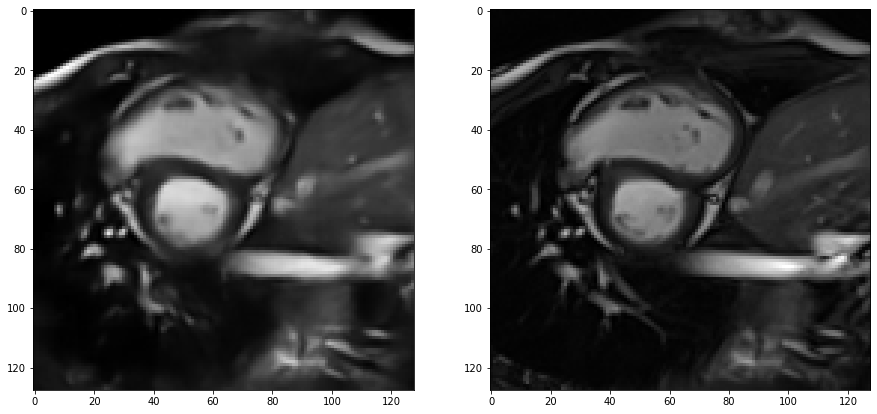

...

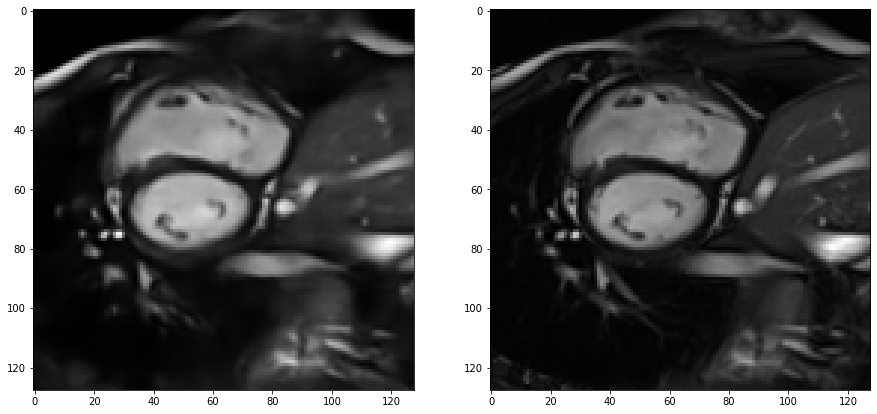

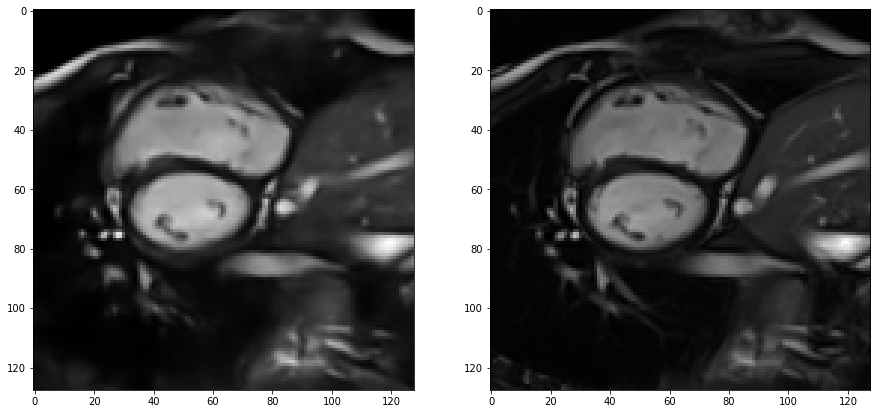

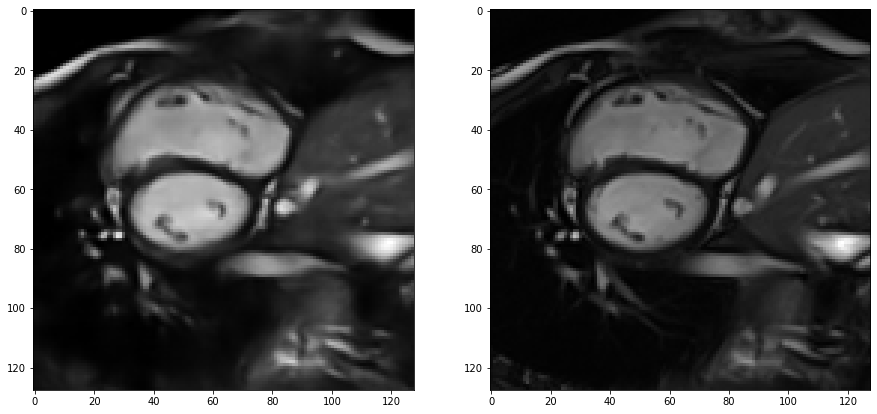

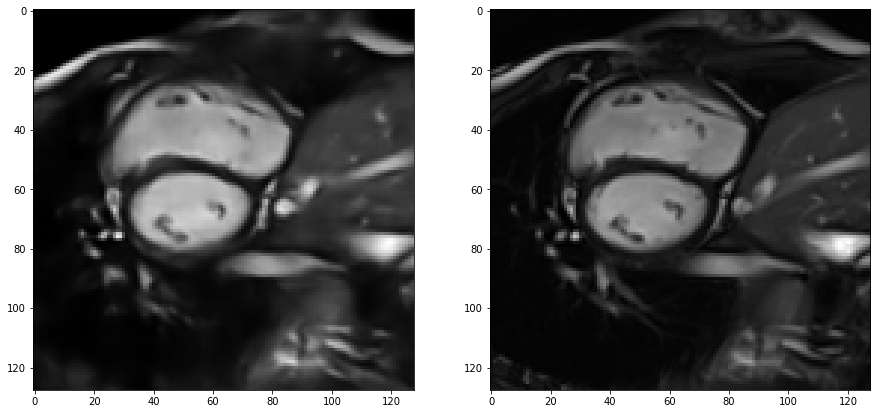

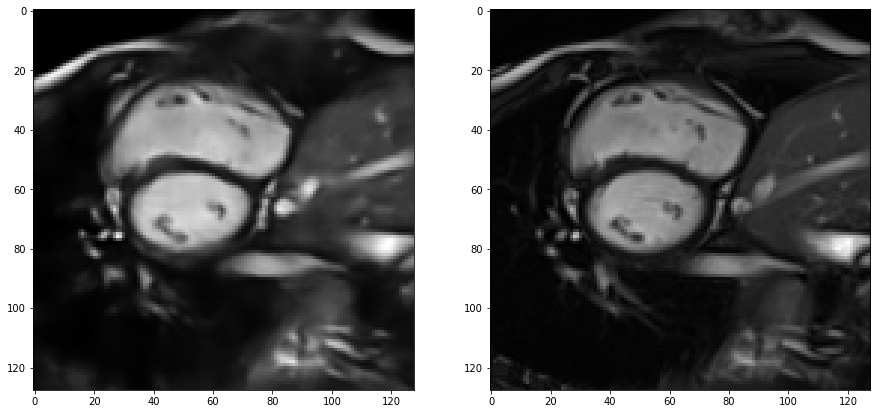

In [4]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

# SSIM

In [5]:
recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')

In [6]:
results = []

In [7]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.8092217  0.69137836 0.6237446  0.62744355 0.614323   0.8088752
 0.82158387 0.75376403 0.7844417  0.7782686  0.81383455 0.7135809
 0.7272384  0.72345245 0.7191223  0.786138   0.7329323  0.76737714
 0.7076943  0.7501223  0.7602396  0.76466066 0.7838966  0.7931076
 0.77451175 0.7808062  0.810926   0.769523   0.77164906 0.7188807
 0.7777726  0.80422413 0.78469884 0.7943234  0.7616743  0.80274975
 0.76355433 0.7303944  0.8088562  0.75214136 0.8001495  0.77996314
 0.7563017  0.7871789  0.82468635 0.839074   0.86043787 0.8262719
 0.8566978  0.85347956 0.8128302  0.7190966  0.79239756 0.7719204
 0.84759426 0.85264915 0.8545211  0.8526857  0.8443722  0.8035715
 0.7498282  0.7829323  0.85985696 0.857803   0.79419553 0.75526166
 0.79383093 0.7795201  0.69908905 0.72057635 0.6167416  0.5947953
 0.6190577  0.76376224 0.7813047  0.8132078  0.80099154 0.7310166
 0.7868302  0.75739264 0.750537   0.8136729  0.8041277  0.80454725
 0.7930613  0.77549255 0.7306458  0.8564004  0.7510425  0.71

tf.Tensor(
[0.8150749  0.69607353 0.6106037  0.6207281  0.5929162  0.8079958
 0.823965   0.7768681  0.7982135  0.77140987 0.8305998  0.75223166
 0.7590261  0.7605218  0.7455691  0.7951194  0.7377621  0.8005729
 0.6804299  0.72443205 0.7327771  0.75241786 0.77302295 0.7860199
 0.7721947  0.7812674  0.8242743  0.79409367 0.77614963 0.72349745
 0.79994005 0.8204803  0.79539263 0.8046764  0.7722582  0.821725
 0.7833729  0.7437588  0.81927687 0.7774768  0.8188     0.7979496
 0.7641875  0.80203134 0.8410418  0.84530896 0.85392225 0.8372421
 0.862238   0.8630773  0.82304704 0.74144334 0.8196596  0.81269014
 0.8604119  0.8550499  0.85099196 0.8473516  0.8616246  0.8007339
 0.75681823 0.7911205  0.86993074 0.8712773  0.7901949  0.7391612
 0.7858209  0.7946661  0.6983909  0.7157152  0.61774856 0.6018495
 0.6248995  0.7816906  0.7878145  0.810045   0.7812697  0.72758156
 0.7777689  0.75205326 0.75142753 0.8215198  0.8316291  0.83528674
 0.8244469  0.8022666  0.7569099  0.8695571  0.7687153  0.731

tf.Tensor(
[0.8049466  0.6843381  0.60588074 0.6219388  0.5904198  0.8075291
 0.82661766 0.78727424 0.8035779  0.77408147 0.81490165 0.75129884
 0.75714564 0.75377816 0.7484503  0.800476   0.7310792  0.81491446
 0.7141701  0.7519685  0.75552917 0.7380256  0.7613048  0.79064053
 0.7705434  0.7830579  0.8262294  0.8028034  0.785285   0.7227862
 0.78159565 0.81273    0.7914805  0.79932356 0.7700619  0.8177146
 0.78644997 0.74789405 0.82180023 0.78276575 0.8244453  0.8014586
 0.78318083 0.79242104 0.8291647  0.84034044 0.8441793  0.8191223
 0.8463133  0.84097546 0.80824435 0.7299421  0.824275   0.8152867
 0.853825   0.8527742  0.86022264 0.84677565 0.8509316  0.80779773
 0.7653202  0.8015825  0.8717558  0.87289774 0.8048143  0.754119
 0.788622   0.7989702  0.7124274  0.7166781  0.6246853  0.60631126
 0.625773   0.7789798  0.77318674 0.7950351  0.76193    0.7194126
 0.7696342  0.7421134  0.7597315  0.8113929  0.826946   0.8179394
 0.805676   0.7946183  0.7464337  0.8692195  0.781705   0.735

tf.Tensor(
[0.81457037 0.70118254 0.60686046 0.6311949  0.6041744  0.8233157
 0.83786494 0.79051095 0.8122295  0.7759336  0.832806   0.74996376
 0.74645406 0.74025136 0.734925   0.8015858  0.7304997  0.8168967
 0.7385418  0.77007204 0.7783938  0.784926   0.8060972  0.8139421
 0.79977137 0.80636513 0.85226184 0.7935524  0.81452394 0.757134
 0.79111284 0.8246729  0.7898592  0.7969855  0.77875555 0.8343521
 0.79151773 0.7524442  0.82193446 0.7799464  0.8185877  0.8022268
 0.7903387  0.80625373 0.85117024 0.8540433  0.8721033  0.8526848
 0.8729895  0.86383015 0.8269306  0.72985834 0.84253836 0.82507706
 0.86433905 0.8736551  0.8733654  0.85747504 0.86298746 0.8161424
 0.7687712  0.80405986 0.87679106 0.8752693  0.8096473  0.76135194
 0.8119769  0.8161926  0.71171385 0.72191435 0.62523484 0.6098315
 0.64023095 0.79308784 0.7977344  0.8309678  0.786286   0.7375841
 0.7919311  0.7518249  0.7646633  0.81944704 0.82340264 0.8243091
 0.81393045 0.79691243 0.7513275  0.86079454 0.7903698  0.73833

tf.Tensor(
[0.83314526 0.70768493 0.60619396 0.63377196 0.5975746  0.8231258
 0.8403703  0.79603153 0.8169012  0.7790209  0.832006   0.7499791
 0.75482434 0.7557069  0.7455443  0.79839355 0.7371751  0.7986956
 0.73401695 0.7737182  0.78958046 0.8036401  0.8140516  0.8198413
 0.7974862  0.8041172  0.8472339  0.7920663  0.814502   0.7532715
 0.79833955 0.8310376  0.7926769  0.80800503 0.78623855 0.8244867
 0.78411376 0.7640046  0.8243876  0.7741962  0.8112746  0.79640603
 0.7874257  0.8180304  0.8665802  0.8638929  0.8846092  0.8715378
 0.8883717  0.87984437 0.8425464  0.7444011  0.8465898  0.83032596
 0.8675522  0.8727551  0.870766   0.85987985 0.8681928  0.8188053
 0.7781831  0.81162995 0.8785119  0.8700574  0.82224417 0.76011235
 0.8188202  0.8104894  0.70977366 0.72824407 0.6234914  0.61260706
 0.6329816  0.802057   0.8032615  0.8378931  0.7932351  0.74212843
 0.7938011  0.75478125 0.7597398  0.82724524 0.8232033  0.821014
 0.8091146  0.7952954  0.74921197 0.8553575  0.7929866  0.749

In [8]:
r = []

In [9]:
for k in range(20):
    r.append(np.mean(results[k]))

In [10]:
np.mean(r)

0.8004004

[0.8185069, 0.6973949, 0.6108574, 0.6269417, 0.6001074, 0.8159634, 0.831625, 0.78656316, 0.8036534, 0.7754966, 0.8255973, 0.74168265, 0.74744606, 0.7475877, 0.7383879, 0.7955899, 0.7308166, 0.7979986, 0.7193912, 0.75477606, 0.7637591, 0.7728895, 0.7912381, 0.8005164, 0.7841034, 0.79196596, 0.83417207, 0.78938925, 0.7973782, 0.73322874, 0.79028475, 0.8193513, 0.7884184, 0.79845965, 0.7758512, 0.81932896, 0.7813092, 0.74795306, 0.8194974, 0.77258545, 0.81323797, 0.7945654, 0.7747989, 0.8044337, 0.84560317, 0.85110456, 0.8656641, 0.8479694, 0.8693427, 0.8642646, 0.82640266, 0.7339191, 0.8281971, 0.81472266, 0.8596004, 0.86201966, 0.8626922, 0.8526661, 0.85858476, 0.8098875, 0.76544034, 0.7996133, 0.8724869, 0.86983377, 0.8066028, 0.75648344, 0.8015874, 0.8020663, 0.7068165, 0.72209007, 0.6224841, 0.60633314, 0.629496, 0.78450525, 0.7897149, 0.81929696, 0.78468084, 0.7327639, 0.78484595, 0.75145215, 0.7568807, 0.8196112, 0.8218845, 0.8192235, 0.8070513, 0.7917584, 0.7458914, 0.86104405, 0.

Text(0, 0.5, 'SSIM')

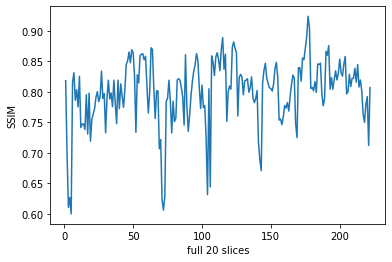

In [11]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')


# PSNR

In [12]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

24.656820964455104
24.66217216826813
24.56654223896917
24.425648020281905
24.304366858299232
24.327138188461156
24.39841045963881
24.611836773847976
24.551214645693463
24.817156577595057
24.849134009582148
24.40037556459959
24.193838473890168
24.244237189279154
24.404342145077177
24.37617775755504
24.264784040912758
24.196214463383345
24.37204753535945
24.11939715747328
20.02449235908258
20.115806611124576
20.18004430296792
20.149644142110077
20.058022497905633
20.047162240726948
20.187097337657963
20.47284433814607
20.554130317023276
20.536306103292326
20.48570950519768
20.14594827785791
19.83854030349596
19.69162218884599
19.60831134232762
19.565592062995446
19.519971549154743
19.525976985005457
19.7319122212232
19.768582710338794
18.423005190781748
18.585577165518707
18.642484866292474
18.709914918365445
18.779738110576346
18.87583479075786
18.987580997546882
19.20029499044308
19.15091714038804
19.036315296392324
18.688164146625745
18.278475014121607
18.026146725312323
17.9118752949

27.252556796141732
27.204991026618494
26.853049761891278
28.067684196636865
28.271280774177296
28.258387442119638
28.292908913087057
28.397794337346888
28.266266413685123
28.287222400338813
28.30844894804573
28.442549867614435
28.581779310631063
28.64077836552958
28.651415294727485
28.834253925380303
28.770408073183937
28.785834473175044
28.71510778589261
28.64325681413305
28.539583315876172
28.367438003439137
28.112893585015428
24.832807575151715
24.80873378800346
24.898881795902756
25.03047006161644
25.156605392893972
25.112373085607075
25.008015178755045
25.035345157497524
25.235389912657794
25.006990433538512
24.939076101167743
24.91666137032319
25.02516994820915
25.052400853927686
25.164229513530042
25.0685751474554
25.221580107714118
25.328052905800163
25.173315358477794
24.966826035260627
24.637837722811824
25.51762149589248
25.91332879141117
25.247486393140978
25.069101895952876
25.35085056808221
25.309080527017418
25.132731184547843
25.17979930470824
25.43800233548254
25.89842

25.9285634808072
25.603499421777066
25.582256997436662
25.55947582440151
25.549498556503856
25.521711304643272
25.42168356401438
25.540570219088913
25.500873012609585
26.477197105539034
26.644252054652327
26.838328333273182
27.083544837724194
27.175461962439623
27.046593696313508
27.096344804390824
27.096314057824213
27.179864624501214
27.200061162951172
27.278270994782666
27.45611695294312
27.604246977899788
27.697084836069877
27.749273238014457
27.710965424875333
27.61585030956878
27.540189094833654
27.457263150201747
27.31594386201241
28.140354216051495
28.518278119672974
28.56280079257511
28.508203138697187
28.45518630276025
28.337322943218513
28.273611994896008
28.24472023042967
28.509963287075323
28.47596448850116
28.704011908257637
28.826371371259107
28.726724600040477
28.72878624485949
28.761320159219498
28.753628766786715
28.80312814246365
28.774110899481897
28.58458427555179
28.37324461799337
26.834384358417395
26.984916742443378
27.217276527709306
27.259920866721803
27.25774

19.492551755553823
19.436662032285533
19.351448872891126
19.297273501202877
19.208627493803718
19.369757111335637
19.350070239585733
19.526419219235574
19.619387167509718
19.59819650389705
19.50774529724096
19.43683731773769
19.31899423788802
19.22770142768369
19.210413191702106
19.162157536178043
27.03438545464565
27.149898390573757
27.03467674347756
26.997266654366825
26.922080443633206
27.044105158887962
27.19899704195457
27.340119765326364
27.41299362448204
27.53798277969978
27.699693393576375
27.526365253489562
27.18403384198766
27.13877999945128
27.19209780427719
27.093686147732615
26.845085867206564
26.576714803426785
26.71613516185922
26.605943730229086
26.486620460528346
26.787188314014013
27.023540988669993
27.23832804806407
27.444915330434718
27.377802917029793
27.42464245987094
27.396311968261948
27.396948131615027
27.395850491533878
27.389338077299197
27.260818079941195
26.90241507679937
26.935305969924464
27.016852119719893
27.077921789471873
27.08394630273851
26.89392563

26.69553876195912
26.80338193510703
26.78780349996542
26.762279982762884
26.665436093750017
26.566946643062373
26.481509932667176
26.626049173645768
26.70292201537487
26.882034499673615
27.005805584603927
27.239094064688647
27.257349600192597
27.39463263731171
27.255881627602733
27.01570218225584
26.641250155460234
27.03352215714724
27.03985131155036
27.532674750472438
27.76270300425956
27.853509546451836
27.82724048212326
27.780349805762224
27.665153834499012
27.699912259214887
27.721473779960487
27.761283606637768
27.91003027067716
27.93973412474637
27.964144982377196
28.071499927041977
28.125681109144182
28.178434956000572
28.274728794838737
27.940117595800235
27.345338978464042
26.680652683675284
26.852356334495177
26.649837861946747
26.60289438951606
26.502248405127368
26.28333590676011
26.223979697053498
26.32150328328781
26.425550816916022
26.570523070997247
26.633106112036526
26.653433393108948
26.621412739751307
26.68979799886209
26.774493932019297
26.663704641965396
26.471143

23.113847116938725
23.183053310583745
23.3498693023097
23.14238496322542
22.928566549323545
22.823789129285505
22.72211132729625
22.675483028133637
22.56468221316041
22.582933490546516
22.711644545775425
22.73558302344221
22.477337826865586
22.18776933482539
23.390053437063823
23.76145403691664
24.14387624723701
24.29866327405277
24.449977580091165
24.45332243988682
24.515432710369716
24.45009293180813
24.34097185505547
24.374079526217525
24.453312102251328
24.235134954743568
24.26701512461144
24.11279365145045
24.072229634152468
24.043459436452892
24.142844750185397
24.18280560084895
23.91155932788668
23.62050109939552
25.135771452131237
25.302515686957673
25.344917933350594
25.39587001218846
25.554809842781765
25.510793018533228
25.404971818814367
25.283622302737317
25.32862693207523
25.38062338062865
25.67354446805268
25.580189152769236
25.725269930105668
25.592001443364666
25.652142611427173
25.613652835452886
25.673793210795196
25.615100768518467
25.409438046407956
25.269731962880

22.90664764938668
22.949471874013515
22.875902585573392
22.966373380707946
22.763862588014256
22.96648043243195
22.904027438629896
23.21878796576538
23.265602338637734
22.956992548223806
23.044737785271515
21.998322878880447
21.51218281956382
21.838064663541864
21.737404257341645
21.52196911693855
21.57760046294316
22.18628242336589
21.99336321808897
21.97008383848082
21.66289384372648
21.99471542473745
22.32658483044009
22.227315030375593
21.733950708387088
21.508957115892105
21.81742495329807
21.796486157923425
21.340531143362462
21.462324039537464
21.968613679093153
22.73662508798127
23.04676526399122
23.01919122406
22.888036783597595
22.8215353211983
22.8576288951254
22.85946549850717
22.8069259077705
22.70052690273593
22.772299694564797
22.74376325269428
22.715754337665267
22.68027219365504
22.661840809344266
22.49883333156003
22.410595352346732
22.451229324418055
22.489515998635742
22.605662727769747
22.532570832753898
22.85897184092169
22.916078075022188
22.845047858534233
22.80

24.587359581162
24.6766384907762
24.661429917499184
24.702764730249662
24.81669395404223
24.911941980701418
25.021143425237973
25.089030661313064
24.69685894942531
24.55218561008362
24.472203494365257
24.274662711325586
24.136618578007635
24.151145457453588
24.076541014999865
24.249057019434588
24.157328655604612
24.029124355095888
24.356320868013825
24.261757134181366
24.140706980781516
24.131585383767245
24.13918072069086
24.20005260053314
24.214077139968474
24.155054292221738
24.37531025085405
24.410667814742805
24.1737010887103
24.086658403075944
24.073702310831393
23.968233431809498
23.901881336403864
23.973049539099858
23.837988698058716
23.813302870388704
23.62795506503649
23.303725116307753
23.387160181196943
23.218977687848913
23.14438781423349
23.185059374584863
23.297609909764276
23.59451529475189
23.663973142611212
23.667428348039202
23.776658476593223
23.76066479106492
23.584792914990675
23.449829081065317
23.375305761442853
23.31124557482613
23.23529973241094
23.239761565

In [13]:
np.mean(results_psnr)

24.86514606494129

[24.437092761631103, 20.010385869824006, 18.428435783428952, 19.0211384012753, 17.87577748950023, 23.978057897892352, 24.315044772136694, 23.205648799269035, 25.89151939462239, 20.855233863996833, 25.822205806764146, 20.857948214311705, 19.044970254639754, 18.56387564598004, 17.922372213889652, 21.6475585867341, 20.700934543196308, 23.58037602618332, 23.34756823479771, 22.342380099178776, 23.707580836386047, 23.574839447347237, 27.113426722735305, 26.131757466943753, 26.599262441583665, 27.39539115701215, 28.46176461200178, 25.04907498617451, 25.547356003119482, 23.910830900842235, 24.794428185330823, 23.248918326378536, 21.66269058593061, 26.814944652900472, 24.96842930558143, 26.757764701512222, 24.43339363719052, 21.88940979794135, 27.084385324068847, 24.35645940502912, 25.957785462223065, 25.95176133010373, 23.684706823063273, 23.884234935041924, 25.82602247771863, 27.39558891285667, 28.88954550473422, 24.363215626422495, 27.878649645998202, 28.83073593603634, 27.434810585059743, 2

Text(0, 0.5, 'PSNR')

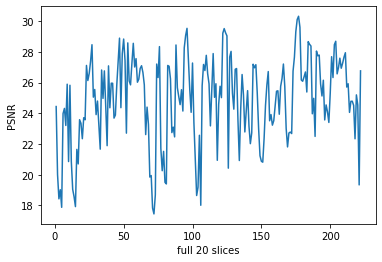

In [14]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')


# MSE

In [15]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)

0.003422298631034491
0.0034180844076568775
0.003494184043206187
0.0036094015289963514
0.0037116183584630794
0.003692208188688843
0.003632109675458882
0.0034579309964870705
0.0035065378850626105
0.0032982558563562515
0.0032740597366579366
0.0036304665824674134
0.003807291704859929
0.0037633644757382448
0.0036271522498690853
0.003650751095852241
0.0037456017210851416
0.003805209336467795
0.0036542246802600546
0.0038731140373978344
0.009943762984542366
0.009736869265614517
0.009593908445901534
0.009661300397727574
0.00986728677120996
0.009891992443403868
0.009578340379535696
0.008968412311412623
0.008802113580418398
0.008838313245599224
0.00894188436783699
0.009669525704267323
0.010378771955530889
0.010735883277361538
0.01094381809624233
0.011051997899405952
0.01116870564430632
0.011153272201074062
0.010636745736478714
0.010547310443311569
0.014378033161110353
0.013849761141461196
0.013669464875045126
0.013458867207553266
0.013244213984011714
0.012954376675666162
0.012625305631263191
0.01

0.0018221589736112684
0.0018103647853273245
0.0018791330163321794
0.0025919442977438687
0.002461560254005144
0.002431400714841936
0.002221927748525876
0.002224447583778317
0.0022651815576217194
0.0022902735198374155
0.002352010771876958
0.002298061560569842
0.0029464495374114073
0.002841599586752815
0.0027013738053931514
0.0025712031919490684
0.002493440830768626
0.002425216901188297
0.0023537399862038266
0.0023286588908603177
0.0023108914745443277
0.0023657292293462837
0.002406065112017776
0.0022378725428454016
0.0020192733400485824
0.0020572339798358664
0.0018348707112941058
0.001887627290749058
0.0018841727996998132
0.0019200157177581025
0.0018453561997001967
0.0018661646194005133
0.0021479384421773575
0.002194131280721738
0.0023496044784906264
0.0022670547965771906
0.0022444526884567344
0.002319173370264941
0.0024070467889139723
0.002421161565484383
0.0025311934430436527
0.0027671636276197856
0.0029588994614152355
0.001978555665202951
0.0018200879332900205
0.0018886471910006782
0.0

0.001677716661516301
0.001701012376260223
0.0016953647397526111
0.0017397719258405958
0.0017217781953108215
0.0017903060267277127
0.001796917687596643
0.0018818321945007353
0.0017603127681600095
0.001751396421340596
0.0017467537879906094
0.0018006059360697177
0.0017330348396673513
0.0016950680425892907
0.0018333709199512777
0.00209689073784697
0.005888038857087791
0.005533681332418928
0.005526578688622965
0.00529505416521522
0.0051521939508013
0.0052636405814787835
0.005396644080536792
0.005486013346348193
0.00544731802342595
0.005508393223857781
0.005413228546232279
0.005483172442215292
0.005361182911084419
0.005337829864363702
0.0051574125346098626
0.0051953793529544556
0.005057182073155046
0.005008908761214459
0.0051529123170047115
0.0057082915091398005
0.001927006393615891
0.0014535729170430688
0.0013000666250041525
0.0014074106950532326
0.0015535722286479452
0.0016290524802089251
0.0015331107264143521
0.0014509275556958943
0.001429102331849111
0.001390332155090014
0.00118782713373

0.010702845008371513
0.01097791886502002
0.011163177146759322
0.011400918746280513
0.01196747369968124
0.01239288047535372
0.012170568162380643
0.011707071366363845
0.011348572518414302
0.011097559619105204
0.011324901280166746
0.011435366936754707
0.011239443912972316
0.011385019971083946
0.011610612014255277
0.011756353866751916
0.01199878442297199
0.011561769020997346
0.011614298295791591
0.011152136541324147
0.010915943603476475
0.010969336255557818
0.01120019206760111
0.011384560469942573
0.01169770261232764
0.011946202088363146
0.011993851871283098
0.012127861994349863
0.001979527113012911
0.001927570010929873
0.0019793943471529503
0.0019965184806238325
0.0020313836640938167
0.001975101796902522
0.0019059008151618055
0.0018449645399175366
0.001814264645408474
0.0017627946429119952
0.0016983635505527779
0.0017675164917252831
0.0019124787389760498
0.001932511113113895
0.0019089309510045994
0.001952681380928255
0.0020677184992985162
0.002199523060697324
0.00213003374511115
0.0021847

0.012816942035891881
0.012434151520832583
0.012088817573995074
0.011865901869213293
0.011620285263311988
0.012237081769869783
0.013597311575894784
0.01457390849583531
0.014686386197808368
0.014826246469842897
0.015086709492834575
0.015258867076783499
0.015124123946805639
0.014152094408413859
0.013326631503667006
0.012174663450266288
0.011910163389707995
0.012452717829105184
0.012495782124069663
0.01219501749643705
0.01211659915651939
0.011980432819921377
0.011875824206031468
0.011779789682941987
0.01171681354073766
0.011747119633961727
0.012151383568765292
0.01240428412981625
0.012359633381395816
0.012221966487517822
0.012178107662732446
0.01238583110474983
0.012323035556898052
0.011779232344664214
0.011290811244278933
0.0052939404110700534
0.005651277121630046
0.0058647370353273436
0.005633516853466299
0.0053394600800068266
0.005152179817855161
0.005066976632327767
0.004936450428249852
0.0050374814853167416
0.005350957720980692
0.005598777863045221
0.005796302555968403
0.0060762352060

0.0010500392984339687
0.0010650417934346076
0.0010532749741712164
0.0010315645652799188
0.0012961525467409245
0.0011912405373240217
0.00113748299030754
0.0011019436712213083
0.0011256981251445007
0.0011945852224484596
0.0011947840023969654
0.0011975973089634361
0.001236576657593347
0.0012878375498297074
0.0012354526853806994
0.0011756269082225678
0.0012200311762438371
0.0011746464788374746
0.0011541873949580611
0.0011528164253441682
0.0011906455515687685
0.0012092043330759988
0.0011898132753793858
0.0011746365362167502
0.0013373761295919846
0.0013054547117341184
0.0012560078881154596
0.0012116167820517638
0.0012239989957572456
0.0012727717394393665
0.001260693460866603
0.0012415628043393827
0.0012785262860661463
0.0012898695716006213
0.0012472647183960012
0.0011847761329790004
0.0011804432442163396
0.0011600208805848831
0.0011520477653830803
0.001180832506608373
0.0012170713033619013
0.00127784587678072
0.0013198856035513216
0.0013840713116958195
0.008571407305872226
0.0089373487947289

0.0018504891107184607
0.001796278530755899
0.0017667900171212066
0.001821708522374889
0.0018530500476504402
0.0018878245020503958
0.0019505764103715125
0.001991041234457776
0.002119583280405315
0.0021363592265528546
0.0021433768110724087
0.0022112515866196066
0.0020585688583694773
0.0020079855397779002
0.0020286798375631914
0.0019914556011486634
0.0019285329428217449
0.0018608721481016002
0.0017932103266848633
0.00175307138159211
0.0017347172757189095
0.0017190760095350504
0.0017342632610121552
0.0017960020462844044
0.001840409037567057
0.0018838524484698612
0.001883744115201545
0.0018825725524121133
0.002006343158813
0.0021377432032313294
0.002326760255285981
0.0030611845479529554
0.003041527885129878
0.002927204590242506
0.002939597270598787
0.00289654448535954
0.0028714845317603806
0.002859420920001663
0.0029068432641793447
0.002931105118850865
0.0030376135900895855
0.002910802989450974
0.002846515582498665
0.002811728713849132
0.0027468230476982887
0.00275166266661923
0.00276977670

0.00207700340352416
0.0019405813673639685
0.001886614179047666
0.0019083034544178671
0.0018654367747291574
0.0018457204829065714
0.0018283525859108065
0.001858224252761009
0.0018721510038963033
0.0018035913531047232
0.0018213583703425087
0.001973478077800283
0.001935886449734039
0.0018602624630280468
0.0017788359910026062
0.0017577138691557085
0.0018359124106421363
0.0019378782262831316
0.0020650453361485714
0.002798011822858862
0.0027350286906991984
0.0024946088046966363
0.002393362219345456
0.0024159123229201126
0.002510977513966588
0.0026824525905449017
0.002828480149493583
0.0028312577346858736
0.0028967532722368
0.002814525811360843
0.002739593388086778
0.0025509305749091705
0.0026617431232025127
0.0027031440284703686
0.0027292974354177517
0.0025748530802800207
0.00254868657473276
0.0027001450148163176
0.002842295790265894
0.00505514045402489
0.0052185879855117644
0.004818838109159392
0.004804377919564616
0.004862042273885812
0.004889352637514593
0.004817624781065974
0.00506815256

0.0032346198873146577
0.003420956016594536
0.003288737970437056
0.0031634751506181176
0.0032020259819612734
0.0033148201376883594
0.003308238626732633
0.003159269990028719
0.0030003432047540413
0.003127306630491595
0.0031497195082859373
0.0030755961886063297
0.0031191504763584243
0.003054354112881659
0.0030428084049747405
0.002921813061846203
0.0030760693135550242
0.005716922751969824
0.0055804091715107055
0.005722251198691328
0.005745757757374757
0.005659743911196514
0.005494798938587529
0.005349437370809311
0.005323316050762879
0.005446670903863077
0.005380777294725346
0.005292992623958378
0.005439740805083176
0.0056907250929284945
0.00597255009452511
0.006201056718681848
0.0062480493633940235
0.006029424777213779
0.005856394326440799
0.005410892810848317
0.0052431281344435254
0.0017540744573434053
0.0015797864629937789
0.0015327747035997269
0.0015172876713723982
0.0015053205345161545
0.0015238749464917658
0.0015119568166986471
0.0015790576087075562
0.0016437716991409687
0.0015761393

0.001974234587764896
0.001885876901700222
0.001973156391334438
0.001978312737953389
0.002150564976938319
0.0022267330383410173
0.0021507614916306747
0.0021387757614738205
0.0021265692494878935
0.0021724795581279533
0.0020913930581897408
0.001955435490401262
0.0018773642809097573
0.001851065597340587
0.001846811100346182
0.001875364578886469
0.002008950393400115
0.002058706028750262
0.0022164922127159057
0.0019096369101518358
0.001791941439453333
0.0017055845759316845
0.0017458198194162907
0.0018269597234694627
0.0019359725942651315
0.0020481738089347637
0.002118025403332841
0.002083355114057179
0.0020073588011690624
0.0021004041146574382
0.0019679982509436082
0.0019090361269085737
0.0018807587583734614
0.0018164793614080118
0.0017559737737403327
0.0016809526684105295
0.0016897083643760292
0.0017395056157982008
0.002001110012531835
0.002111428714754635
0.0018238881043861727
0.0016003040596972219
0.0014753171433536617
0.0016125751440405733
0.0016800215351755136
0.0018455685263087992
0.00

[0.003603693259603316, 0.010005510757559071, 0.014449543194654158, 0.012583509032994298, 0.016345718192360192, 0.004005648685821839, 0.0037063258651876584, 0.004787761652781443, 0.002587681135579061, 0.008225267209812776, 0.002621165868436752, 0.008242129534522257, 0.012507884142180015, 0.013987528067636212, 0.01620025250093679, 0.006860013956484325, 0.00851081703077813, 0.004408984173940299, 0.004636841637624226, 0.005838211545042377, 0.004262620308659828, 0.0043944704481691695, 0.0019490178363557333, 0.002444058827761849, 0.0022080203572248627, 0.001823351082392597, 0.0014269417132762709, 0.003128214797042835, 0.0028041558781572917, 0.004079955377713441, 0.0033316634222352185, 0.004748275504442072, 0.006827080367781485, 0.0020852050145581677, 0.003195032865495828, 0.00211335535170292, 0.0036298232225071723, 0.006541248092408641, 0.001960568318357908, 0.0036802236998228653, 0.0025419359575209193, 0.002541006232012881, 0.0042895880899149735, 0.004092572320286984, 0.0026167203620861383,

Text(0, 0.5, 'MSE')

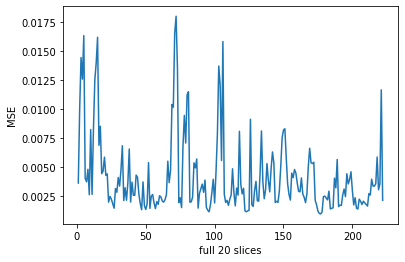

In [16]:
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')



# U-net 23x

In [20]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/results_unet_23Normalised_Results_unet_23und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,1,2,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')

recon_unet23 = recon


(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


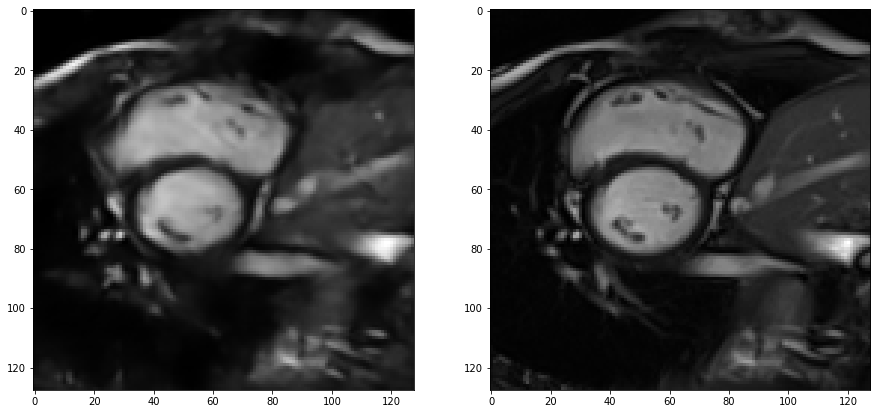

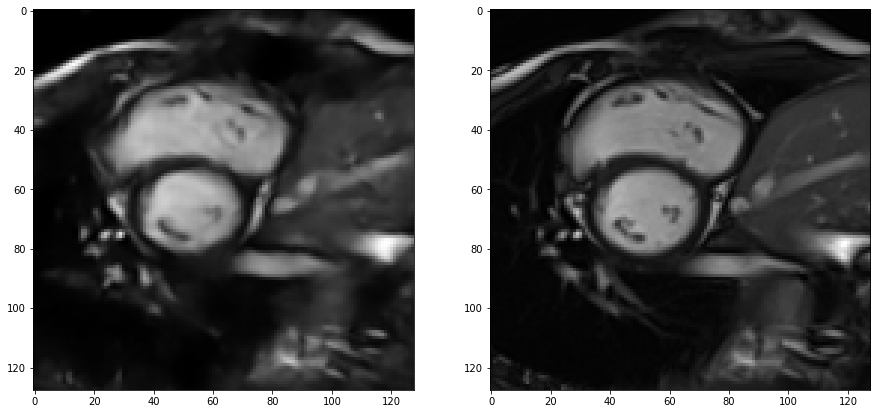

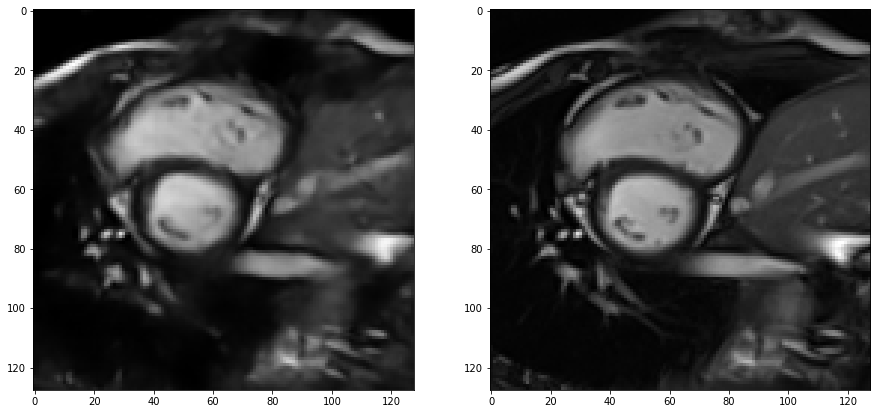

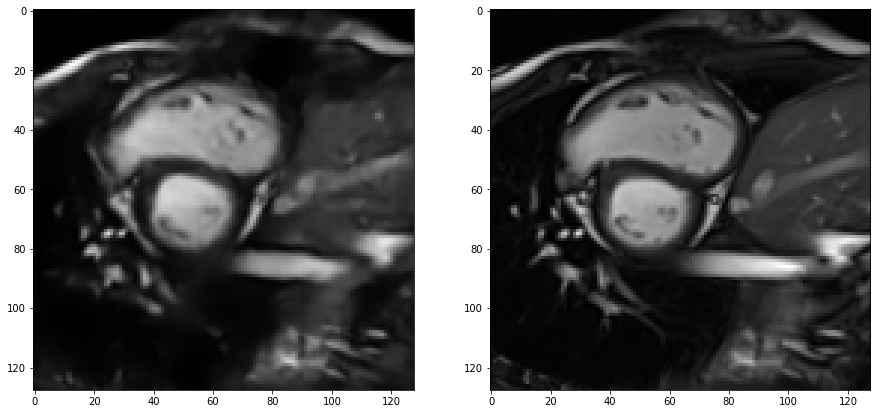

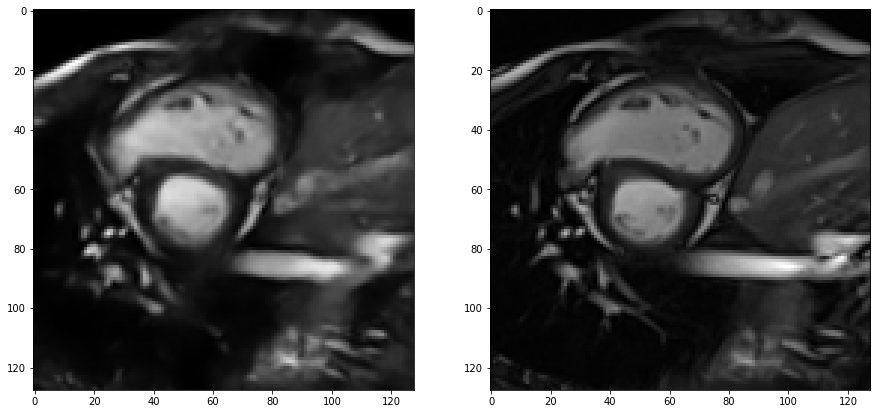

...

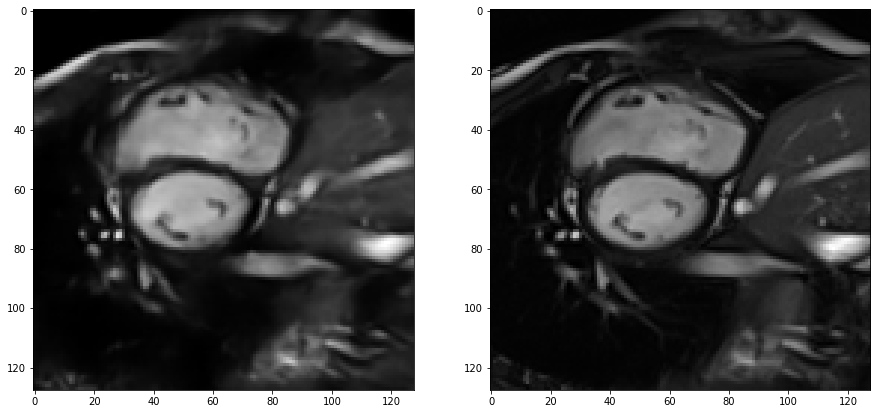

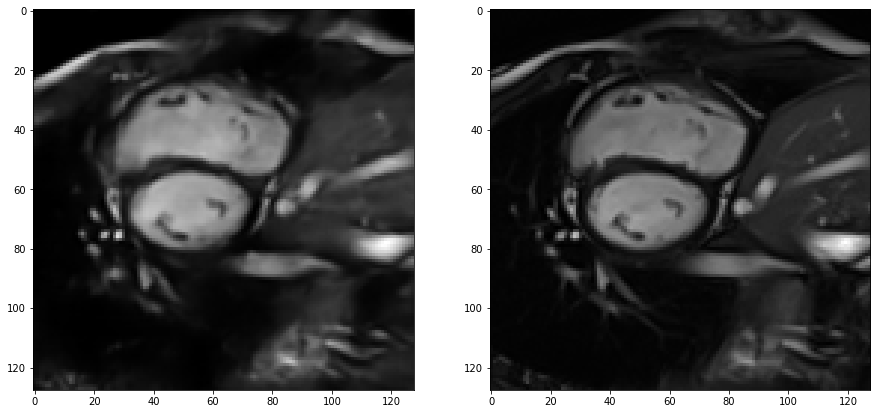

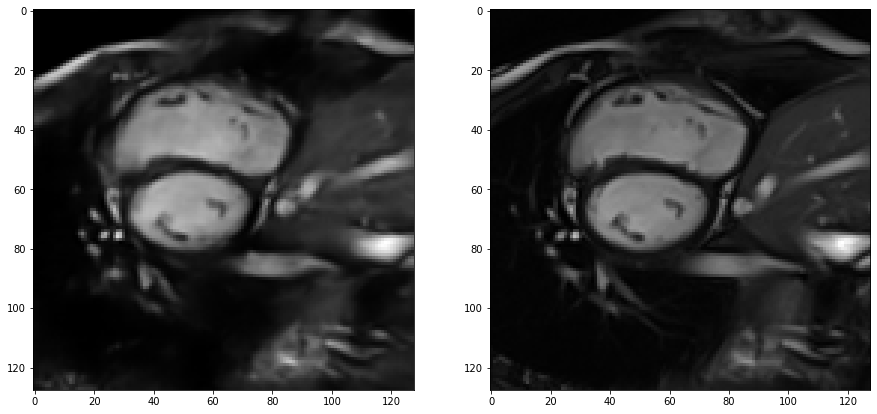

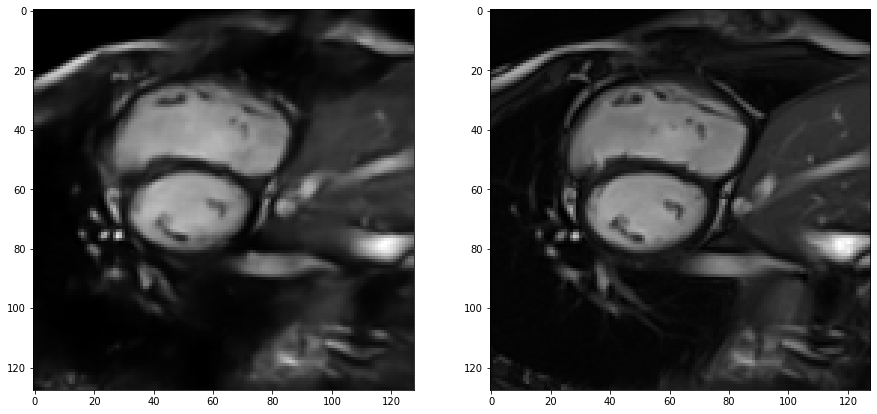

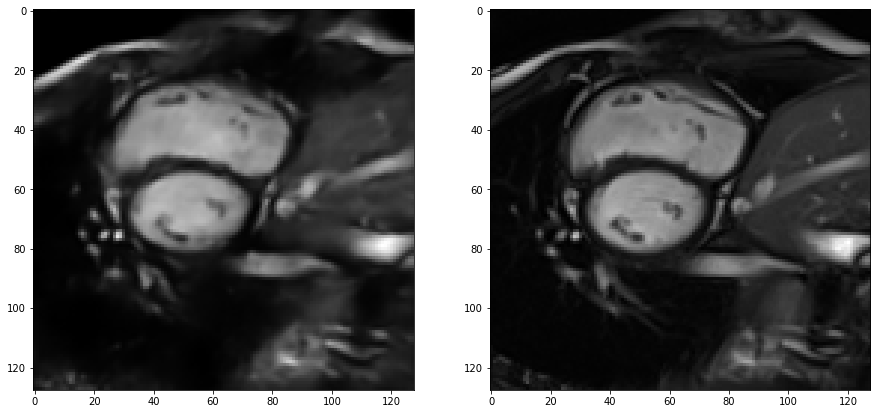

In [232]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

# SSIM

In [18]:
results = []

In [19]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.7448971  0.6432708  0.5702039  0.6136429  0.53988075 0.7346663
 0.77947676 0.7254652  0.73619807 0.71521676 0.7347739  0.65337324
 0.67762405 0.68685585 0.67055583 0.75235933 0.692151   0.67588407
 0.699649   0.68263894 0.72079456 0.7173103  0.723189   0.7570601
 0.7227663  0.75537735 0.7842588  0.76703876 0.7438414  0.6980433
 0.7234968  0.78566265 0.7601703  0.70407885 0.709377   0.75057
 0.7328492  0.6807389  0.7415647  0.70930207 0.733312   0.7596394
 0.701289   0.7171098  0.76777494 0.7743811  0.79668826 0.7697388
 0.78587246 0.8139173  0.8410304  0.8027126  0.72867566 0.7105163
 0.78832704 0.7843289  0.8040377  0.79335713 0.7642377  0.7348215
 0.724211   0.72904694 0.7851776  0.79358035 0.70404226 0.64498305
 0.69974434 0.6685723  0.6035911  0.6540003  0.5539374  0.55952394
 0.5339744  0.73240495 0.7327007  0.7494835  0.73561805 0.67868185
 0.72067606 0.7223687  0.7185865  0.7476125  0.73760724 0.7483803
 0.7483842  0.74743474 0.7413042  0.7917715  0.66904336 0.6770

tf.Tensor(
[0.75269836 0.64774793 0.58050597 0.60506916 0.5266836  0.75070626
 0.7768385  0.744972   0.7417155  0.7100843  0.75687045 0.68062156
 0.7018943  0.7182196  0.68171954 0.76293737 0.68422776 0.73212326
 0.67172927 0.6546195  0.6887647  0.718494   0.7134518  0.7485994
 0.72172564 0.75592357 0.78809154 0.79346603 0.7449134  0.6863161
 0.74261105 0.8028934  0.77036685 0.7172169  0.71674246 0.77439547
 0.7437586  0.7060876  0.7460505  0.7382285  0.7724856  0.7762548
 0.71874136 0.74640656 0.7965805  0.78642285 0.80095315 0.77007145
 0.7869559  0.8206019  0.8446655  0.8151566  0.76213723 0.76286
 0.79610604 0.7902888  0.8059226  0.7890833  0.7761171  0.7447255
 0.73022974 0.75029075 0.79779    0.80224013 0.7108986  0.6445098
 0.71241146 0.6877367  0.62036586 0.67858225 0.57439536 0.58026516
 0.5509304  0.74870354 0.75357294 0.7520799  0.7226769  0.67123944
 0.7222585  0.7264656  0.716444   0.7637374  0.7559681  0.780981
 0.7696717  0.7729142  0.7595454  0.80642784 0.7035531  0.676

tf.Tensor(
[0.7449406  0.6196119  0.55937105 0.5843186  0.5234229  0.72948235
 0.7615555  0.7314245  0.74035937 0.70166254 0.72336906 0.67522216
 0.7049198  0.7099563  0.6811687  0.7634468  0.6772762  0.7499505
 0.7129609  0.67971784 0.7157776  0.6890966  0.69625425 0.7476122
 0.7137116  0.75401676 0.7798714  0.80053246 0.75632465 0.70048916
 0.73670614 0.791743   0.7823953  0.71193594 0.71100426 0.7640614
 0.7303894  0.6903928  0.7517142  0.74959457 0.77039254 0.76567215
 0.7232464  0.7289159  0.7695418  0.78716505 0.7943103  0.7559595
 0.7909204  0.80029374 0.8367952  0.81743556 0.76101923 0.75016594
 0.7825087  0.7834948  0.80962515 0.7890199  0.7686372  0.7552494
 0.7326874  0.7558058  0.79945534 0.80572045 0.7231173  0.6637199
 0.71164715 0.69403034 0.6296034  0.68631375 0.5778161  0.58341366
 0.5611916  0.74860567 0.74188536 0.7294518  0.7073888  0.6635049
 0.70463586 0.7182104  0.71328014 0.74394184 0.74547356 0.7633763
 0.7638597  0.7790377  0.7657664  0.8031671  0.70743024 0.6

tf.Tensor(
[0.7653721  0.63623434 0.565925   0.59739745 0.53957456 0.7449364
 0.78739285 0.75010073 0.7525239  0.70668614 0.7505975  0.68686867
 0.70970607 0.7059631  0.68786436 0.76701367 0.6859497  0.73898244
 0.74267155 0.7171669  0.7451327  0.7327756  0.73333794 0.7655501
 0.7453445  0.78438884 0.81392866 0.7893324  0.76209456 0.73461753
 0.74263173 0.79525864 0.77882767 0.71507436 0.7237748  0.77123976
 0.7399812  0.694588   0.74722487 0.74782985 0.76594174 0.7646814
 0.7278845  0.73923254 0.7867989  0.808577   0.82246864 0.77862704
 0.8058556  0.83245754 0.85555136 0.8212217  0.770273   0.7696808
 0.7950766  0.79762137 0.81349856 0.805551   0.7866207  0.7667817
 0.7484851  0.7584586  0.8005223  0.8095838  0.72924334 0.6626494
 0.7210155  0.70094466 0.6063426  0.6772663  0.5675397  0.5615446
 0.575231   0.7735789  0.7594686  0.76491773 0.7386116  0.68662584
 0.7380707  0.7323428  0.7241988  0.7450835  0.749891   0.7687634
 0.7664843  0.77856594 0.7606683  0.81195027 0.69604456 0.6

tf.Tensor(
[0.7849466  0.64512897 0.5603341  0.5946649  0.5405229  0.7334457
 0.7903806  0.7564053  0.74966234 0.70586103 0.7576523  0.681687
 0.71555144 0.7261467  0.6880133  0.7503958  0.68685865 0.73563516
 0.74357533 0.71938866 0.7520053  0.73443997 0.73413515 0.77722454
 0.7429076  0.77828974 0.8079447  0.78771    0.76666075 0.729678
 0.74052894 0.7972059  0.76633734 0.7296717  0.7415884  0.76453125
 0.74378365 0.70171684 0.7486312  0.7379395  0.76241356 0.761653
 0.7148104  0.76507694 0.80967915 0.81749403 0.83028936 0.7961549
 0.82517356 0.8457334  0.86312777 0.8191497  0.7806136  0.77431697
 0.79082435 0.79213554 0.81620395 0.8111761  0.7822455  0.7635069
 0.7552868  0.76977473 0.7915067  0.80395794 0.72612035 0.66110104
 0.7221508  0.699285   0.5962435  0.6729022  0.5452986  0.5567886
 0.56522906 0.7905992  0.7538721  0.76452583 0.73854434 0.6913214
 0.7532521  0.7415075  0.7314021  0.73235387 0.7419672  0.7641708
 0.75286853 0.7740004  0.74789447 0.7955431  0.69465506 0.68234

In [20]:
r = []

In [21]:
for k in range(20):
    r.append(np.mean(results[k]))

In [22]:
np.mean(r)

0.7502525

[0.764453, 0.63833207, 0.5688516, 0.5968257, 0.5349434, 0.7377887, 0.7786627, 0.74538326, 0.7431808, 0.708665, 0.7451755, 0.6745712, 0.7018922, 0.7112578, 0.68028665, 0.7574468, 0.6834658, 0.7283604, 0.7211412, 0.69437104, 0.7273634, 0.7209334, 0.7203052, 0.75768197, 0.7305501, 0.7673248, 0.79634196, 0.7867391, 0.7584438, 0.711179, 0.7376978, 0.7936871, 0.77010405, 0.7147631, 0.7209159, 0.7649161, 0.73698896, 0.6933011, 0.7469547, 0.73564595, 0.7606492, 0.7629565, 0.7152426, 0.7435182, 0.78921425, 0.7969245, 0.8124409, 0.77864, 0.8037664, 0.82630414, 0.85073555, 0.8158062, 0.7644029, 0.7577707, 0.7898475, 0.7883454, 0.81052816, 0.7994277, 0.7762147, 0.75275177, 0.73898363, 0.75525665, 0.79535466, 0.8028056, 0.72054267, 0.6586815, 0.71549845, 0.69281214, 0.61015886, 0.6748869, 0.5636398, 0.5681149, 0.55894554, 0.7604493, 0.7490285, 0.7527147, 0.72831833, 0.6795814, 0.72985756, 0.72885484, 0.7216421, 0.7453897, 0.74601567, 0.76331365, 0.756573, 0.7687048, 0.7528114, 0.80109674, 0.6935086

Text(0, 0.5, 'SSIM')

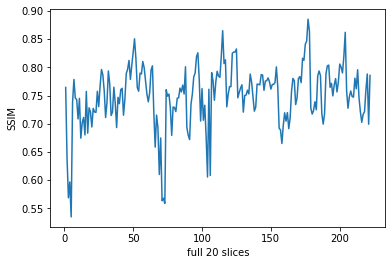

In [23]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')

# PSNR

In [24]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

23.082867047640608
23.291612302138347
23.485468031786738
23.553091704377152
23.237071722508965
23.386666448153747
23.363417836448313
23.298340848883072
23.064846207659997
23.13939806432614
23.364158905602448
23.363073702112214
23.249804789999008
23.373684242979603
23.476129699712452
23.420224543013113
23.144465810689777
23.142507857649978
23.001132643989095
22.77844983831247
19.242047440533582
19.25881819277677
19.501607737804658
19.803425527713937
19.870332266268107
19.867572958612303
19.762930590287834
19.617458239731857
19.423067908228525
19.243045629026547
19.229499509368694
19.153388228882736
19.040382771587506
19.04248493803078
19.04012542273234
19.07120094283695
18.94463989565273
18.916603110633414
18.898605290782857
19.082006204059848
17.977748243922363
18.035374778551517
18.35784090984412
18.686008670625196
18.854043073590095
18.986510110372482
18.987899752121265
18.854712030621283
18.488549814291506
18.202846927731425
18.014716350473343
17.787264458193917
17.569702501978462
1

25.526095216505553
25.221569710437393
25.077331398710754
25.15586800190531
25.267177360169416
25.298273980003643
25.30332540225167
25.189853357372648
25.13756885823757
25.051999283212783
24.974960512073963
24.975007094621517
23.590335275509076
24.338630100248682
24.99531198189487
24.657238346088135
24.26934706696703
24.22619392868372
23.984086083942454
23.7996752626869
24.03594922939771
24.49754716733631
24.75878856188703
24.84693125734173
24.683851938859704
24.593233037046147
24.623818966649708
24.787924329150506
25.02525425370851
25.142980163934496
24.600214578401868
23.994746337842603
22.420679048340922
22.92826242615191
23.160070103694498
23.0561105529604
23.237383554883554
23.44733080557591
23.368458890870855
23.49303592356252
23.44382075522603
23.41293853931179
23.54749309458203
23.67969526626149
23.9776286379335
24.198023770521623
24.37543664473941
24.47832542323141
24.362399990422105
24.23433764783588
23.361061751841486
22.487926873513597
23.243476711498626
23.281682296265164
2

23.064561460425193
23.171634347528972
23.227871074513146
23.319139211987753
23.543399899665868
23.700807951445675
23.785192522362337
23.734609898838038
23.585295402562437
23.31989658726476
23.15174260727553
22.8911852673901
22.841117464504997
22.743211082816078
22.745826487195178
22.824196143053527
24.805015628926192
25.638914175845002
26.381539964175843
26.486437420464107
26.223308230990625
25.979463051735856
25.91045109109631
26.03135481174034
25.974650815113197
25.93923648634489
26.225142502920377
26.165940061814844
26.158053411427606
26.628043898628224
26.82892414085815
26.81248085370698
26.787691493310398
26.589554603717875
25.963909342424515
24.509177588550063
23.95616637828634
24.654159294913587
24.80066935039357
24.25425721894538
24.109543765029184
24.124090084069408
24.1315098725096
24.13068459661561
24.356613039430208
24.647152015392024
25.190680208536026
25.33161946489672
25.26434674959144
25.15201962231361
25.08668045510527
24.842623050470216
24.654471044537654
24.518948397

20.167117811322296
20.129701964318507
20.16816114484606
20.068821564907964
19.824921444754466
19.70882962964277
19.640517271137067
19.49980744870877
19.502569897871755
19.52125390088594
19.535739062765888
19.4390818976707
19.32021633380647
19.444639616711484
19.731608642460202
21.00375748156211
21.066027794527912
21.06479741970649
21.195337670140457
21.319777117610172
21.284701596688453
21.055538457703346
21.088411862053718
21.26320511944687
21.123567540985935
20.93300124748395
20.749531319891247
20.720566162808485
20.80072450983012
20.79253199720344
20.901609864784312
20.9314937097675
20.88404801277575
20.92866239278516
21.083771844180525
19.070570571022813
19.10428352567483
19.056417485402555
19.170706034235376
19.305281104227692
19.179457470198287
18.812772711496322
18.836026620577865
19.086805210523544
19.199440299571926
19.239731146231954
19.34755542249153
19.325920684787725
19.27264613894794
19.261587993697074
19.35289519264536
19.318233881544863
19.253437033858642
19.19917116467

18.987635287175305
18.968821265789003
18.891415642120556
18.901949380537214
18.91087830601563
18.799666632181513
18.567609993267414
18.40627575051569
18.39988237475121
18.46317587099267
18.36666955590903
18.33951931020356
18.474003453519202
18.76815522932517
22.253929630177936
22.102998828319432
22.202616994175237
22.576153412717016
22.77732702837973
22.712639530623694
22.542014449058293
22.40137282148117
22.051903383450885
21.743625924595914
21.651975524435567
21.742570532231294
21.621074698400097
21.50082793972917
21.442601056379562
21.50842469500258
21.39468316005771
21.40847540935093
21.527487432061854
21.9809350566796
17.579731287109208
17.610729316568555
17.673175109743156
17.817107525076477
17.90904230354081
18.00971433124898
18.03404280900142
18.05704852165077
17.924839524152322
17.817933566484776
17.756353757063618
17.679621931391882
17.476292066327524
17.36976296260229
17.362788277615017
17.441025495912946
17.405542859988245
17.39811491327317
17.444424644437802
17.71470946058

24.48203549010679
24.897119817572303
25.44823286545482
25.72984995138544
25.61438996003912
25.70777895139297
25.803705894262784
25.84917859889525
25.606933968231868
25.414389373300807
25.11857461130635
25.026379048762273
24.968547303441508
25.015183449988243
25.175911570809568
25.195032248679915
24.993398847784697
24.670881677326673
24.604418724212408
24.36083315723584
25.515494988831623
26.022673123285877
26.292349018517086
26.472869920051785
26.611173027051173
26.591339134920375
26.608167841749868
26.536575237598004
26.49726448640671
26.390479017053387
26.144588426321466
25.908192543850774
25.809773220277457
26.036876867317424
26.20194231786987
26.280700403285188
26.38198300439325
26.278615491432376
26.087044045217613
25.700021267899725
23.74997367697425
23.71638008483627
24.022431817156573
24.358237860436752
24.376468444910863
24.38181873892578
24.485092434787678
24.499623681916397
24.622493301422466
24.17797446749265
23.81218950358715
23.454264165569985
23.70377966479644
23.5690259

22.954354986372934
22.76493041661896
22.829382676980853
22.62062231635226
22.461343089496523
22.45565942107326
22.772228909304005
22.766776751624683
22.940074342467852
23.124010804147844
23.287035206380402
23.24746354588345
23.29528097503672
23.303078914109996
23.336767262648053
23.3608676735494
23.403819176362376
23.39535668764539
23.280827151461637
23.183835353689762
23.20673249267218
23.102408908040474
23.011877902985187
22.70227233150072
22.462757300095987
22.343107217136385
21.789256220649555
21.860579990948633
21.6318188309315
21.476554394803923
21.771300670777528
21.764030833621707
21.899960961890642
22.09519774270834
22.262235387338315
22.300656987952962
22.220534810522764
22.213908659932905
22.16767808757485
21.947774776665025
21.925593325482467
22.096122429393944
21.99148332165982
21.808008889560803
21.319843247680176
21.56989648477783
22.70706861901258
22.548074936915313
22.774694941704556
22.66538410585411
22.891256235835552
22.972335182333147
22.99824658968923
23.042779484

23.991499982642416
24.087842526542026
24.108569791946998
24.03174258385816
23.964145296516467
23.877800060247
23.702050559254985
24.116004481343403
24.320110371475636
24.3469449354576
24.21264365956666
24.177112729101783
24.122276265848694
24.057115380793775
24.07938987720061
24.31302456851162
24.28830121406227
24.329634698366732
24.28657969146147
24.535548233167667
25.06182308930605
25.082526508867904
25.06557740279513
24.916207734652197
24.893632751137616
24.700623269520534
24.385825325874787
23.968782066246803
24.204455976300963
24.222641457048965
24.311033096109945
24.146171123913295
24.192071516937936
24.095423168817305
24.152235318262555
24.478132408323173
24.75342558199639
24.826926542811144
24.882364378618185
24.78698622313853
24.847039037920364
24.699925689605543
24.7264578594076
24.724603782320976
24.66280645423966
24.409728476738533
24.18818863407001
23.602883970487557
23.778297533502617
24.09405428943517
24.237138057054352
24.422837159694627
24.531699460254526
24.5121894279

25.604993888787426
25.68335454655974
25.63899586248575
25.768324675189387
25.740698510888702
25.76825881514992
25.812195576616567
25.70156839547638
25.57797129094951
25.587779005192704
25.566155632888993
25.56196105191578
25.56764007799704
25.58257963650182
25.352357978578972
25.404768043511837
24.90096840757939
25.106531034762778
25.302638165339822
25.331879851297465
25.29793216652658
25.239971077108272
25.09116009738247
25.088939277912313
25.28083360678531
25.3649644122355
25.217012196149376
25.06117678427273
25.189061452860354
25.24825647368757
25.27676967681044
25.4756814541286
25.65901951035584
25.627572689819825
25.415822095179177
25.22176840668991
24.983469909347342
25.295300551620667
25.53932397192898
25.793958772288338
25.899975805911435
25.789092553333983
25.5220898366414
25.173387733224676
25.072438566786722
24.99960296285977
24.753315920077537
24.382077593430008
24.501961253524833
24.491832987231632
24.632250716249402
24.81738013581509
25.199128291179846
25.46752212083929
2

In [25]:
np.mean(results_psnr)

23.63022544460902

[23.260820612399165, 19.3004621402776, 18.022479371024442, 18.570996051227937, 17.456050543724942, 22.89970522869686, 23.15329028299417, 22.389494309620222, 24.610187507995676, 20.153950088786114, 24.098737943846437, 20.500597838589634, 18.959953047652384, 18.523763560382214, 17.897987168193204, 21.42409688716001, 20.37707227358784, 22.39395689739002, 22.896120078712887, 21.549433412846, 22.0349971873112, 21.833904159563794, 24.020745526255233, 25.419391153583987, 23.79808792635196, 25.703715768299297, 26.291643576172117, 25.220927114342487, 24.472602893378863, 23.533520985073046, 23.965785787223957, 22.80159947521207, 21.575407877337533, 24.26407254489809, 23.439156473330687, 24.982562121772865, 23.3081307321745, 21.388446150814648, 25.006685064259067, 23.265245455990843, 24.7612863695634, 25.045341536709454, 22.738490020594632, 22.5616086100667, 24.33687801689897, 25.502387045003367, 26.837125972724984, 23.340223293840303, 25.296740426457305, 26.507780550315818, 26.68102245093914, 23

Text(0, 0.5, 'PSNR')

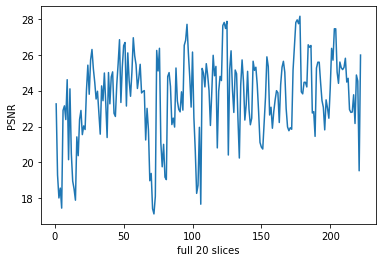

In [26]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')



# MSE

0.004917148170157838
0.004686393692207119
0.004481807477159852
0.004412562090845295
0.004745618558713055
0.004584936816565122
0.004609546669422849
0.004679138659937382
0.0049375940294557955
0.004853557662032478
0.004608760175105751
0.004609911943723993
0.004731725270036574
0.0045986629047389945
0.00449145476417423
0.004549645365380389
0.004847897388873805
0.00485008348512897
0.005010565405805802
0.005274180833423469
0.011906805405339272
0.01186091464852698
0.011216031652059531
0.0104630294382155
0.010303072915665186
0.010309621094936041
0.010561046163399111
0.010920793018897512
0.011420712769389144
0.011904069043058886
0.011941257102409099
0.012152375406274032
0.012472735791764042
0.012466699928306657
0.012473474907620885
0.012384540728052737
0.012750758211374728
0.012833339661369155
0.01288663331313711
0.012353766248713621
0.015930344790335504
0.01572036126257425
0.014595396884600096
0.013533157398283379
0.01301954157139816
0.012628419174145939
0.012624379018928036
0.01301753628616017

0.0026233395574031797
0.0026471664619174794
0.002778996982584606
0.002874653932762952
0.002946467802151894
0.0030255601806740825
0.0030156247640893965
0.003037071551391258
0.0032542096884080217
0.002320474120464116
0.0022508883567856942
0.002227683877170551
0.0022044540948086147
0.0021867704563556813
0.0022388614160601134
0.0023309360900148966
0.002343058523725602
0.002372523259304504
0.0023267114339317286
0.002317762748868266
0.0023197311343952807
0.0023212870366594177
0.002385932164050114
0.0024187890294044565
0.0024607439343697717
0.0024832005146085043
0.0025292928034874778
0.0025050112243603286
0.002472589792468772
0.003105318551522002
0.0031350423893617184
0.003044818978268725
0.003081890538953184
0.0028933372149083938
0.0027755945789284297
0.00285355631198926
0.002852193561421365
0.002801499042368194
0.0030049899851889925
0.0031064678273459386
0.0030507962213512704
0.0029735980547457284
0.002952382361189324
0.0029489503442972293
0.0030270156357162566
0.003063677973349591
0.003124

0.00423193520991666
0.004379963181058568
0.004655971800337639
0.004839781323183285
0.00513903379009631
0.00519862215805861
0.005317149749293927
0.005313948624071457
0.005218916947917152
0.003307489217932016
0.0027296601678205488
0.002300625894154624
0.0022457233672852467
0.0023859930642414168
0.0025237927871257036
0.002564217683642431
0.002493816642196847
0.00252659084692249
0.0025472780387523885
0.002384985536819366
0.002417719948318629
0.0024221144401732455
0.0021736800034175283
0.0020754275905765017
0.002083300483401783
0.0020952258841533673
0.0021930298328082147
0.0025328476375174836
0.003540643829284977
0.004021456378332067
0.003424396705109247
0.0033108009028684545
0.003754691660949624
0.003881911440986639
0.003868931063938229
0.003862326756740793
0.0038630607720628552
0.0036672346216202003
0.0034299263801766513
0.0030264393785319676
0.0029298005318809375
0.0029755367949486264
0.0030535007975675244
0.003099787727414782
0.003278971900504721
0.0034241509004502577
0.0035326870006700

0.008316250240565051
0.008331952785582445
0.008125292678686197
0.008069574380696535
0.008158215982057068
0.00807483693251411
0.007791531227060979
0.012386338455708976
0.012290559325086083
0.012426769747001963
0.012104013421357716
0.011734697252801296
0.0120796472717625
0.013143854074932636
0.013073664564860851
0.012340122727360073
0.012024193873762867
0.011913157551803675
0.011621025596104489
0.011679061127671767
0.0118232095277867
0.011853352521958058
0.011606746005747879
0.011699750808058615
0.011875620113908547
0.012024939043359991
0.011930796243324474
0.012414807387506548
0.011992032232969347
0.012202644255614415
0.012234589116896396
0.012233740003580958
0.012399680866694221
0.013104900260630877
0.013496720948088866
0.013783735858593438
0.01357675688643313
0.013614183474472009
0.013148288101879346
0.012590344730730264
0.012270274761630154
0.011988973411528063
0.011544767376221458
0.011715143054041218
0.011618264573265173
0.01159336596316986
0.012047650324101624
0.003257677484814952

0.01772634083334942
0.017722503426245907
0.017193206843115635
0.015435546640207392
0.01325952832478071
0.013114168570581609
0.013179323029961191
0.012837741703571395
0.012659307333508733
0.012481217448908682
0.012625147807736548
0.012679959704870698
0.012907984516634665
0.012876714358796126
0.01285026753150051
0.013183579328516836
0.013907177596071463
0.014433525537168531
0.014454789198768012
0.014245654687391527
0.014565756465042105
0.014657100610417632
0.014210182469987443
0.013279584203462655
0.0059512341384932825
0.006161693864362385
0.006021966019745499
0.005525666360990289
0.005275544578175868
0.005354711129672854
0.005569273615750126
0.005752580673167213
0.006234615309638474
0.00669325556170541
0.00683600619400031
0.006694882307957479
0.006884819045966729
0.007078108343448471
0.007173645219522953
0.007065738014502745
0.007253233921964338
0.007230235764610189
0.007034791931327051
0.006337332507834985
0.0174593017626654
0.017335128621613783
0.01708765586562828
0.01653062399279443


0.0033308200399064345
0.0030641473102166143
0.002911339439493484
0.0027410587724775587
0.0026560370650880196
0.002661637504635469
0.00277715127032809
0.002997254841035381
0.0031421057807082585
0.003111401595900752
0.003020683828057622
0.0030189703996533453
0.003135039357987873
0.003273425645086427
0.0033566580361843994
0.0033451843253970506
0.003112010357280075
0.003110584362700274
0.003240404175132692
0.003260639305081209
0.003128599355547549
0.003001807092494788
0.0028854270223886893
0.002860036281237239
0.0028739879782247292
0.0028873163161049504
0.002924811568515391
0.003079252264669317
0.003317687204903991
0.0033737343658204735
0.0034881484105205073
0.003518219769586423
0.003562898904040887
0.0035240073815287157
0.003518172582236797
0.0034844677884470878
0.0031966986502567846
0.003197265852644413
0.00326526715435785
0.005700316325570089
0.005331468686226056
0.0051991726429611255
0.00486361386920188
0.004720193364893978
0.004621641185733995
0.004609266384235241
0.004739066944847299

0.005681121243921462
0.005281741098688932
0.00528837599043765
0.0050815074396887705
0.004870784547630763
0.004691335357559596
0.004734276790031391
0.004682436564838273
0.004674036597638605
0.004637920219592612
0.004612254174891894
0.00456686403931574
0.004575771523642474
0.004698046217238102
0.004804148956963438
0.004778886881994727
0.00489507228308464
0.004998183652125679
0.0053675088212297665
0.005671843903477769
0.0058302782007418905
0.006623299256218506
0.00651541376299656
0.006867807551046953
0.007117780000675905
0.0066507394303474115
0.006661881704679998
0.006456600327541902
0.006172771854202782
0.005939863450750395
0.005887545835521062
0.005997172197267306
0.006006329231947766
0.0060706080188685264
0.006385906012664938
0.0064186052566168415
0.006171457706182135
0.006321958896137155
0.006594761760682842
0.007379308641970353
0.006966431185832608
0.005361584291650775
0.005561507232105914
0.005278742845665038
0.005413293686248627
0.005138949813376695
0.005043900163427334
0.005013896

0.004094680252178857
0.004263781531052018
0.003876140867336751
0.003698187810968939
0.003675407578204058
0.003790841566799995
0.0038219827895628914
0.003870547249172447
0.003929058199845483
0.003908958073103666
0.0037042265750273306
0.003725373994565301
0.0036900863598691327
0.003726851007759614
0.003519209948500147
0.0031175806056913443
0.0031027540353149204
0.003114886738311293
0.0032238826613102713
0.003240684298220135
0.0033879553104956845
0.0036426501918340472
0.004009791522982621
0.0037979951198994534
0.0037821247912357505
0.0037059255504698547
0.0038493099970861684
0.0038088410428187055
0.003894553580175439
0.003843938831846943
0.003566044506693755
0.0033470133284121606
0.003290844381462813
0.0032491036208070535
0.003321248549030867
0.003275639475124296
0.0033884995401584454
0.0033678614286473223
0.0033692995329865014
0.0034175852337630635
0.0036226564675307287
0.003812247923984138
0.004362260563090619
0.00418957767475771
0.0038957813218557288
0.0037695212359576723
0.00361173837

0.0032352150873817213
0.003085651657469584
0.0029494170294543432
0.002929624877485601
0.002952614738950718
0.0029922845643848223
0.0030965920199653944
0.003098175906187414
0.002964262359411062
0.00290739178363599
0.003008145096257222
0.003118044589935941
0.003027567640404657
0.0029865813765187306
0.0029670374793412243
0.002834208881147867
0.0027170526179289244
0.002736797919432978
0.002873543596387822
0.0030048525055259207
0.0031743368377532065
0.0029544044231222316
0.0027929785658410617
0.002633929356602794
0.0025704101022131637
0.002636882297747858
0.0028040839805508052
0.0030385138948511156
0.003109969596483163
0.0031625667725390027
0.0033470978435403355
0.0036457949636218797
0.0035465319334459177
0.00355481252162737
0.0034417151882805653
0.003298086079105687
0.003020557941037074
0.0028395386729833058
0.0027597898316402717
0.0028562571190953513
0.0031086638355703367
0.0031332471026886497
0.0030265130311599203
0.0028748093218653316
0.0027101369523245015
0.002674609813956813
0.0026215

Text(0, 0.5, 'MSE')

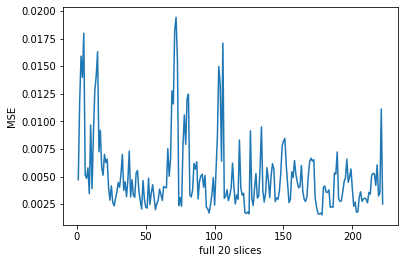

In [27]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)
        
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')





#  U-net 13x

In [21]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/results_unet_13_Results_unet_13und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,1,2,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')


recon_unet13 = recon


(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


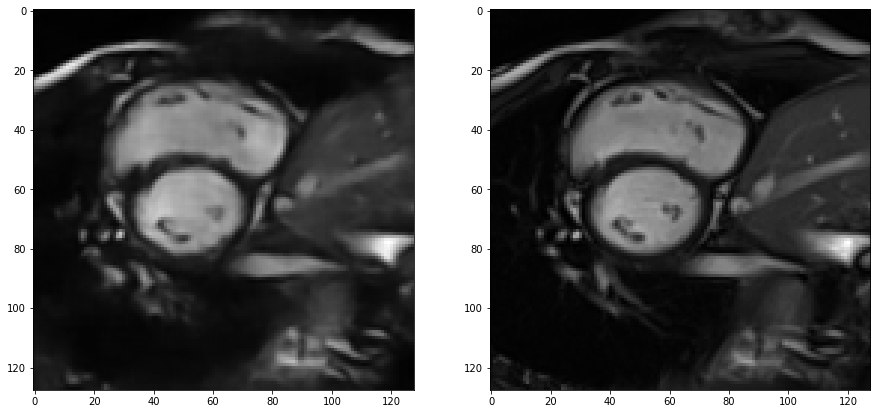

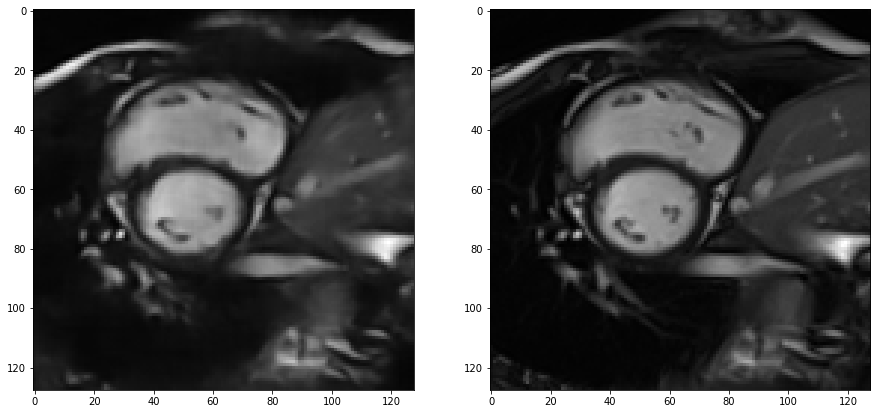

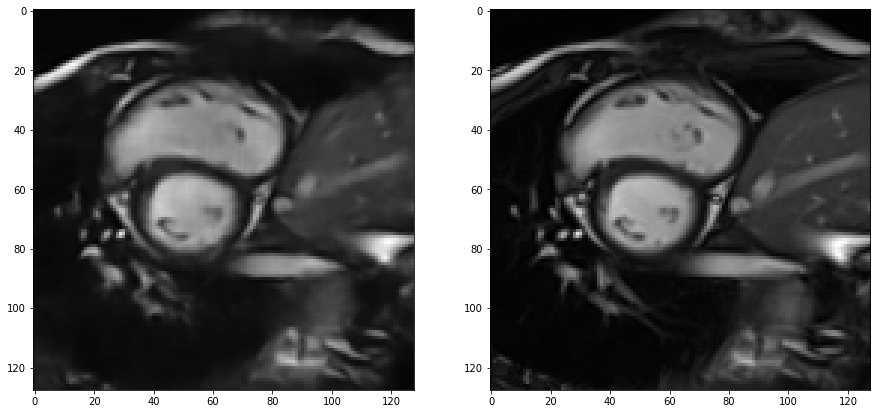

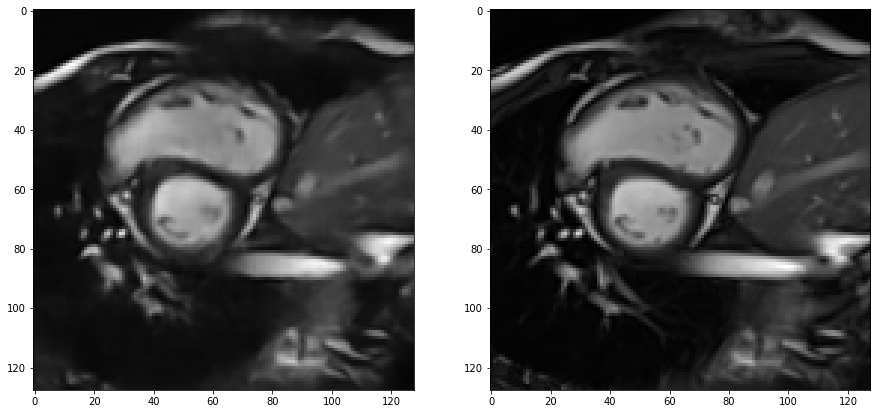

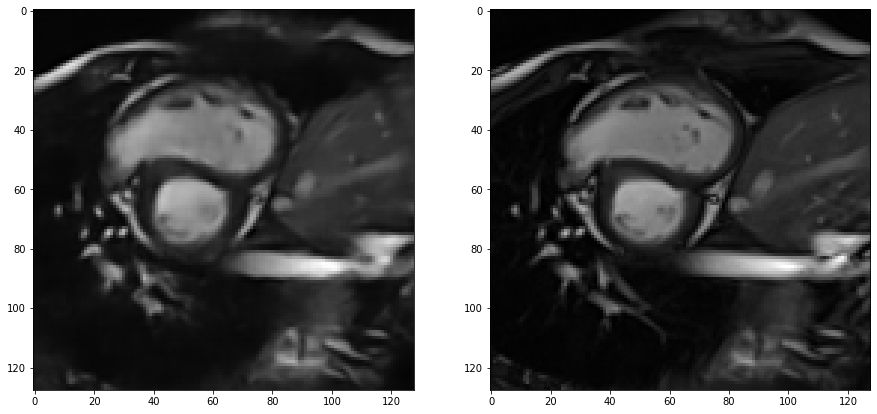

...

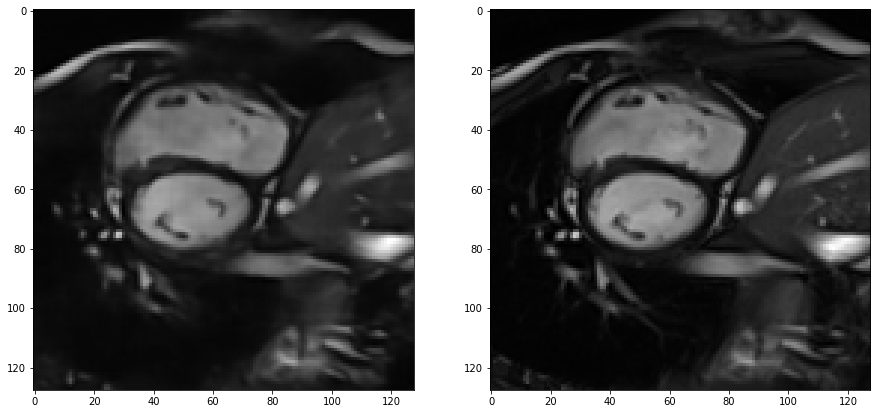

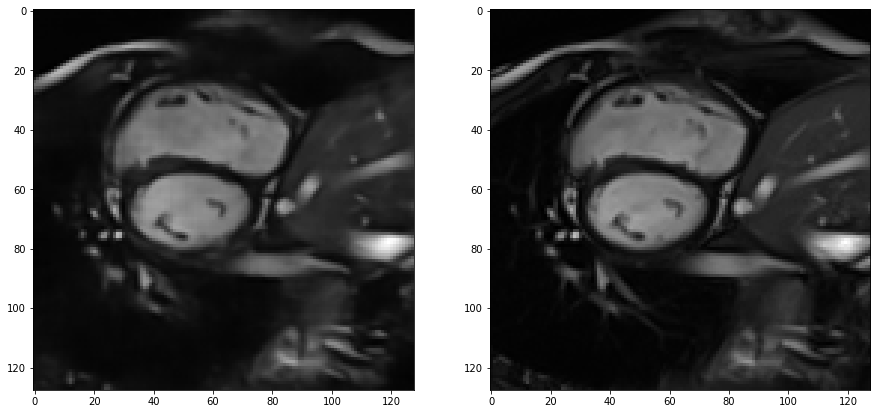

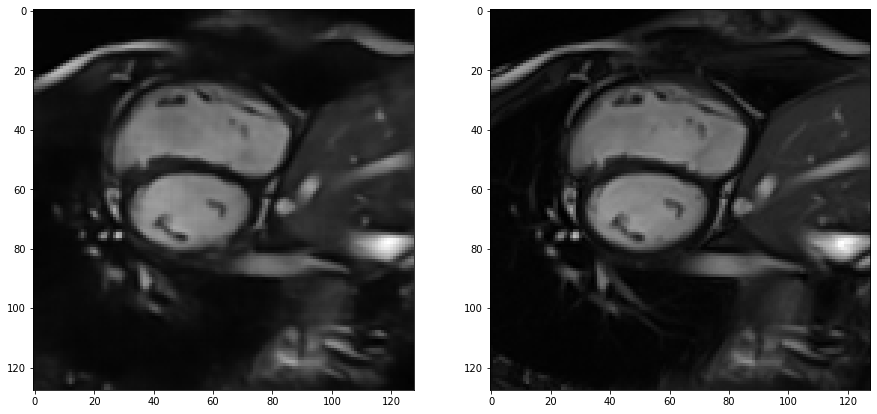

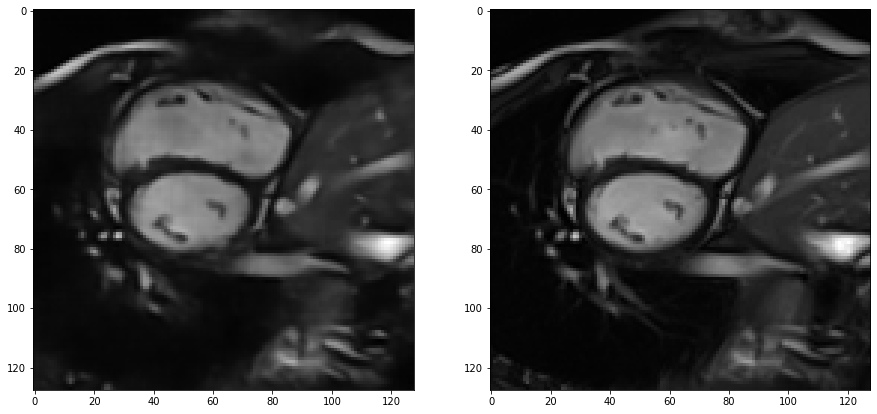

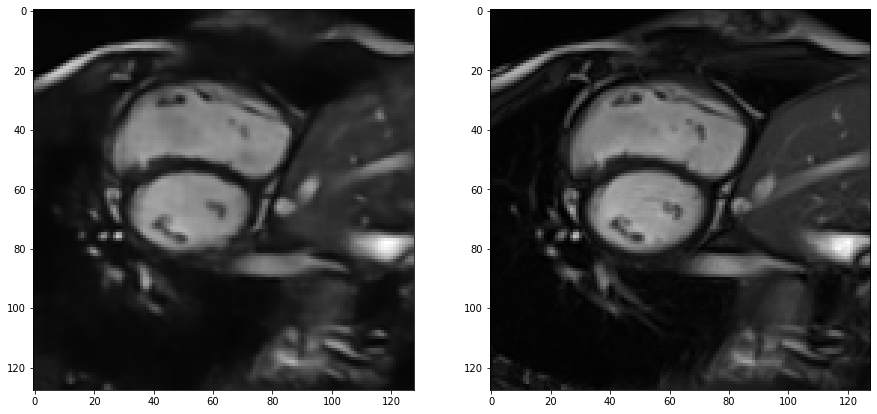

In [29]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

# SSIM

In [30]:
results = []

In [31]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.81234527 0.8145111  0.7937676  0.81358665 0.82811004 0.84979993
 0.86181474 0.81971747 0.8089935  0.8010586  0.8305461  0.7897595
 0.78418934 0.77298415 0.7686423  0.85114425 0.83101416 0.7733625
 0.8066921  0.836525   0.8235419  0.8348041  0.814479   0.80418855
 0.8076516  0.82307893 0.82755065 0.85819197 0.8210482  0.7777908
 0.8139343  0.8688611  0.86817825 0.80880696 0.8126808  0.8124739
 0.81908965 0.83415395 0.8657641  0.86817646 0.85569066 0.8724051
 0.80117315 0.833548   0.8571206  0.86155164 0.8674168  0.8611002
 0.8777122  0.8767718  0.89821726 0.8853836  0.81650484 0.8134944
 0.86379784 0.86084276 0.8451937  0.8492681  0.842783   0.836752
 0.8371499  0.838176   0.86278814 0.8433628  0.81259173 0.8038438
 0.8336051  0.8458365  0.8641331  0.87119925 0.86962944 0.83724725
 0.8135719  0.8139675  0.8367513  0.8450774  0.84255797 0.798174
 0.825349   0.8627668  0.8377429  0.79128003 0.7962724  0.7996077
 0.8042081  0.8531488  0.8477546  0.8793702  0.7962276  0.745956

tf.Tensor(
[0.84308416 0.8400167  0.80883276 0.83634925 0.83534825 0.8752589
 0.88438225 0.85709924 0.8425952  0.8329221  0.8610058  0.8350104
 0.8083461  0.8122721  0.8015419  0.8755193  0.8590056  0.81576014
 0.8082226  0.835963   0.7990844  0.84971064 0.8245395  0.8103582
 0.8235348  0.8474584  0.8565987  0.88292813 0.83781517 0.7975442
 0.8493456  0.89520764 0.8963475  0.844645   0.82540977 0.8624001
 0.8513891  0.85457104 0.8863587  0.89953315 0.88861257 0.90771234
 0.8495709  0.87569165 0.8839321  0.88029057 0.8777761  0.8596108
 0.8837623  0.8882359  0.91140896 0.90763927 0.86099386 0.8564408
 0.88484293 0.8788827  0.8474192  0.86990094 0.87175304 0.8537967
 0.85479295 0.85106575 0.88778776 0.85647166 0.82230335 0.8169675
 0.85035145 0.86003494 0.8714778  0.8872219  0.8779359  0.8506065
 0.83578795 0.8583845  0.8582925  0.87137526 0.853194   0.8039668
 0.83504575 0.8749865  0.8353614  0.82184947 0.8273615  0.83510226
 0.82722896 0.8827669  0.8800741  0.9100493  0.83928037 0.7696

tf.Tensor(
[0.84386545 0.83795965 0.8092745  0.8440502  0.83640224 0.87154686
 0.8835329  0.8625172  0.8442809  0.8224961  0.8504884  0.83963597
 0.81497467 0.8146555  0.8059487  0.87942034 0.85996217 0.83334374
 0.8456248  0.86681014 0.83209115 0.8308505  0.81868887 0.81685567
 0.82695425 0.8502778  0.85273623 0.8849636  0.8528986  0.7950538
 0.8382883  0.89186555 0.8915134  0.84581614 0.8293546  0.86992866
 0.85868675 0.8549065  0.89032286 0.9062012  0.89955014 0.9104726
 0.87175167 0.87066394 0.87287056 0.8841226  0.8731894  0.8571721
 0.8776804  0.87815833 0.90823144 0.9055643  0.86163884 0.8559092
 0.8837332  0.8767873  0.85686797 0.8688524  0.869934   0.8721159
 0.85533106 0.8583549  0.88867134 0.8527216  0.8490748  0.8336859
 0.863543   0.8621634  0.8776235  0.8876739  0.8817015  0.8543049
 0.83561045 0.854291   0.85400295 0.85407364 0.85181135 0.8058923
 0.8304508  0.8754995  0.84672403 0.8114011  0.82859147 0.82724047
 0.8228787  0.8733963  0.8808676  0.91708475 0.8530587  0.7

tf.Tensor(
[0.849584   0.84675986 0.8168453  0.8487087  0.8487863  0.8773522
 0.8884171  0.8707964  0.8593339  0.83373666 0.8635183  0.8519989
 0.8106248  0.8066475  0.80282474 0.8850266  0.85578126 0.82804275
 0.8680671  0.89370805 0.8516433  0.8753114  0.85937333 0.840555
 0.8620939  0.8749314  0.8773083  0.8938515  0.869733   0.82515895
 0.84378844 0.8953399  0.89063793 0.84683454 0.83484745 0.87447494
 0.8619408  0.8584342  0.89336026 0.9026083  0.89655554 0.9072251
 0.8738584  0.8703809  0.8935182  0.89824253 0.89106786 0.8814481
 0.89475876 0.8927643  0.92187035 0.89775354 0.87255394 0.86540747
 0.8900892  0.8863746  0.86432487 0.88169014 0.8772093  0.8831201
 0.8621944  0.85752064 0.89347476 0.8599852  0.85731995 0.8434167
 0.8829637  0.87656105 0.88913506 0.90251404 0.88931054 0.85630715
 0.8365725  0.8714228  0.8730676  0.876992   0.8699368  0.82082415
 0.8552953  0.88597155 0.85001826 0.80738044 0.82444936 0.83290166
 0.8264878  0.87515694 0.8834241  0.9155261  0.8533384  0.7

tf.Tensor(
[0.8574658  0.84657836 0.8133909  0.85099286 0.8512811  0.8733823
 0.8932531  0.8693338  0.86501116 0.8336731  0.8718021  0.841985
 0.81367475 0.8151328  0.8040379  0.8765629  0.8521626  0.83040076
 0.87034833 0.8961915  0.8508044  0.8815989  0.8614193  0.8468449
 0.8652625  0.87507147 0.8766747  0.8872714  0.8670193  0.8293065
 0.84576917 0.8925519  0.8919831  0.8490902  0.8429088  0.8714085
 0.85438514 0.8606227  0.89109755 0.8952814  0.88974833 0.9018785
 0.86679494 0.8812436  0.9066937  0.9060062  0.90284735 0.89760965
 0.90898454 0.90880585 0.92534345 0.9098307  0.87205374 0.8680806
 0.88513005 0.88247365 0.8630024  0.8818124  0.8792384  0.8821103
 0.8626472  0.8654663  0.8821619  0.8553097  0.8703767  0.8521532
 0.8716828  0.8786271  0.8867596  0.8985755  0.8913012  0.8528449
 0.8392543  0.87795496 0.8734155  0.88197964 0.8757852  0.8215947
 0.85427    0.88956875 0.8506981  0.809843   0.8303242  0.83359694
 0.8237051  0.8785901  0.8815294  0.90440977 0.8565494  0.78056

In [32]:
r = []

In [33]:
for k in range(20):
    r.append(np.mean(results[k]))

In [34]:
np.mean(r)

0.8651827

[0.8457861, 0.83970165, 0.811525, 0.8418509, 0.84221905, 0.8709668, 0.8848046, 0.86247194, 0.8465041, 0.82869357, 0.8585683, 0.8329576, 0.80556285, 0.80454284, 0.79605067, 0.8734948, 0.8507694, 0.8164431, 0.8455766, 0.87160224, 0.8330879, 0.85866225, 0.8387597, 0.8240115, 0.84142196, 0.8561838, 0.8606885, 0.88230956, 0.85482484, 0.8091582, 0.8393402, 0.8896758, 0.8881261, 0.84181863, 0.83063287, 0.86201763, 0.8509075, 0.8533891, 0.8867137, 0.8945347, 0.88696605, 0.90055907, 0.85688543, 0.8700064, 0.88792837, 0.89006597, 0.88536406, 0.8778577, 0.892862, 0.89337397, 0.9167684, 0.9036933, 0.8590285, 0.854667, 0.8828912, 0.8772516, 0.8556465, 0.8716251, 0.87039745, 0.86716634, 0.8558974, 0.85559094, 0.8839075, 0.85323894, 0.84607327, 0.83427, 0.86322385, 0.86577064, 0.8784026, 0.8907644, 0.88293123, 0.850962, 0.8335622, 0.8586049, 0.861475, 0.8672501, 0.86179656, 0.81194735, 0.8430873, 0.8799319, 0.84509647, 0.80860585, 0.82227075, 0.8260001, 0.8202531, 0.8719715, 0.8747244, 0.90550727, 0.

Text(0, 0.5, 'SSIM')

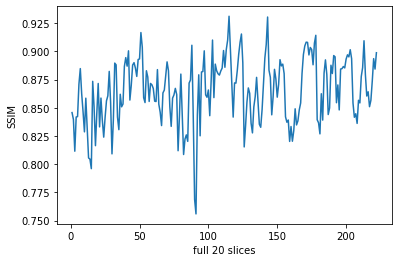

In [35]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')

# PSNR

In [36]:
results_psnr = []

In [37]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

25.691823528708472
26.262258276417633
26.718103334843434
26.6718076964625
26.682718335931813
26.770304944194727
27.022273177107646
27.462770905245193
27.69646300677468
27.787248079504458
27.754451493810954
27.41356019310865
27.29483000670549
27.148097473399304
27.090820782985467
26.87729270612069
26.959755650420117
27.040136675497326
26.836530380991867
26.16993162039424
24.836549901046645
25.335480818441262
26.01958216839443
26.307251814352973
26.308685443114044
26.50022543725114
26.87486064358673
27.304430981823916
27.34673515798547
27.105591341161215
26.968268841280324
26.574002345644438
26.131947118999292
25.748037775181587
25.677037551769576
25.725286145115152
25.682993856857802
25.61390618997131
25.54456492941021
25.309358378618647
24.355289680649182
24.739656599397936
25.349169697543434
25.62029722869323
25.823147716127867
26.24069610574484
26.50911924056321
26.567054332264398
26.328977317679417
26.024174024193904
25.754040877026682
25.286378481328097
24.842889371758968
24.634932

29.28536660513536
29.001814076233
28.591331309480076
28.121867895139502
27.33400822777842
28.08407210479472
28.538506892648485
28.769058109927286
28.738501068555074
28.637739731886207
28.69092019503819
28.654215644348557
28.583685277198118
28.657782304443444
28.78238554885096
28.823994406230593
28.985658221853235
29.076496620451596
28.987427500785444
28.923691043561185
28.82071081557087
28.614864934247898
28.386690036873286
27.467357253611908
26.05827886330271
26.352740302573725
26.30381280364585
26.013206691052908
25.853513425270847
25.725661458480637
25.736854006793774
25.693357737930477
25.7527563396538
25.860657801346534
25.962178786782793
26.08071724420708
26.08059352049372
26.190886354811784
26.005625871576665
26.010707882870605
25.85055072318355
25.68286797734681
25.494885918254404
25.255843080126024
26.535455067843607
27.41783481168875
28.184139084307954
28.266948117886876
28.346442218700744
28.438762538329485
28.661302885763295
28.878868763726636
28.948216204262458
29.02176352

27.62003138929864
27.62594297683338
27.58326411953647
27.565507625347834
27.71738371214135
27.717119674597296
27.715908698517815
27.83786327708181
27.95691620942362
27.7953560221574
27.566440542501077
26.96275477832929
27.702775436536967
28.269935629186772
28.678686467070094
28.87118347528709
28.846082495579893
28.905921154295257
28.888860314127545
28.9455585383441
28.987599159189227
28.681341798273976
28.82216654286186
28.988691678689307
29.239728041591917
29.242879430751007
29.211382624432897
29.193593891970153
29.226692487700028
29.01973697084221
28.715869446224293
28.271612350943705
26.757419004151195
27.307642816735324
27.770050286413447
28.13675390114414
28.13054199387349
28.106294709421817
28.225334754243047
28.126375241043156
28.303862746084178
28.19992815470414
28.089197680936188
28.392533172711598
28.618375223607934
28.63860293170438
28.72938027212214
28.692262236390743
28.730064918200252
28.74018479066455
28.630101004627065
28.40557465219335
27.377472351743094
27.82082516748

29.110753528993094
29.017453128848633
28.872011106763278
28.782658895171302
28.784700595116178
28.591351325321455
25.92740296706376
26.17936785303378
26.220115602036238
26.207743550139703
26.37801407560229
26.437610575155965
26.41541133979523
26.588416333931555
26.656751082538953
26.669126301773773
26.569262248423353
26.710209201004687
26.76422450925612
26.75634973657666
26.774737681259083
26.741086738614264
26.70414169388434
26.81311959234621
26.8637323192062
26.99771507297818
23.33076062080876
23.63586720845759
23.877539541262163
24.062210582530383
24.008224848638076
23.959014640884586
23.873104425654773
23.85595384373174
23.79418654905811
23.73739011382534
23.684637190109463
23.606379054641955
23.472342234215336
23.394251854258265
23.370525363778178
23.30416471826732
23.21890723152135
23.14883390165628
23.051932836879402
22.783260278820894
23.373997267862713
23.670014097659692
23.92904847943867
24.093998000886963
24.148749666498333
24.18095474352368
24.21836005756576
24.202616162924

28.754853354193607
28.933972090814933
29.113674212259756
29.211638650715763
29.19183788475115
29.13356304603313
28.851473577983867
28.86309337829179
28.819280781305427
28.846698371436055
28.805833302738083
28.805163040594547
28.808418210849037
28.856863135902323
28.729020038744345
28.847080174316325
28.887285290828515
28.677513966485293
29.043946914172153
29.16917722721605
29.48288847437608
29.653393066465085
29.687535285718546
29.714439476783422
29.547297775467673
29.497930153303876
29.038046985994583
28.80398929067105
28.633067781430682
28.509616581600554
28.393861541369716
28.475045980545524
28.434730312954986
28.62812241778867
28.430475258369924
28.36812241976726
28.0233233944274
28.875253765332136
29.363255367600388
29.424098110108574
29.533862987764792
29.81809941425051
29.99669962374036
30.263340983931336
30.293279028285536
30.134978686868557
29.980241432520593
29.935923834148518
29.96302059212858
29.925266328747078
29.809453039789858
29.7898717086364
29.806950186590058
29.86763

28.94187365667745
28.45655902876278
28.452982876114774
28.516389058369697
28.553373806678177
28.67929032467639
28.812990648447713
29.106509624474008
29.52038216359768
29.517958598359012
29.255305999163184
28.852871916102103
28.99957121812666
29.172107998579367
28.839687690033774
28.279786032580674
28.359684693320748
28.76465777374619
28.703158064286093
28.665715898364112
28.77346732280603
29.19170642190585
28.99148147664793
29.429727904229974
29.348031320508596
29.68127439137448
30.080901515977622
29.794758479698693
29.528879029328014
29.710993324839457
29.797008924745242
29.646917812652305
29.69673572616965
29.369063944711055
29.442273000535558
28.55826465167273
28.606305322813952
29.086238545519358
29.601863075469645
29.522514212788096
28.866078633518548
29.79526715799881
29.72511512545735
29.83156446910376
30.013261765691897
29.85478389459015
29.67195084744295
29.31434077812927
29.21254334983773
29.106409694647013
29.35945367874142
29.371504523982374
29.322922163745822
29.3124921978

29.469485170026942
29.435886692903818
29.41329362643456
29.472706578184933
29.363305832370617
29.207921085164084
29.08190946642626
29.059582196665367
28.96134280377753
28.85774327493249
28.39378511027234
28.31909328071888
28.2665097699191
27.989265868905314
27.836443583790643
26.515564490120074
26.918795026639142
27.019524334080405
27.002329519529727
27.190682568599552
27.259164618871388
27.4590158652782
27.694738324280248
27.754633843319848
27.682227685807455
27.716611268846126
27.766603770015713
27.828812673811633
27.82545325477225
27.87128896448387
28.04753725199617
27.914491696838148
27.793424681988228
27.646831290180106
27.680633743418266
26.03746343155815
26.227493655455998
26.275425369857665
26.279251863778548
26.43320663908125
26.41963103201664
26.40585626970656
26.372364106686895
26.47599684423142
26.549774787001144
26.520123623115953
26.630315575570872
26.637022918351732
26.59344316345425
26.545646422983353
26.555658070371916
26.595584824611546
26.650657111839394
26.635387387

27.459319444753724
27.402982666095962
27.62103554413368
27.76912040806961
27.76039725891883
27.849511355629723
27.981097828626986
28.03479560461044
27.82239766439586
27.438681878151783
27.37503647448852
27.56974266709833
25.834670682668918
26.04445115390699
26.092894056986932
26.069143790085256
25.866799079778428
26.021419872161076
25.88607582104142
25.774813955212956
25.82855577797995
25.73970897536043
25.726368067697265
25.736849061706426
25.79798666553849
25.71804972309911
25.853668794260372
25.73148343979167
25.66142774573947
25.432626671053736
25.219659018221257
25.207327615576368
23.973368903568883
24.79054955388483
24.83343758759991
24.744348036498263
24.93152996379574
25.033776326294284
24.516600978243236
24.467899875146163
24.625558931507395
24.441241882368587
24.359767398064108
24.463676316465822
24.56494517659351
24.578718304780285
24.996984387538323
24.808508512446124
24.60563619421552
24.61041013517581
24.431033740042164
24.715993997344473
30.114858845519063
30.25513911214

28.870667136009093
29.067456539798492
29.15337306920359
29.159955138503776
29.003658820168322
29.207662920510064
29.2889887520565
29.20985971588616
29.12704323309766
29.05170629545685
28.952502833421043
28.986562656028724
28.969614144269574
28.85874707341103
28.583561352818162
28.36028110611855
27.957660731008318
28.83251825236036
29.30782112729345
29.71630673606525
29.85365078948764
29.995937935104532
30.007027407474816
29.974055627777506
29.89857853783476
29.914751815688962
29.93836633937754
29.919002568701703
29.659627883651268
29.59050186499192
29.722777197362493
29.772051957053897
29.461387467646063
29.288607191248367
29.068797996898187
28.501982483580495
28.121063484349754
26.946860094601345
27.278847720934856
27.90964029156516
27.97908597056344
28.156683453916553
28.10201220101774
28.042685997946077
28.06784681701192
28.270827037864727
28.297373010009427
28.281241671294318
28.304410160081485
28.0053895741802
28.145317606958955
28.491091472955485
28.721211160873242
28.83007915782

In [38]:
np.mean(results_psnr)

27.678491421229854

[26.96755891343123, 26.145739842000314, 25.186271756506994, 25.571926383731647, 25.061729522072845, 28.749380911902495, 29.78778001166703, 27.992317225549947, 26.912505627114903, 22.729203097144463, 25.90004951362718, 24.626918281651946, 20.4113169984033, 20.49422049487393, 20.18887049056604, 26.99997560680916, 25.70481938494685, 23.314417738363154, 29.091323901429156, 29.799187838431322, 27.353503715429262, 30.01807232489302, 28.542979477191295, 24.657094130562246, 27.01722949720939, 28.79481222088064, 29.175314306476434, 30.207572367791585, 26.414107540895323, 27.54838289555454, 26.071281268746798, 27.1312604582517, 29.115192879533243, 28.57788829693277, 25.898284839485235, 28.27038472637876, 27.807244610850244, 26.38039435090614, 28.47559425389465, 29.417139237562488, 30.278161700499105, 30.079111176956484, 26.411923281826603, 26.652533185025572, 31.038058992660712, 30.57865409714223, 30.442251739698936, 26.495005300690536, 28.64983066843758, 27.613095912890866, 30.686674239630282, 

Text(0, 0.5, 'PSNR')

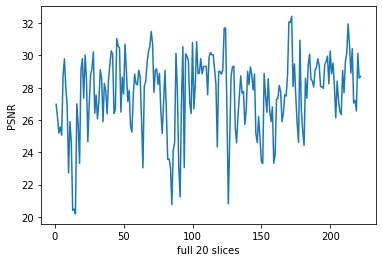

In [39]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')



# MSE

0.0026966069352879927
0.0023646897689460784
0.0021290686568484207
0.002151885852715512
0.002146486524770593
0.002103630726054593
0.0019850556308032992
0.0017935889080057553
0.001699627304153229
0.001664467010985141
0.0016770841351101166
0.001814027976874715
0.0018643051502070713
0.0019283694946752535
0.0019539701356321862
0.0020524412257031275
0.0020138375523650774
0.0019769074244797673
0.002071795864784359
0.002415498866141579
0.0032835604037492645
0.0029271967760461422
0.002500585929702277
0.0023403177071627613
0.002339545283565408
0.0022386049321549877
0.0020535909210253637
0.0018601882714995147
0.001842156336189756
0.0019473358800381907
0.0020098938248204225
0.0022008972381730493
0.002436718093490428
0.002661927497454037
0.0027058034415084467
0.0026759092788259968
0.0027020950029587347
0.002745423716265401
0.0027896101018712064
0.0029448566712021607
0.003668352251895557
0.003357641623714557
0.0029179848332895773
0.0027413865465588452
0.0026162860670081015
0.0023764593470420913
0.00

0.0018252367372107556
0.0019083342071982666
0.0017920705226677051
0.0017009688160740022
0.0016943458045351834
0.001724372836630881
0.00175673118989519
0.0017837899089744715
0.0017880790576723365
0.0018199756676373577
0.002006741788813925
0.0013385062960051893
0.0011067958683943482
0.001098540764999554
0.0011242839060173204
0.001069179933305399
0.0011377517668288884
0.0011585717283423274
0.0011187221098517396
0.0011568353891439898
0.0009827107234075501
0.0009398540178406887
0.0009014909977319183
0.0008497277744450831
0.0008639933476109915
0.0008413656169652136
0.0008307879622047248
0.0008135702470772252
0.0008355143374492338
0.0009023977792910118
0.0010519632246458563
0.0015838099803790803
0.0013726398220992079
0.0014442495361028666
0.0015425589311755107
0.001406088558558556
0.0014429400495669115
0.0014787883963718533
0.0014081305398579253
0.001518031477477444
0.0015502992542676527
0.0014443159336158789
0.001378572659412157
0.0012883896376665593
0.0012742897188172324
0.00125674416061447

0.0019453128296963097
0.001925681468439783
0.0019324979047689568
0.0020847180005736203
0.002321250047153679
0.0022796672642602022
0.002188619073491626
0.002194999359251799
0.002156715777579989
0.002125483439583031
0.002151343542323118
0.0023431103464335813
0.002468146234546962
0.0016117378961420462
0.0013387873443701942
0.0012845358758605259
0.0012752366256634816
0.0013280333441090138
0.0012533033099192468
0.0012346758886966056
0.001239396499737178
0.0012441732784077304
0.0012061933190239955
0.001302644629914274
0.0014498281596225003
0.0014275951576689682
0.0013548790905261853
0.0013670771623175001
0.0013974148901223832
0.0014096436670370076
0.0014467419560872464
0.0015613438291614645
0.0016707212150492068
0.0018142758786476353
0.0016468371808427136
0.0016514681770750054
0.0015982765347419333
0.0016271081158807743
0.0015365119781395157
0.0015023259902820765
0.0015509203369975552
0.0015572294148644104
0.0015322967010992748
0.0016670782378524632
0.0020624844496881533
0.001965377775661971

0.0006920760295831042
0.0006915313495351226
0.0006740815882719229
0.000648693688634292
0.0006620464354719678
0.0006595564306668574
0.0006659232723604993
0.0006796057404638764
0.0006785499366521231
0.0007111156047103695
0.0008264128597679886
0.0010489374013846835
0.0009789749392688067
0.0008925945192264118
0.0008843480989231159
0.0008710486922000197
0.0008323242180443625
0.0008186187534801964
0.0008043142536467722
0.0007588838703231034
0.0007240481234044638
0.0007320843169163038
0.0007789435314990327
0.0008006894592009007
0.000839869093357681
0.0008625498366172718
0.0008450702843706316
0.0008499661574979217
0.0008646109293623714
0.0008878421137707676
0.0009472251137969908
0.0018418139459824888
0.001855620092517923
0.0018906496329101794
0.001756409571070771
0.0016151084216467497
0.0015674679869456748
0.001507234098689537
0.0014757450089421362
0.001451616302548931
0.0014560496461293404
0.0015439796303210467
0.001617817271836038
0.0017147573086347453
0.00179238598148459
0.00178262826871014

0.007670311863592155
0.007486721750552748
0.0074844641267398995
0.0074546886722310305
0.007443962384007739
0.007408899309899035
0.007344702645321678
0.007335187757124962
0.007130073524238966
0.006863148134610384
0.007147087334265883
0.007145154656742411
0.007181105238169974
0.007373343101170493
0.007473507855301716
0.007673649320920278
0.008036015458353142
0.008175433298268309
0.008314163114756266
0.002183517546326348
0.0019599301987146206
0.0018541626099582349
0.0017730852274446868
0.0017680058812485839
0.001782017756294411
0.0018060486617701493
0.0018722168583351674
0.0019366251732127234
0.0019622237507969887
0.0018860772275634894
0.0017969196598573924
0.0018246412560948438
0.0017799446412392035
0.0018091807259246887
0.0018834458687041246
0.0019135653556803431
0.0020197186984618402
0.0020662694496699054
0.002161317154339964
0.0010341167506445084
0.0009476517918324979
0.0009150953105788085
0.0009265394342041482
0.0008940357789480045
0.0008832953288321611
0.0008716190427365997
0.000866

0.0035085908983579373
0.0034856139103865203
0.003312668684730488
0.0016266919853633603
0.0014186302548524724
0.0012734753018960813
0.0012389167439703522
0.0012925670758744622
0.0013261644819993756
0.0012848074340163396
0.0013070629845553044
0.001291757116740157
0.0013484009591322394
0.0013435842843761247
0.0013085655256444922
0.0011581821750177464
0.0011066755980107751
0.001062218584915019
0.001085497528147949
0.001099561470310082
0.0011259839132443726
0.0011879166369150847
0.0013465692860418041
0.0013693031269795073
0.001149261845846261
0.0011080261105843878
0.0011250242261986378
0.001211364869409998
0.001330167677038664
0.0013274272896212423
0.0013304506418618024
0.0013753282089071048
0.0014008776122382918
0.001386816573046255
0.0015604124526427446
0.0013229065504763162
0.0012389259547102762
0.0011547073432921348
0.0011277170495665504
0.0011242296543521194
0.001117131098708018
0.0011737684348674495
0.0013463860522956602
0.0016295835352036457
0.0014342396246610188
0.00137694647098179


0.0025987560934963437
0.002714351444516283
0.0028778547324878013
0.0031042463822011763
0.002501089679329727
0.002200560531945259
0.0020753773157707075
0.0021524976914110744
0.0021100764182878607
0.0022001375251825294
0.0022133470562732266
0.0021734136340628802
0.002254602930931801
0.002157652500250034
0.0020984998467145645
0.002243239039088535
0.002122504594653738
0.0021437224827889753
0.0021284820585203475
0.002116442597844043
0.0021408256322885877
0.0021226356389082773
0.00226796957941459
0.002360459158213347
0.001700879987963615
0.001443023766834826
0.0013051137848310895
0.001338126955756613
0.0012750180291089398
0.0012524261790523008
0.0012617817353793364
0.0012557177636642557
0.0013199231862390487
0.0012692876063257355
0.001159193246035433
0.0011820881532743051
0.001088826573945402
0.0010753101601333071
0.0010904362658253344
0.001136167045144728
0.0011579134414253524
0.0012226094737478883
0.0013077709680665054
0.0014007962081387338
0.0017392715271163789
0.0015396905960623386
0.001

0.0016763193137449583
0.0017033757572429789
0.0016915996472715606
0.0018499839155120019
0.0020251818138342843
0.0022167015054595078
0.001743429317663234
0.0015126428145673815
0.0014177989488331657
0.001453641708985993
0.0014867438347172068
0.0014690487916712842
0.0014161544845023568
0.0014635408511544604
0.0014393926677244476
0.001378308843331497
0.0013779927937102236
0.001414567466420468
0.0014476427664258773
0.0016031033556291488
0.0015871556477093669
0.0016420062850022177
0.0016268692222807333
0.0017059975910757282
0.0017521364657628867
0.0018988676402334815
0.0019623567124721054
0.0017829695176015297
0.0016663144394444063
0.001674791620590158
0.0016312453782356504
0.0015669467624086155
0.0014796183384647346
0.0014399450948450365
0.0014710603208074348
0.0014982034436089857
0.0014893223070173186
0.0015522483705312684
0.0016077257037940662
0.0017915810057066218
0.0017339839682953683
0.001731131750525198
0.0017570518417229285
0.001810567992614887
0.001917618605667152
0.0021385973030680

0.0014488174874122818
0.0014228075111214042
0.0016116683991151991
0.0013327231949603303
0.001284790185996059
0.0012203801794009857
0.0013006508214468884
0.0012609398088726073
0.0013770693048665089
0.001398378053046138
0.001353020592663598
0.0013801358661875852
0.001262476321096951
0.0012368608422075836
0.0012420095265655681
0.001381042073195978
0.0014873650071013762
0.0015752935338051266
0.0016359695422958394
0.0024724350113899565
0.002083165883267007
0.0019374159475669802
0.0019585745176504844
0.0018572107970669287
0.0017493052211201353
0.001725503765628835
0.0017655430182391112
0.0016842797807090312
0.0016697620040649996
0.001783159774990262
0.0017558815889423406
0.0016554886132851044
0.0016648107340471448
0.0016199582137212476
0.0016437338933686472
0.0017551045346871634
0.0019215524873467658
0.002127141476286512
0.00225148550013869
0.0014597843622074437
0.0012396835843448482
0.0012267817327223031
0.001239020106549713
0.0011416507974157956
0.0010853242553244221
0.0010597177046965933


0.0018182554135711799
0.002522867998001165
0.0020650669202459944
0.0018644295266411386
0.0018899090306926758
0.0018627867439373837
0.0018028270841610717
0.0018031765124033566
0.0018164323316291258
0.0017142714086541958
0.0017272644652376325
0.001774800783737266
0.0017380155905130008
0.001774685785702254
0.001717071693872577
0.0016798981773263623
0.0017190951845371697
0.0017989541686651502
0.0020699699399646873
0.0023182013964220954
0.002364645769277492
0.002395775901701274
0.002256074538413342
0.0021933985778951493
0.0020662384308944965
0.0022152016269789128
0.0024648048463908005
0.0023375947264902305
0.0022699666731080346
0.0022307220103793906
0.0021815259129452603
0.002173462798618683
0.002203997341839955
0.002130894838118496
0.002004103206710985
0.0019741682657895155
0.0021268048353532366
0.0023128083853511143
0.002343118172031983
0.002288566967211824
0.0025722000286600303
0.0026922400295693464
0.0025603637431888095
0.0023260950946987014
0.002252106286275342
0.0024413652033938695
0.

Text(0, 0.5, 'MSE')

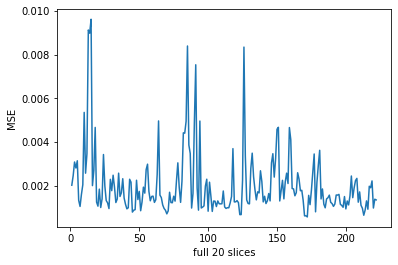

In [40]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)
        
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')





# crnn13

In [22]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/Results_crnnDCNormalised_13und_Results_crnnDCNormalised_13und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,2,1,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')


recon_crnn13 = recon



(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


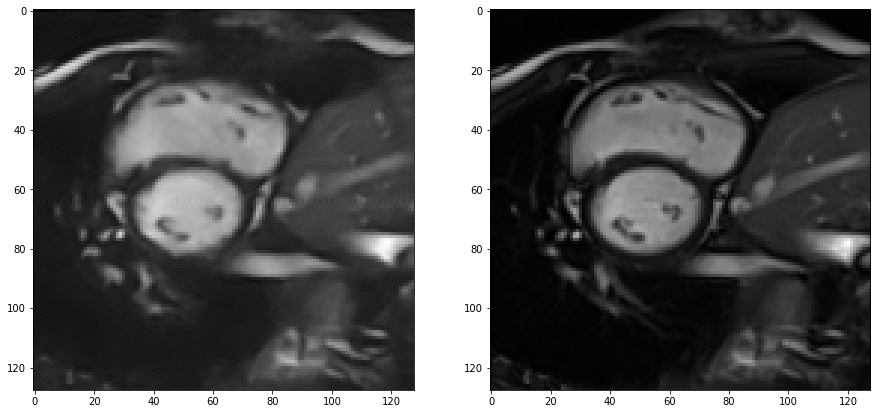

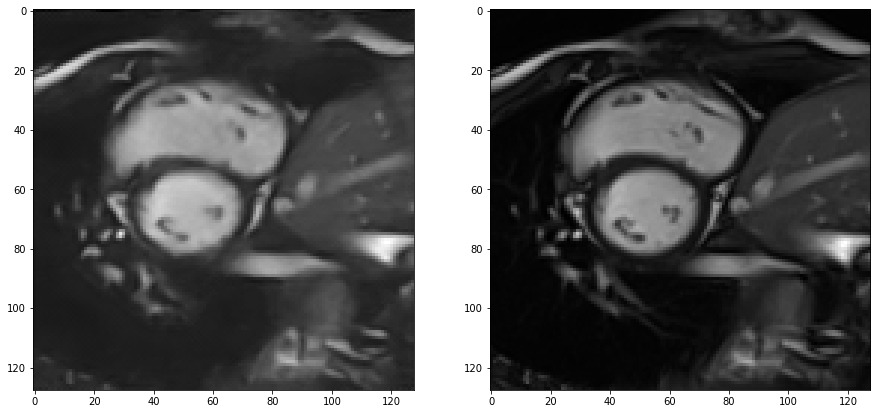

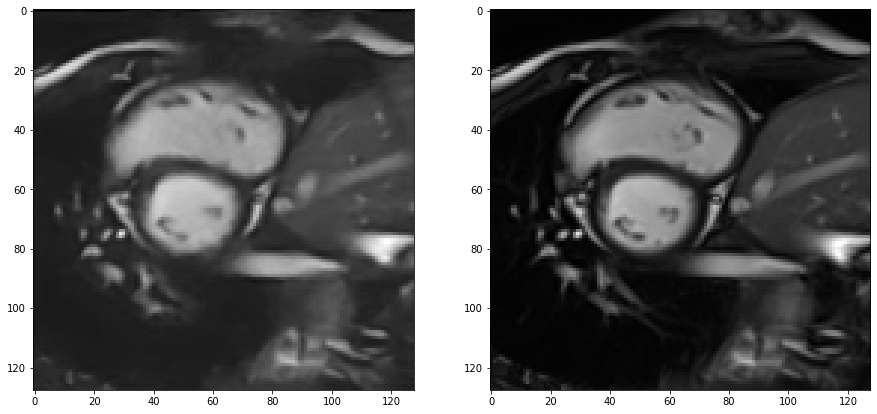

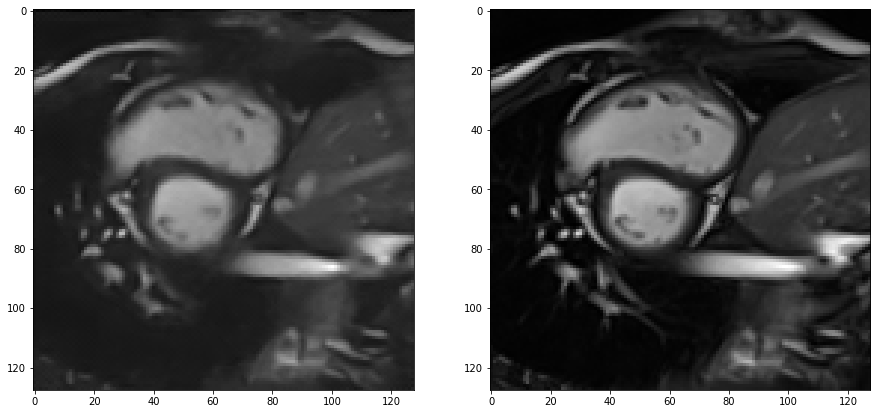

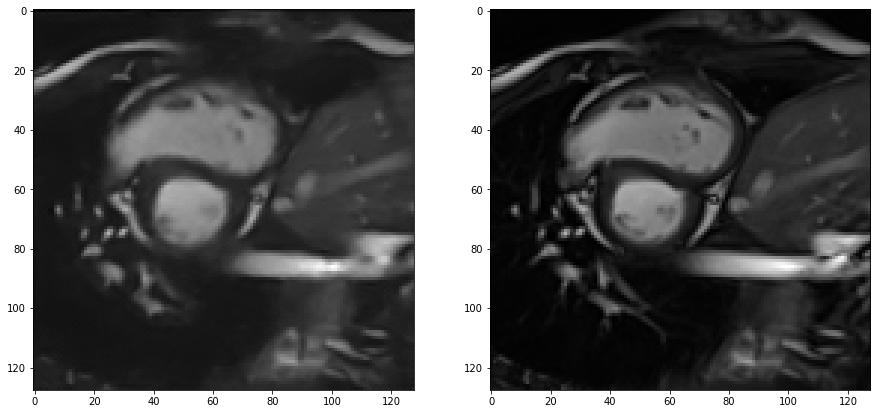

...

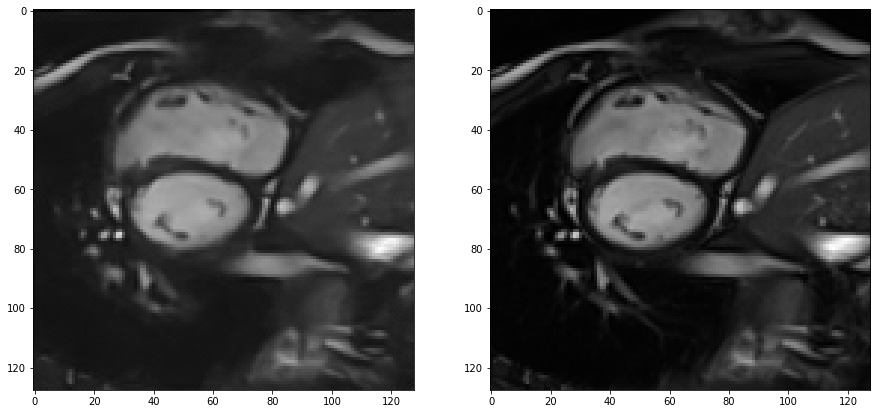

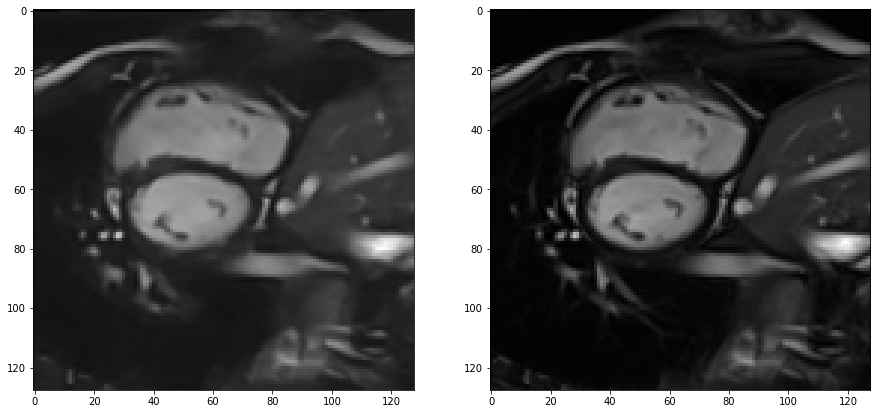

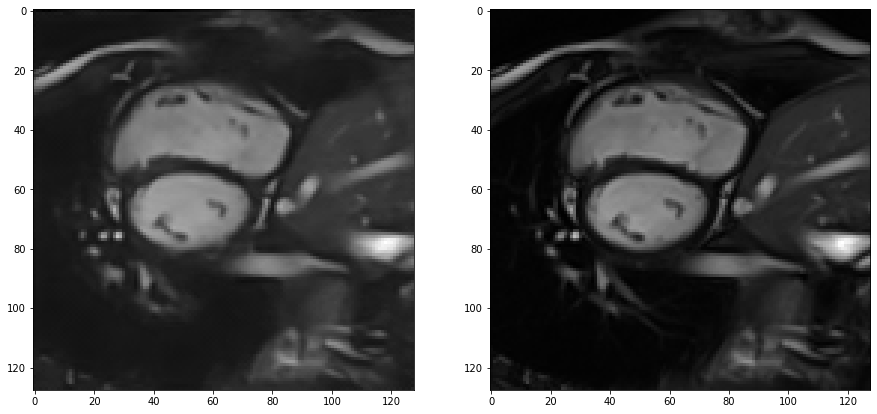

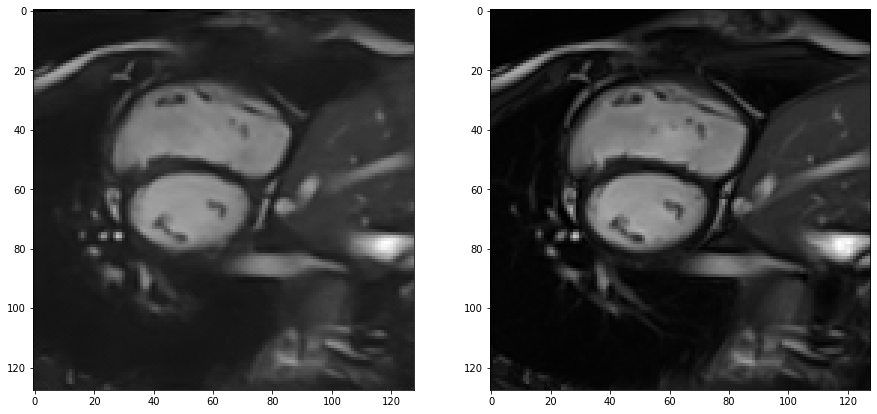

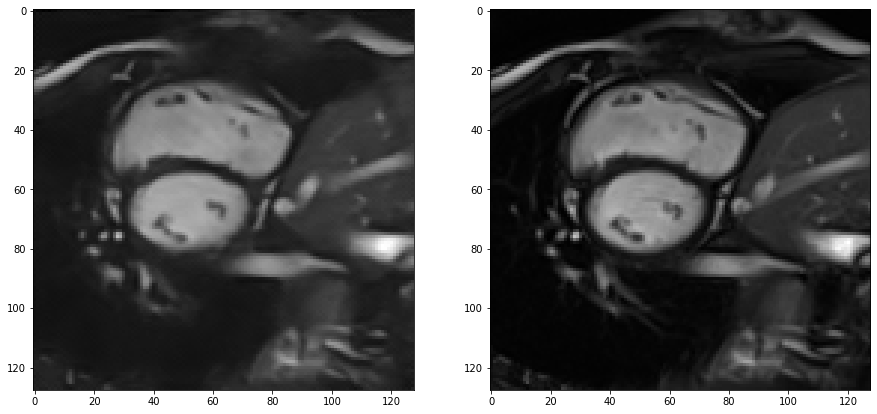

In [15]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

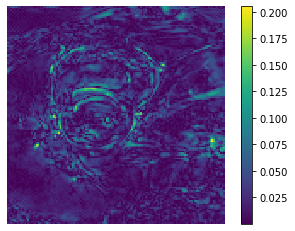

In [18]:
plt.imshow(np.abs(recon[0,:,:,0,0] - test_truth[0,:,:,0,0]), cmap='viridis')
plt.axis('off')
plt.colorbar()

# SSIM

In [44]:
results = []

In [45]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.86346793 0.8552853  0.8078592  0.8322718  0.81184244 0.8826119
 0.8870132  0.8489762  0.84977573 0.8818935  0.86021173 0.8304154
 0.8476687  0.83804536 0.8396119  0.8845654  0.8586041  0.8390994
 0.840149   0.8675209  0.85525316 0.8699333  0.8596826  0.8526328
 0.8605397  0.87165797 0.87192386 0.88776    0.8596684  0.8047477
 0.8583245  0.89787483 0.88884765 0.8252283  0.84783226 0.8406668
 0.8477087  0.85149264 0.89048105 0.8876487  0.87764186 0.8962514
 0.83173007 0.8382662  0.8581075  0.8676571  0.88031566 0.8689695
 0.8774497  0.8956758  0.9137808  0.90796465 0.8438556  0.81089926
 0.88343275 0.8910926  0.8760095  0.883822   0.87020224 0.86502147
 0.85927176 0.863879   0.87557673 0.89285403 0.8491748  0.8442244
 0.85695475 0.8527865  0.84637594 0.8691469  0.79709727 0.7951357
 0.81339115 0.8280337  0.8487376  0.86826414 0.8879349  0.8487623
 0.87601626 0.8799405  0.86455196 0.84255785 0.8497701  0.8516485
 0.86356485 0.89873827 0.89816386 0.9063886  0.82632124 0.82893

tf.Tensor(
[0.872902   0.8546351  0.8115656  0.8322445  0.8118399  0.88333666
 0.8960369  0.876736   0.8655312  0.89330554 0.8779694  0.863864
 0.87115437 0.86513925 0.8615496  0.89942795 0.874461   0.87009335
 0.8291171  0.8460061  0.81653345 0.8513923  0.8470233  0.8427928
 0.85155785 0.8702049  0.8723425  0.8961317  0.858273   0.8105238
 0.8720177  0.9120032  0.90456706 0.84564465 0.8549067  0.87519443
 0.8668212  0.8714986  0.9049746  0.91263664 0.9029953  0.9207864
 0.854842   0.8739401  0.8768046  0.8771436  0.86964965 0.8535054
 0.8685069  0.88740486 0.90837944 0.91901845 0.8743267  0.85070795
 0.90224904 0.90044326 0.8762142  0.88515466 0.8807574  0.87271315
 0.8717461  0.87869513 0.90007216 0.90930676 0.85750604 0.8615189
 0.8745914  0.87890106 0.8512676  0.88846415 0.8167885  0.8141427
 0.8345182  0.8603935  0.86478764 0.87871855 0.8929925  0.8468069
 0.88419265 0.89662784 0.8785515  0.8657019  0.8694524  0.88112247
 0.8910803  0.9200469  0.91694885 0.9204067  0.85927135 0.83

tf.Tensor(
[0.87065285 0.8537385  0.8128442  0.8412895  0.8043318  0.8801839
 0.8880537  0.8767823  0.8617987  0.8854553  0.8693789  0.86428565
 0.8748342  0.86734194 0.8664169  0.89640105 0.87435853 0.87859535
 0.8650387  0.87236    0.8516791  0.8384717  0.828368   0.8456225
 0.8487452  0.866378   0.86339146 0.89628786 0.87288934 0.81695616
 0.86471766 0.90738124 0.89858603 0.85122824 0.8605864  0.8808251
 0.8714182  0.8652409  0.9024115  0.91225415 0.90723413 0.9231139
 0.87375087 0.8657724  0.8646573  0.88202477 0.8758984  0.85989964
 0.8694799  0.88179636 0.90494466 0.9085984  0.86362255 0.84768677
 0.9037055  0.9029503  0.8883883  0.8865789  0.8726279  0.8850641
 0.88226086 0.88652855 0.9022001  0.9095414  0.8756134  0.86432105
 0.8798692  0.8680207  0.85964614 0.87717986 0.81387746 0.813677
 0.82874286 0.8526938  0.85475045 0.8591889  0.8894987  0.85382116
 0.88093114 0.89286345 0.8801293  0.8539351  0.85778666 0.87241834
 0.8831359  0.9113114  0.91183317 0.92104363 0.8675721  0.

tf.Tensor(
[0.8841195  0.8738425  0.8344186  0.8611491  0.80463207 0.89314467
 0.90266275 0.891089   0.88233626 0.8915507  0.8768726  0.87137526
 0.8719315  0.8592591  0.86019915 0.89817715 0.8752613  0.8792476
 0.88972265 0.905021   0.87992096 0.8937281  0.8792553  0.8671046
 0.8893937  0.8985862  0.8946123  0.8968144  0.8909308  0.8428484
 0.8649788  0.91498715 0.8962886  0.8482695  0.86250204 0.8842362
 0.8779638  0.86932445 0.90633696 0.9108608  0.9004121  0.9194657
 0.8832985  0.86209494 0.88349223 0.8925145  0.8954189  0.88131243
 0.8945282  0.90204865 0.9233268  0.9117319  0.8770917  0.8582277
 0.90989774 0.9155738  0.8972221  0.90250176 0.8874299  0.89348674
 0.8817912  0.88863415 0.9055625  0.91726166 0.8857436  0.8782944
 0.9017974  0.8889374  0.8814162  0.8932875  0.8148389  0.8136024
 0.83065534 0.86800295 0.88096166 0.8934502  0.9092028  0.88066846
 0.9031291  0.8951127  0.88449013 0.86145353 0.8634611  0.8831219
 0.89112014 0.9114769  0.9169063  0.92365795 0.8726609  0.84

tf.Tensor(
[0.89993405 0.8806498  0.83597124 0.86248124 0.82112616 0.89590746
 0.9084184  0.89396274 0.894016   0.9038282  0.8904893  0.8673122
 0.87696254 0.8685514  0.8629106  0.9003357  0.8755009  0.8767099
 0.8904019  0.90854734 0.8839272  0.90289795 0.88608027 0.8773285
 0.8971242  0.8997947  0.89514214 0.89581656 0.8925664  0.8532192
 0.8763034  0.91436154 0.90254825 0.85625136 0.87221676 0.88278306
 0.8753517  0.88239926 0.9116972  0.9095611  0.89968157 0.9191068
 0.87533593 0.878339   0.89824843 0.90656954 0.9107876  0.90704787
 0.91325533 0.9233811  0.9361433  0.9292191  0.8898631  0.8629922
 0.90742517 0.9160185  0.8963033  0.90819556 0.89349914 0.8986351
 0.89242494 0.89721    0.8954628  0.9083603  0.89996594 0.8847909
 0.9000954  0.8938766  0.8805452  0.89528376 0.827588   0.8221635
 0.83610386 0.88196987 0.88833135 0.9014164  0.9174562  0.87925744
 0.90667516 0.9023868  0.88638407 0.8732729  0.8783275  0.88902074
 0.89031374 0.91526204 0.91730213 0.9240378  0.8763767  0.86

In [46]:
r = []

In [47]:
for k in range(20):
    r.append(np.mean(results[k]))

In [48]:
np.mean(r)

0.88217145

[0.8853385, 0.8670508, 0.8248167, 0.8471826, 0.81118524, 0.88639516, 0.89757454, 0.8835613, 0.8723607, 0.89433354, 0.87753123, 0.8605525, 0.8680792, 0.86047953, 0.8580807, 0.89617634, 0.8715855, 0.8683114, 0.869153, 0.88424885, 0.8602959, 0.8752052, 0.8629346, 0.8566635, 0.8737979, 0.88309443, 0.87915266, 0.89428663, 0.87964994, 0.82947177, 0.86855763, 0.909853, 0.89900696, 0.84857416, 0.8620509, 0.8757411, 0.8693305, 0.8697995, 0.90489686, 0.9074086, 0.8984095, 0.9171624, 0.8661882, 0.8675803, 0.8794314, 0.88797796, 0.8893668, 0.8829959, 0.8907238, 0.90336, 0.92161024, 0.9177209, 0.87342834, 0.8510782, 0.90324944, 0.9065236, 0.88819426, 0.89452744, 0.88323534, 0.8850943, 0.8795835, 0.8862151, 0.89778453, 0.9090339, 0.8769742, 0.87196505, 0.886757, 0.8805566, 0.8658787, 0.8855545, 0.8160056, 0.81274337, 0.83093816, 0.86225355, 0.87075555, 0.88261116, 0.90303963, 0.8648597, 0.89367807, 0.89426804, 0.8794134, 0.86189526, 0.8651169, 0.8767799, 0.8842243, 0.9109391, 0.91093063, 0.9194252, 

Text(0, 0.5, 'SSIM')

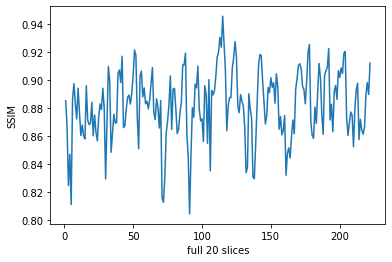

In [49]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')

# PSNR

In [50]:
results_psnr = []

In [51]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

30.070613734249353
31.144468626403672
31.72364918303198
30.77487881725215
30.053255178884292
31.018390598330704
31.334159502805292
31.21284873338339
30.94502564678285
31.339359842890172
31.505597482022498
31.380404280175988
31.5154309343405
31.4252591671751
31.715008416990294
31.8069027319967
32.02697398079522
32.47221144111051
32.219349811497416
31.153935110167215
30.599238867132996
30.86296659902232
31.383482658896398
31.620249866946374
30.313698281997674
30.360706201370814
31.51771385734337
31.59000512244806
31.013146620857523
30.821444616595297
31.255416903097686
31.701466018567523
31.494226104352062
31.425392196135444
31.260598955070638
31.518877104614987
31.801860857260603
32.010294403024645
31.485066794191503
31.195402427122993
27.424611722121316
27.550075387322583
27.74323326694217
27.878397544055563
27.74656743898891
27.977542598517577
28.15401062664829
28.204364220135236
27.986620579009703
27.7577012418539
28.213095741789257
28.5279303262324
28.390335858162356
28.488801961094

31.27389627354272
31.60335576848357
31.73858062269194
31.58897938984934
31.735154797862283
31.567215883471803
30.855844895763216
29.541383554668347
30.23205130636665
29.814600390739457
30.04089245935034
30.101380594459858
29.490845410617005
29.165596508946997
28.867973459979666
29.558244295036133
29.37220920129022
30.151845290553236
30.451306335597643
30.456611930783236
30.733693155670103
30.849053196272127
31.170556665222314
31.22618760798484
31.150631318920997
31.127502571558527
30.43509293921681
30.018412259927455
30.950258119370957
30.558234535625054
31.142690872130668
30.59445626907399
30.71992902787256
30.30579162633689
30.66488165578686
30.218709444392125
30.246441639631783
30.359266218039792
30.445093727280053
31.026170991766023
31.162390992754805
31.427669009617706
31.68657621182337
31.773810591951044
31.41623009039921
31.195572599277114
30.858281083540025
29.98646761067766
30.606822051637653
30.103214422572492
30.434488166593752
30.355545348987203
30.280122680683263
30.052417

31.97789344413208
32.2367782871041
32.096811364938674
32.25933718230135
31.219804375104605
30.473957724633696
31.39220246723802
31.7065433859544
31.258419566960885
30.79909773301363
30.94349228802554
31.431518876419563
31.599191743110822
31.375792544407552
31.320908945662275
31.039168980436273
31.36500771639283
31.90757758828307
32.194905756868685
32.20990595462196
32.37825249638769
32.56267301906196
32.53265381007629
31.67579553915974
30.98295217369506
29.20708855392878
30.37964270112368
30.6533276834543
30.456937664048233
29.51133019710972
30.17410242306243
30.290143154762493
30.306810317066557
29.85919654551548
30.41913850331747
30.138973873355997
29.88113193593091
30.245760946451895
31.04487593476625
31.374435412094883
31.37995892787177
31.661942379330775
31.766569086967635
31.259600485091564
30.69487687747938
29.867368107336
30.734828989603187
30.633917769033914
30.355211737307627
30.020565800800128
30.59817140271023
30.76631369106279
30.424839416916708
29.953303895955166
30.42120

31.760717643319374
32.03186279031879
32.16291645048241
31.19963663036099
26.676536793738062
27.38716709109728
27.375187454168227
27.568193515312295
27.644793026384022
27.916975110758035
27.977367830306644
27.991431722094873
28.107107134347284
28.144619928224778
28.320929798493403
28.17751930913577
27.94252920249349
27.86768126010058
27.928653285451087
28.085204196883563
28.133035366237653
27.97589047047516
27.99294370391896
27.677589349176223
26.13003482904306
26.03271254026987
25.864818079221337
26.34362276396861
26.638164568368083
26.953697490722625
27.39956940544316
27.572313824503453
27.30606121434349
27.01765883008264
27.023897610960937
26.958720690313882
26.914148865806702
26.94440652463774
27.013826346117547
27.114560388271784
27.14127888167392
27.02206075393663
26.85897536820647
26.2328088777949
28.937606796712995
29.27921075523535
29.01951897518993
29.50456460846378
29.661179678485734
29.95932231181238
29.89935057279296
29.425082686718667
29.68213595742641
30.005352619134648
2

30.71015235421967
30.55148665843592
30.198954657031244
29.544857263012233
30.527361959365198
31.282588712355164
31.366325228815846
31.450270003349743
31.287760565503994
31.18229100245161
31.090997392656146
31.141656950541382
31.285468111349534
31.41325921425951
31.391629626220343
31.736435187670917
32.081317387943315
32.08496340047861
32.16349915003062
32.16996645117239
32.198620279584304
32.156509860768615
31.61623366027216
30.833287129695755
30.080487974808378
31.236852614047418
31.121322208263365
30.952525258096845
30.952474449013515
30.98045158940105
30.918306684974652
30.68764994676821
30.77736205737807
30.89258231780328
30.89966606249166
31.04480726087583
31.03950185178475
31.011010132260303
30.895694133510748
30.842837016728588
31.072013541478825
31.386805507365136
31.098855992909186
30.482620796860232
30.09253874091025
31.10145970726855
30.919770773601822
30.589947286900223
30.47185782167819
30.58513668694429
30.61849359926542
30.70888516256902
30.833239846239064
30.85866406484

28.67628570001539
28.695996726597407
28.92359637369241
29.0139678512774
29.12194501371363
30.17881267842169
30.576201802353946
30.780192856161555
30.921339335162948
31.09960103124176
30.842009807187132
30.404073626460235
29.97828455357562
29.967418092350535
30.70814434068574
30.60036654567121
30.62514016940429
30.214833712336173
29.976055840635155
30.18942342836043
30.122395687425442
29.901352502295218
29.614073605697378
29.903104921074895
29.66652943704195
30.47182446705356
30.676369695027272
30.787172837235186
31.231676017659513
31.37738601038055
31.404884953836415
31.456014523572122
30.624813981050373
29.38343939215259
30.32251311006209
30.366132289768903
29.983157846390093
29.681578755274344
29.201816395103517
29.27005599581068
29.114953969689672
29.083395502847896
29.189603457247152
29.02279220409845
29.523513396318357
30.467938120763716
30.97106404824331
31.213004681221115
31.24480302686592
31.18554697080192
31.01420713585551
30.876833438500654
30.52311645057475
31.74170290607312

30.28557573983928
29.193643194722995
30.292271400679006
30.716370706394734
30.820160610534547
30.335100504655657
29.896349585172665
30.127717629392595
29.868778354392784
30.08077526280806
30.324218384835984
30.034434904430167
30.569997898803564
30.777420626589425
31.29658276884774
31.338068402178884
31.367931912239197
31.29031823263196
31.34744235927326
30.693083497233943
29.19618770852861
29.041446711953007
29.66808567971645
30.084880070666987
30.159950369559706
29.9941706064864
29.769427504319488
29.472716811836964
29.58295272102944
29.86961403951632
29.95848940237576
30.06642002324923
30.22676156098266
30.205221124429862
30.268905563957077
30.316421015246583
30.22650975936536
30.189484644894847
30.032510588846826
29.564857811686245
29.28182601970878
27.97781084816433
28.278286195337458
28.45212244145689
28.518438786974755
28.446226041808682
28.47351916672995
28.531028676222437
28.66290002146762
28.69001464913163
28.691235726248724
28.70061934297922
28.816500613590303
28.811305667466

30.789994441082065
30.77883044361495
30.89609663272647
31.098744149758282
31.33006590235659
31.25009488087738
30.903616287462206
30.552304206718155
30.157354033742525
28.46203525573182
29.43751850469067
29.755102658788385
30.816840592107482
31.36533021438849
31.30243772727937
30.18367560586419
30.316682329776903
30.369537942803206
30.517780916507032
30.407023003239807
29.85710033922998
30.3057261083087
30.954997206379442
31.56656379758179
31.012458560277626
31.057214006485978
30.92778938859106
30.161064444734656
29.070169813589082
32.8843041795057
32.788754230782786
33.08660739604473
33.11464236090663
33.03584500703643
33.072674846789674
32.78816269925844
32.72050027476193
32.9684240543675
33.18343631503156
33.39425106137702
33.50462630948375
33.82672258796824
33.75956950972582
33.253467332819106
33.00876742016578
33.29552465949335
33.10050072877392
33.259561142685676
32.627608680260934
31.745900775919953
31.439791212903895
31.50690870317492
31.60607260777418
30.88789113118139
30.79025

32.94808682098193
32.92949662106292
32.84381857800743
32.7611477131463
32.77470828838122
32.84030680340403
32.655037492984086
32.43467677680571
32.0938090742472
28.575027623638448
29.467238377703563
29.911231937656318
29.796814473959476
29.782762863470804
29.447338209628946
29.472718184204354
29.4227381899516
29.696839157470137
30.075368146606106
30.39023707773402
30.746910442845262
30.382878702031828
30.601779407399885
30.84222161637292
30.691244111290544
30.655348397464483
30.26287791892986
29.751850762740393
29.605027942381177
29.058592926918706
29.56831821440335
29.979482230533762
29.932444422280486
29.536311623551992
29.636573826594127
30.047452599423625
30.022298262511757
30.01209026843652
30.014546411455598
30.10585978691969
30.149361314626173
30.00363180066428
30.225360055307206
30.49419860028909
30.39568972873951
30.62249269048568
30.66142975681858
30.445574016400805
29.97951012243741
28.505253881697378
28.610312056349798
28.3820648218283
28.071139502933683
28.155182013547268


30.05498630765292
30.061783832271153
30.054018799598083
29.953942859177133
29.735093704224486
29.879838603456193
29.846118116871864
29.460251993799442
28.69517647325378
27.60067670114866
28.970975911368427
29.33817752242383
29.625074964111736
28.948361924736517
28.589933510313813
28.850218492000348
28.911042275184457
28.79351523374675
28.33749552165137
28.669187113504535
29.099050332823694
29.397281390022183
29.51291312064489
29.775604512432018
30.07452655377286
30.044329063628112
29.980343553626312
29.964511818713273
28.970255475384302
28.227159520717812
29.426256163797746
29.850541780801958
29.65712135987451
28.852756587879597
29.10767550644009
29.114008113609184
28.944469101342776
28.776744112161396
29.258606708973428
29.322371955445313
29.223587218361825
29.44313792877244
30.14035932344155
30.44222292173388
30.56589059097754
30.63844821343576
30.625329009759227
30.49032545936862
29.368825623703614
28.3390503693282
28.871244844493024
28.738605456394005
29.21023962771027
28.939296263

In [52]:
np.mean(results_psnr)

30.078710473936553

In [53]:
r

[0.8656658,
 0.87959975,
 0.882745,
 0.88239324,
 0.8784928,
 0.87701184,
 0.87601453,
 0.87523246,
 0.8760438,
 0.8779558,
 0.8809913,
 0.88501996,
 0.887671,
 0.89006966,
 0.89187497,
 0.8925065,
 0.8933033,
 0.8910492,
 0.8857136,
 0.87407523]

[31.341886161014266, 31.26156272280245, 27.96549179676456, 28.29656678550635, 26.421939618899906, 31.881810384869944, 31.58659469377651, 31.04207172179394, 29.732657583092653, 32.16913403825181, 27.028463418843877, 28.201451733542598, 26.835166222412617, 25.85715192505622, 24.30547418588544, 29.5430029736832, 28.556144946965425, 31.423274930726013, 30.66424428717541, 31.19568768439687, 30.885846946379154, 31.171809348569646, 30.65639702106244, 30.19688290966173, 30.83854334832987, 30.786024046469684, 29.246109928669064, 30.711303057510293, 28.181948614841495, 27.58202938205244, 29.27961162350926, 31.429476035855707, 29.73449856004806, 28.454709561474544, 28.9075348428818, 28.347948620250868, 29.52095312541279, 29.043192077433368, 29.751419240736432, 30.269028580875318, 30.224222943253874, 30.653793752980135, 28.649518950709343, 28.829568378759696, 29.435946259954665, 31.36580130886589, 31.557500915520496, 30.53529218013651, 30.747397107665854, 31.410930738929704, 32.330065920355246, 31

Text(0, 0.5, 'PSNR')

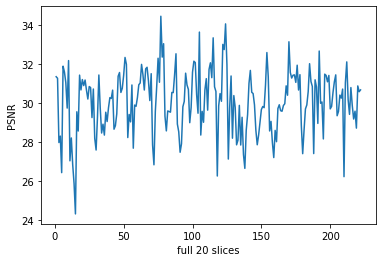

In [54]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')



# MSE

0.0009838720575640722
0.0007683394587906425
0.0006724114214885104
0.0008365889390715255
0.0009878124194634828
0.0007909716907418313
0.0007355023246669436
0.0007563366169736348
0.0008044469979648582
0.0007346221446724061
0.0007070339235718212
0.000727712059431716
0.0007054348428891931
0.0007202347696237713
0.0006737505896843234
0.0006596441674887258
0.0006270506204697251
0.0005659510316149785
0.0005998808785605055
0.0007666665037022223
0.000871116246076755
0.0008197913661134072
0.0007271964232318239
0.0006886126765692879
0.0009303153179110367
0.0009202999106523399
0.0007050641197292959
0.0006934249881301519
0.0007919273425184591
0.0008276668067516012
0.0007489594583327225
0.0006758547931407016
0.0007088876161758433
0.0007202127084143376
0.0007480663242022207
0.0007048752952983837
0.000660410415896668
0.0006294635108338288
0.0007103842442583016
0.0007593810534358505
0.001809417672716856
0.0017578930991790052
0.0016814217979308193
0.001629897319775528
0.0016801314296759067
0.0015931099135

0.0011243860763082332
0.0012118262314827156
0.0012977847125089552
0.0011070712447974014
0.0011555242920204315
0.0009656404971011439
0.0009012999903990668
0.0009001995819587702
0.0008445603420408927
0.0008224219262918792
0.0007637378837459649
0.0007540171764952363
0.0007672499487740451
0.0007713469077919975
0.0009046710775287277
0.0009957693948065983
0.0008034783666873368
0.0008793799237232371
0.0007686540375881486
0.0008720760772197621
0.000847241259590132
0.0009320105691822236
0.0008580484960214226
0.0009508873186932233
0.0009448347026954221
0.0009206051036286184
0.0009025902280063549
0.0007895559320844629
0.0007651752264398405
0.0007198352317680948
0.0006781759412385534
0.000664689687427308
0.0007217337110072049
0.0007593512987455846
0.0008206762997496059
0.0010031208074040656
0.0008695965234809761
0.0009765141882434737
0.0009047970654054987
0.0009213941808560391
0.0009375355227940643
0.000988002896592355
0.0009244184399476961
0.0008252599359677597
0.0007580442393491091
0.00073829597

0.0009607043511802778
0.0009353748412505788
0.0009317919803617854
0.0010329524866011246
0.0009080006296228362
0.0009685066625519133
0.0010277483930524701
0.0009449828033435495
0.0007861626491953207
0.0007287129018851624
0.0007277866873336472
0.000682033586825748
0.0006657989275978922
0.0007482383290666058
0.0008521426692883309
0.0010310107398340078
0.0008443394884719346
0.0008641879833550222
0.0009214649622450808
0.0009952757439341568
0.0008713303864650107
0.0008382404821242557
0.0009068094938085235
0.001010810187677666
0.0009075680498031264
0.0009391713263448614
0.0009283247595982653
0.0008160985657349092
0.0007697487581341069
0.0007391728636531486
0.0007319926617233941
0.0006681759366241242
0.000663596389373181
0.0006848573789517523
0.0008483881040655697
0.000889019677091396
0.0006989389834934367
0.0007197664012540441
0.0007310099014504505
0.0008499757796684528
0.0008040132473473155
0.0007546121102329764
0.0008014391088531992
0.0008220090674325961
0.0007721638225415125
0.000801584037

0.0021686204216755825
0.0020166487008413444
0.0018198812873657295
0.0017489146574936822
0.0018594901345346953
0.001987165858707662
0.0019843132799988988
0.0020143175239004797
0.002035096996892371
0.002020967583905858
0.001988920231124213
0.0019433183929968756
0.0019313994875181603
0.001985152726700655
0.002061116135430626
0.0023807791594923893
0.0012771423911755516
0.00118053515519383
0.0012532799806146766
0.0011208397876140074
0.0010811402401942833
0.0010094103856890773
0.0010234460230070415
0.0011415415702360318
0.001075935914125427
0.0009987682730962725
0.00100425945837477
0.0010407902438436716
0.0011233536817831294
0.0010794700077845917
0.0010287288774572534
0.0010890662097286067
0.0011448331654734455
0.0011837601517460843
0.0011008961303320833
0.0012457916406932888
0.0013572319566549224
0.0010118825571603907
0.000894489656852578
0.0008617323513915782
0.0008603027661257902
0.0008287761635690229
0.0009243846229354793
0.0009531001822279373
0.0008982132870170186
0.000795794175738971
0

0.0007923170228038994
0.0008136368066950061
0.0008235999248664516
0.0007812654985301633
0.0007266402477654468
0.0007764516205343318
0.000894824611028816
0.0009789175755048865
0.0007759862560364377
0.0008091386054620534
0.0008729819642644191
0.0008970449751847843
0.0008739494860553765
0.0008672626436901953
0.0008493984883287163
0.0008254219532739756
0.0008206039318432814
0.0008870836988349569
0.0008751754392739952
0.0008526859648789725
0.0008451079719166857
0.0008326648273200525
0.0008593101681562585
0.0008398054303425832
0.0007714137647497961
0.0008226696779825198
0.000933110595833639
0.001717835748915467
0.0014525823506766865
0.0012872144329366085
0.0012779106357079563
0.0013409813812291249
0.0013347351375867587
0.0013763105116447864
0.0013817395609805687
0.0012909534355304698
0.001362239706202347
0.0014650679066693462
0.0013164965017486586
0.0011818732620127543
0.0011004156795861423
0.0010142830836964232
0.0009869815627261296
0.001044960336618191
0.0011516449634446327
0.0011944806070

0.0010798092819142052
0.0008970518646836313
0.0008557817693325234
0.000834224069650423
0.0007530648868598774
0.0007282179822185825
0.0007236215710209213
0.0007151523130600333
0.0008660014155245885
0.0011525401429275791
0.000928428981971133
0.0009191508031579326
0.0010038855785462779
0.0010760739661367774
0.0012017617041631345
0.0011830263022631314
0.0012260398972473272
0.0012349814937271785
0.0012051459740252692
0.0012523357533900962
0.0011159600826279236
0.0008978549636542717
0.0007996383146899839
0.0007563094586865104
0.0007507921053286399
0.0007611062756816443
0.0007917339833290809
0.000817177981321225
0.0008865196267674695
0.0006696219933812418
0.0005112501186036515
0.0004680289811518678
0.00047426227700893823
0.0005070239922165345
0.0005420131674982074
0.0005395822105263787
0.0005907901641627913
0.0005946304423755132
0.000595385533261269
0.0005920800160783509
0.0005082103670917432
0.00046912768017402334
0.00045919972831130713
0.00043764233248296685
0.00042717427206464924
0.0004058

0.0012033202607689285
0.0012469680578704376
0.0010794224144067867
0.0009806453942249192
0.0009638400381622924
0.0010013431687047204
0.001054525896944262
0.0011290893703421357
0.0011007906394598624
0.0010304776956317086
0.0010096039935052034
0.000984822580315483
0.0009491259419600157
0.0009538451758324986
0.0009399601536984348
0.0009297322557932075
0.0009491809733697151
0.0009573076633715046
0.0009925421093895269
0.0011053866592260874
0.0011798244663946923
0.001593011515353069
0.001486522135109766
0.0014281958140594292
0.0014065530645880145
0.001430136186999778
0.0014211767152188816
0.0014024814714170299
0.0013605358749532396
0.0013520680025432968
0.0013516879039485123
0.0013487705220723784
0.001313257647890607
0.0013148294810574413
0.0013144161008954737
0.0013383312246934788
0.0013312902508738679
0.0013223986148881808
0.0013347333624606048
0.0013528544625038333
0.0014692430560939197
0.0018215170198325446
0.0017331703577088786
0.0016428135734714857
0.0016225919426027893
0.00164242678154

0.0007408942550991382
0.0009585889963471034
0.0009296763155847088
0.0009184303054750856
0.0008876094316389893
0.000910537212747851
0.0010334511814330555
0.0009320246296775547
0.0008026020771501839
0.0006971779134600866
0.0007920528189349892
0.0007839323731073233
0.0008076460272291614
0.0009635928205280657
0.0012387481492624353
0.0005147182678426683
0.0005261681755410626
0.0004912915113927976
0.0004881302968513031
0.0004970676498330332
0.0004928701486556349
0.0005262398472461994
0.0005345027851273334
0.0005048444597078783
0.0004804590392281404
0.0004576936571192398
0.0004462080170859692
0.00041431221842196824
0.0004207683345782969
0.00047277365385054137
0.0005001764709166368
0.00046821738387281965
0.0004897223525653009
0.0004721107459420311
0.0005460584499703495
0.0006689750526563127
0.0007178288000653679
0.000706820488233086
0.0006908642806988069
0.0008150999882590843
0.0008336313094129848
0.0007943003424864948
0.0007057542028831689
0.0006916757470218108
0.0006985830249476993
0.0007094

0.001129089013550776
0.0011421579867830372
0.0010722994525211996
0.0009827955589814846
0.0009140633421531061
0.0008419939204368143
0.0009156133785989986
0.0008706068086313752
0.0008237166382072099
0.0008528557638079166
0.0008599340789365191
0.0009412656457075557
0.0010588024162736906
0.0010952095087978083
0.0012420546563817563
0.001104506252111909
0.0010047355685420685
0.0010156768592223687
0.0011126762999191706
0.001087283049024294
0.0009891331111026832
0.000994878793634935
0.000997219984233347
0.0009966561680825612
0.0009759195573333031
0.0009661929595281958
0.000999164096555068
0.0009494322824978929
0.000892442285968809
0.0009129164381234175
0.0008664644143256698
0.0008587307690537573
0.0009024904154793269
0.001004729115801164
0.001410829759167104
0.001377110514949586
0.0014514213856758468
0.0015591433607340317
0.0015292616534628009
0.001586822232970204
0.001545803890187322
0.0015970104454973402
0.001587952101096389
0.001715770945299713
0.0017663068032752205
0.0016644351327624253
0.

0.0008605712934083535
0.000955095915080533
0.001122907658857447
0.001142562019237751
0.001094318155186333
0.0009006763754103322
0.0008806496962566017
0.0008174199042453524
0.0007785597669572157
0.0007807053898330551
0.0007853982886669792
0.0008196200068037898
0.0008252479313775767
0.0008059864037288366
0.0008082771754392563
0.0007775248974819257
0.0007920553078663402
0.0007623100362204409
0.0007388913393539911
0.0007592237910815155
0.0007823923292630826
0.0008320344610597564
0.0009241566056871213
0.0011375924866709585
0.0012394132333107908
0.0010523578292341378
0.0010788356952814672
0.0010444042972164915
0.0009542492376968298
0.0008941980545918465
0.0009030842499449605
0.0009576615503455234
0.0010163013374300083
0.0010094626644174495
0.00100391172445156
0.000987418748855475
0.0009858744618567508
0.0009876387475094104
0.0010106614814308346
0.001062895649784428
0.001028054502931611
0.001036067828290765
0.0011323346590640074
0.0013504619514366906
0.0017375300723264904
0.001267367041405377

Text(0, 0.5, 'MSE')

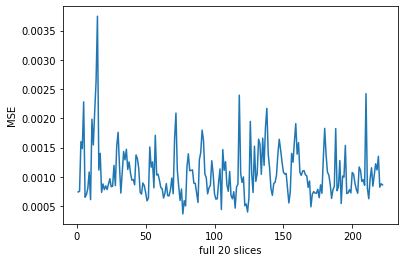

In [55]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)
        
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')





# crnn20

In [23]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/Results_crnnDCNormalised_20und-Results_DCRNN_20und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,1,2,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')


recon_crnn20 = recon



(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


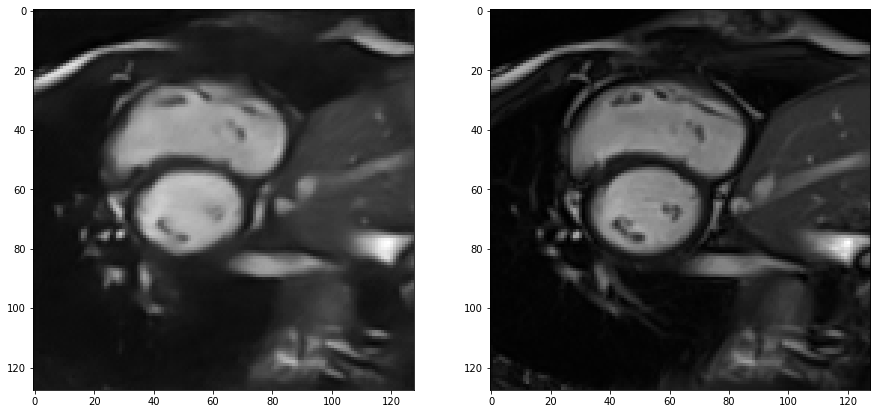

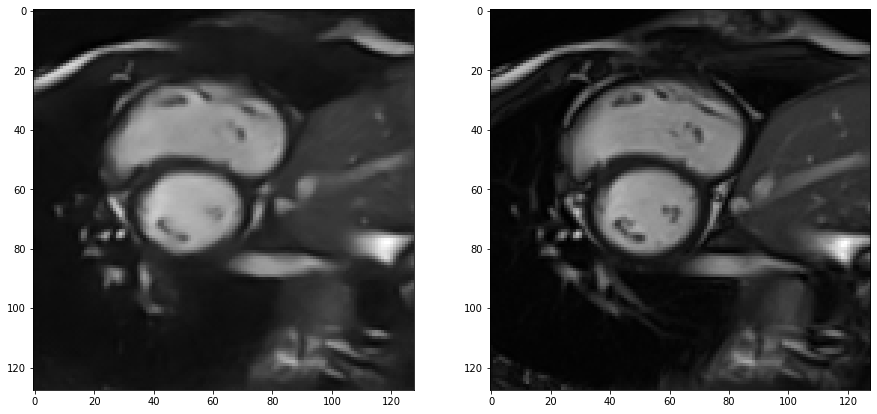

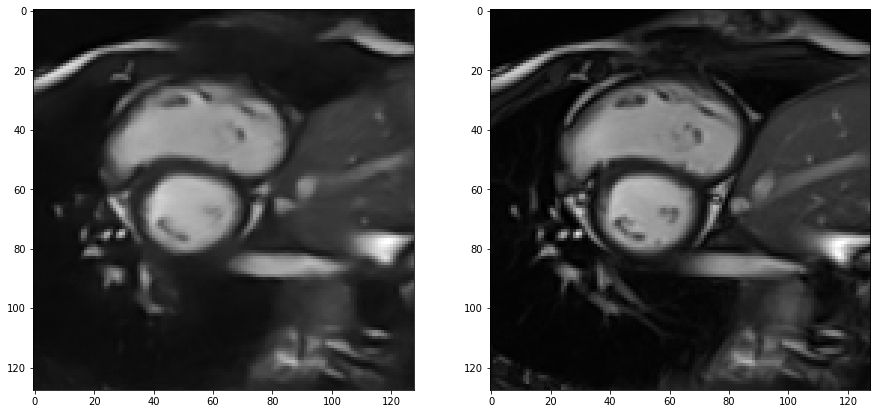

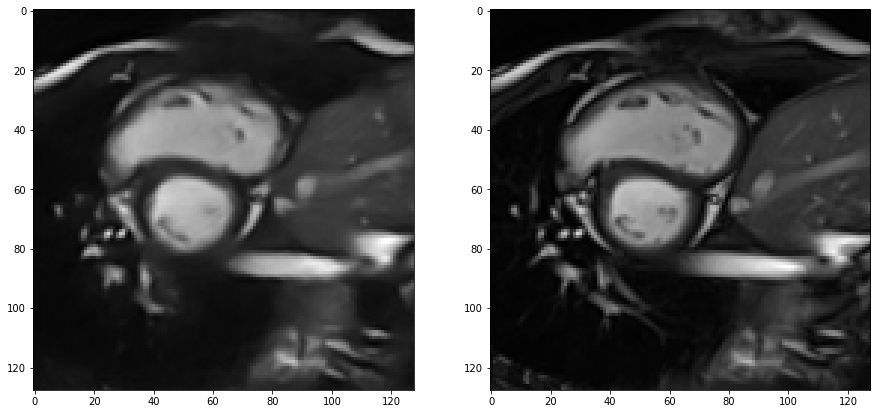

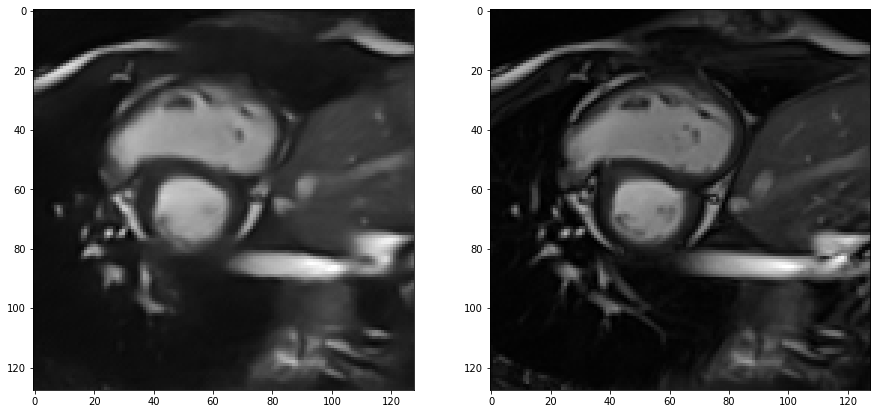

...

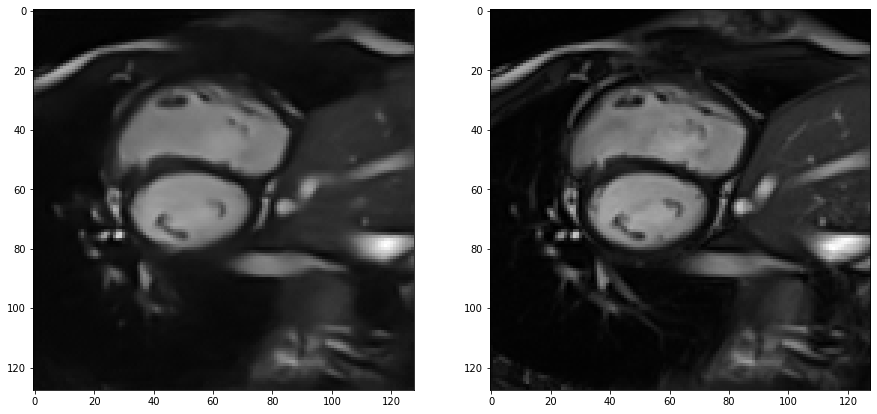

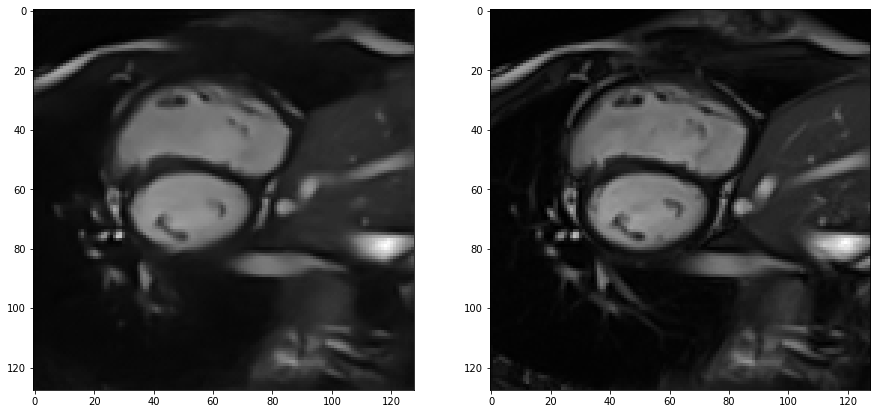

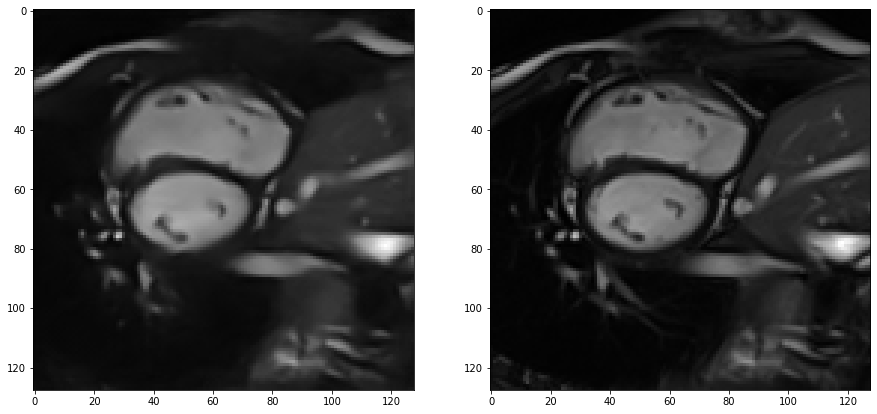

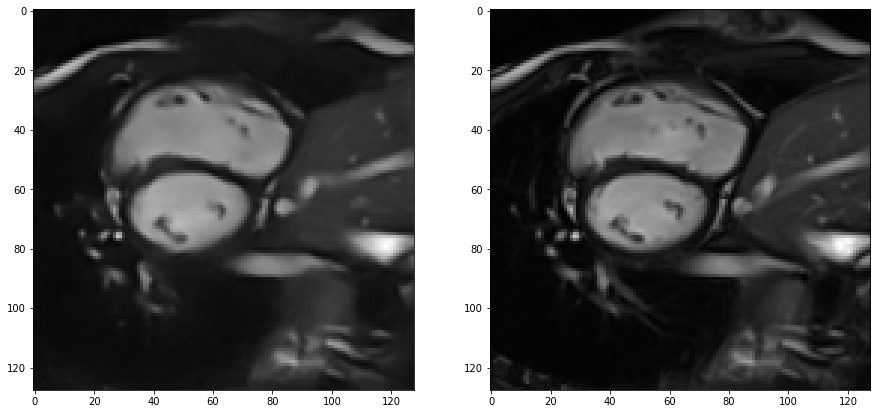

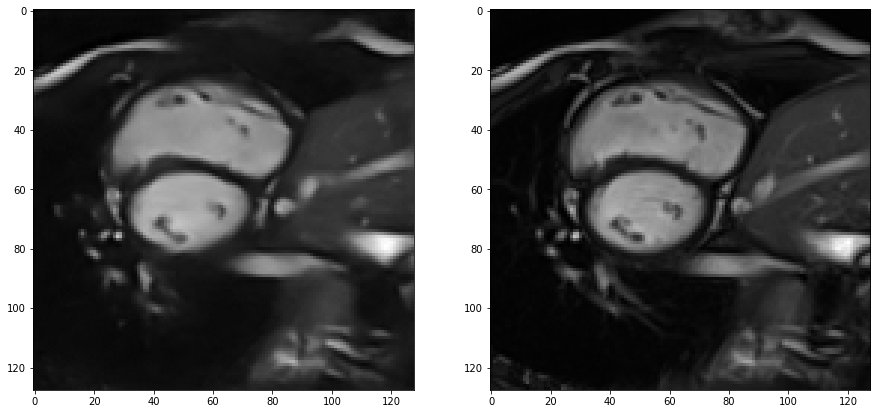

In [58]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

# SSIM

In [60]:
results = []

In [61]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.823515   0.8413855  0.8529077  0.8125144  0.8685575  0.8673352
 0.8558494  0.79273045 0.81268847 0.8188179  0.8262333  0.773164
 0.80988735 0.79887724 0.7934806  0.85482657 0.8349526  0.8099041
 0.77176774 0.7854366  0.8048351  0.83359104 0.8100652  0.80860245
 0.814223   0.8351873  0.8332511  0.8558081  0.80824655 0.72975856
 0.81366944 0.86765236 0.862938   0.7958151  0.794815   0.8206702
 0.80188733 0.8116982  0.8478029  0.8358027  0.8412317  0.8604774
 0.79302585 0.8082233  0.8408371  0.8198465  0.85795796 0.8333827
 0.84433514 0.8611748  0.8839971  0.86851096 0.811649   0.78119236
 0.8762939  0.87447345 0.8509652  0.85237706 0.8358515  0.82352734
 0.7817813  0.80673546 0.86229473 0.88769865 0.8106304  0.8234104
 0.83286935 0.82971436 0.83811176 0.8770701  0.87186414 0.8569647
 0.81105465 0.7853518  0.83408034 0.8373923  0.8739667  0.8740535
 0.8651751  0.8220263  0.8193242  0.79308975 0.79652214 0.8106948
 0.8199952  0.862211   0.8517136  0.87594247 0.7904326  0.7816

tf.Tensor(
[0.82439053 0.8249195  0.83387375 0.8112565  0.8741986  0.8710667
 0.8556572  0.82490146 0.83047104 0.85828656 0.8515958  0.810587
 0.8396287  0.83004266 0.817506   0.8646504  0.85186064 0.84195954
 0.7451224  0.7616158  0.7598783  0.8080801  0.7901359  0.80084115
 0.798619   0.8269592  0.83689016 0.87040275 0.81031793 0.7388001
 0.82652074 0.877999   0.87656885 0.812409   0.8039912  0.83949137
 0.8178596  0.81563675 0.8497757  0.8609184  0.8594886  0.8773391
 0.82233995 0.83944625 0.8587709  0.8156684  0.83649284 0.82915443
 0.8283061  0.8656967  0.88274854 0.8849406  0.84559023 0.8234718
 0.88467616 0.87383336 0.8491248  0.8433098  0.8513689  0.81613904
 0.78956354 0.8143004  0.8725078  0.8943459  0.81050867 0.82187986
 0.83108866 0.8328542  0.8380761  0.87950736 0.88361454 0.8627907
 0.81489146 0.80434984 0.8425758  0.83154774 0.8876839  0.8760504
 0.8713511  0.8811003  0.8655562  0.81459594 0.8204356  0.8364445
 0.8463168  0.8851191  0.8779809  0.891196   0.82679987 0.78

tf.Tensor(
[0.8282649  0.82700807 0.83556706 0.81230855 0.86117077 0.86414254
 0.8482517  0.8332192  0.8338285  0.8518778  0.83706164 0.8093354
 0.84277093 0.8251772  0.8191597  0.86452925 0.84927046 0.86079866
 0.7823333  0.79371905 0.80771005 0.8094649  0.77635235 0.80079556
 0.79475546 0.82584184 0.83165914 0.8745498  0.8194329  0.72744685
 0.81005806 0.8652157  0.86959034 0.8122164  0.7932264  0.8430266
 0.8156257  0.8135631  0.84686935 0.8647095  0.866089   0.87622535
 0.8302795  0.83382714 0.84451336 0.82803077 0.84009415 0.8120482
 0.82754064 0.8343174  0.8703078  0.8702893  0.842024   0.82123125
 0.8796991  0.8698242  0.86007833 0.84520376 0.85559744 0.83313197
 0.7979336  0.82174385 0.8707481  0.89457643 0.8209827  0.8304668
 0.8407074  0.8405158  0.84608555 0.87384444 0.88482636 0.85888517
 0.80830914 0.8031926  0.8378502  0.81966656 0.869482   0.85768425
 0.8581169  0.85474557 0.8659189  0.7953713  0.8063952  0.8219059
 0.8349912  0.87515455 0.8742626  0.894266   0.8311945  

tf.Tensor(
[0.8279651  0.8361081  0.8490186  0.81357896 0.8686153  0.88327134
 0.86252016 0.82799345 0.8472743  0.85533017 0.8478623  0.8097867
 0.8352926  0.8175184  0.8170392  0.870432   0.8497303  0.87029177
 0.8129141  0.81842697 0.8268026  0.85441446 0.8237941  0.81461585
 0.8352984  0.85440034 0.86268216 0.86924106 0.8403436  0.7650273
 0.8190159  0.87744546 0.87054753 0.80340654 0.8004066  0.8549216
 0.8255734  0.8219908  0.84625405 0.86342055 0.85752505 0.87794805
 0.84290576 0.8427101  0.87038034 0.8321432  0.8577498  0.84893143
 0.85404414 0.8716187  0.8957868  0.8724527  0.85792    0.83474886
 0.89050394 0.8887991  0.8610396  0.86263305 0.8600216  0.8346569
 0.8021441  0.8238993  0.8811159  0.89773643 0.83104473 0.8349211
 0.8649101  0.8578656  0.85805184 0.8922308  0.88661397 0.86621624
 0.815496   0.8191766  0.8520773  0.8463116  0.8935798  0.8839482
 0.888557   0.8681114  0.8723288  0.8057081  0.81064045 0.8354401
 0.84909326 0.88129056 0.87698144 0.8954569  0.8349503  0.

tf.Tensor(
[0.85189396 0.85338354 0.8630411  0.8252695  0.870029   0.8801493
 0.8676111  0.8368387  0.8555515  0.86252373 0.85767365 0.81237847
 0.84071034 0.8277405  0.8240134  0.8667786  0.85363597 0.86074764
 0.8148943  0.8278047  0.8371855  0.867281   0.8375233  0.8323742
 0.84469754 0.85929507 0.86140317 0.87150675 0.8421244  0.7723747
 0.8313261  0.88310397 0.8746419  0.8254324  0.8151031  0.84922683
 0.8252014  0.840055   0.85798395 0.8591645  0.8581131  0.8778321
 0.83784187 0.8572688  0.8872634  0.8421229  0.87806225 0.874925
 0.87654996 0.88462883 0.9007114  0.89587617 0.86114615 0.8407025
 0.8892463  0.89008987 0.8679935  0.86685216 0.8632472  0.83996457
 0.813956   0.82680887 0.86752754 0.8935461  0.84354013 0.8381144
 0.86195695 0.85688746 0.8601515  0.88929933 0.88819975 0.86985207
 0.8209189  0.83308625 0.86180085 0.85604906 0.90137774 0.88888353
 0.89047784 0.8757905  0.8672219  0.82433677 0.8217622  0.8360999
 0.8485554  0.88452184 0.8768384  0.89129424 0.841752   0.81

In [62]:
r = []

In [63]:
for k in range(20):
    r.append(np.mean(results[k]))

In [64]:
np.mean(r)

0.84865314

[0.83727443, 0.83798087, 0.8504502, 0.8152251, 0.86955345, 0.8742444, 0.8586801, 0.8293452, 0.8374833, 0.85447454, 0.84599507, 0.80377305, 0.8332262, 0.8213356, 0.81444705, 0.86444294, 0.84770536, 0.84972095, 0.7915099, 0.8007115, 0.8108527, 0.83814394, 0.8095158, 0.81141007, 0.8203813, 0.84129655, 0.8466126, 0.8677211, 0.8304082, 0.74642134, 0.8202001, 0.8746637, 0.8712325, 0.81109333, 0.80294085, 0.8426665, 0.81739676, 0.8220397, 0.8508069, 0.8572818, 0.85770607, 0.87493134, 0.8254067, 0.84117556, 0.86074466, 0.83035374, 0.85602635, 0.8461257, 0.8506482, 0.8672145, 0.8900045, 0.8811533, 0.8468243, 0.8250793, 0.88450754, 0.879557, 0.85843885, 0.854849, 0.8544933, 0.83020794, 0.80015725, 0.8201067, 0.8705913, 0.8936693, 0.82642573, 0.832826, 0.8495959, 0.84523, 0.8489687, 0.8823425, 0.88369083, 0.86326045, 0.81352246, 0.81106186, 0.84833115, 0.83967036, 0.88698256, 0.87717646, 0.87714636, 0.87047464, 0.86218995, 0.80943286, 0.8130058, 0.8281542, 0.8398967, 0.8778964, 0.871425, 0.889434

Text(0, 0.5, 'SSIM')

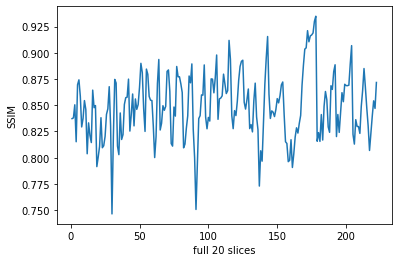

In [65]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')

# PSNR

In [66]:
results_psnr = []

In [67]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

28.071548978006028
28.648683431208237
28.902015497568826
28.763898855333686
27.84604703194534
28.56483522432352
28.758234067263608
28.976816697286925
28.840627926228745
28.986104186074826
28.67666108018597
28.43993572037232
28.619895413365537
28.5911141994759
29.008142035321683
29.08143727702154
29.2079953805802
29.599667957511887
29.393901679892423
28.322967349743777
29.52688655639495
30.026804945633398
30.548221699290345
30.283404663455407
29.52876992951937
29.34381915963722
29.922307040317534
30.357535537584543
30.183912464293826
29.847644726774575
30.190803267325283
30.284439764455115
30.169760552946784
30.004863374753135
30.150674500343477
30.300024236635817
30.523166397158196
30.457555458840183
30.272879772392265
29.90365286869705
30.882198504496742
31.149723095645587
31.64818459108597
31.25876708132911
30.482612685638376
30.968314508543806
31.177240494265142
31.23093405019365
30.614626476224252
31.010973192849995
31.279004387995343
31.16874539336735
31.094297143349966
31.4062229

27.289806119901826
27.12804881204212
27.03318557968801
26.988869788317544
26.792299947894552
26.923102838957007
27.082716728285746
27.204522969211308
27.194412726220555
27.367751604934256
27.597049924449323
27.580480538771827
27.015317116686997
26.86909696694492
26.74759144720435
27.784871073373516
28.647008266795343
28.794729685621938
29.335438641097227
29.42538243925537
29.085459129350856
28.791080592032348
28.74119446536597
28.839289260288346
28.932483984119045
28.949235322949228
29.12488125670542
29.36459484367202
29.354471552568143
29.584008655412116
29.318351137036984
29.185773170033954
28.99843282452553
28.873574473578646
28.398514955258094
28.839999741946066
29.020915477931677
29.108549035700197
28.979322509123563
28.94591810742994
29.3012619633355
29.589471549621926
29.46233019971425
29.19158715203974
28.909238094160674
28.347388312459753
28.60630476596417
29.18689096227002
29.404627416697622
29.405895522630196
29.25989545239411
28.884924037092567
29.037656662606036
28.8998703

29.235564006533746
29.33440108596684
29.339853015528835
29.271578290892034
29.113507472814476
29.00255227400872
28.91349408350578
28.89758254063355
29.00584798346706
28.88825675222147
28.950016876305817
28.833553027819452
28.7386383314672
28.66618733962726
28.261599244848576
28.110191026810405
26.848842721056197
27.434543963855575
27.50760039517614
27.68438641714085
27.313196592687447
27.395478274830694
27.73574087154664
27.645879033332616
27.845634972970533
27.95621125875445
28.507580800763364
28.67875462713666
28.192294988905097
28.344611856250246
28.48802232140826
28.41807648291035
28.57457672346202
28.69697947623259
28.80132744968463
28.343556267403432
27.32614331876784
27.368563493643897
27.40806581626007
27.44365213901691
27.562528327162287
28.192389569410995
28.3446966726602
28.145482206849373
27.865382595551008
27.87373636284315
28.361390419257013
28.357447884382232
27.992698370492256
27.884512466977085
27.882451623970347
27.827989742773127
28.12351241645687
28.429861733254086


28.626459785344288
28.75651537802282
28.76679054732255
28.69892269804753
28.800987220622744
28.841999069484913
28.8228926360437
28.63860481054187
28.82044678031182
28.758120511927704
28.59115442970299
28.37739909024154
28.08198833243737
27.766929366616758
29.064031912115794
29.246642867016575
29.356988019122205
29.701872041404354
29.761024218727
29.659629322815732
29.453458415335916
29.526366640982424
29.835737174384988
29.99329898017388
29.913941787279175
29.825664718882955
29.53424195930626
29.610096420831344
29.701546655270977
29.904734227024807
29.962244295783037
29.78731152105043
29.165990870139126
28.803242352493502
26.854802447704337
27.464090326637805
27.881393611724903
27.85620031931781
27.858697363206495
27.817472622888246
28.01283498999532
28.19176065804287
28.22581406695368
28.246731231252298
28.134516873411393
28.215007818205187
28.150103331294638
28.031259968061967
28.214282306924915
28.347025488147462
28.29147992092212
28.03837888930247
27.729259048751416
27.243570249713

29.276318204896846
29.03287470456325
29.026375534804693
28.486078764356947
25.816301075599274
25.534622800077035
25.633764407482996
25.692862205436317
25.521855018794966
25.4589894969879
25.488486958702982
25.67503208080207
25.67578649961353
25.78344084155725
25.914207609458813
25.722849190295264
25.73525202762495
25.784985109900607
25.93962445098681
25.704866470944665
25.746727672922063
25.682642665067053
25.18660890985622
25.190731225260777
28.05541706188404
27.958602293835657
28.349573053746223
28.710565778309082
28.495291410277503
28.454402186687943
28.508314140678017
28.76157494176581
28.509601922118605
28.54026271942116
28.558698549766362
28.579216782716625
28.669895826796235
28.551704539540932
28.545761358010044
28.577928899472962
28.566006434206955
28.406230426135018
28.23179129108152
27.806420002124916
28.10579339557686
28.407848962699383
28.981193109196496
29.18434918515618
29.212033416810833
29.32406253813251
29.293117393702886
29.480083861796636
29.465071917165837
29.525265

28.27793098804363
28.4688348485684
28.878881365315877
29.085683780802185
28.551621542757715
27.899948837797904
27.526794430176746
26.53342591791281
27.10951497190059
27.226552447112734
26.91021053900304
26.865815426990718
26.410640710426105
26.80548691233714
27.01725306017003
26.563008211098044
26.825169867911868
26.695517433228417
26.783375492293775
27.351546852442024
27.7318596671401
27.850937121239475
28.03238685608701
27.73736684173879
27.89115225289037
27.846612987005695
27.288047235813615
26.954202573206363
27.356975181111988
27.58590725502538
27.388233468013496
27.284463728180818
26.993741354061616
26.86088043369482
26.909196826860384
26.631414971179716
27.167672971805867
27.505555890159084
27.457908539236744
27.859392830841987
28.133362588596327
28.438291685491393
28.915612026954626
28.698509005871035
28.39901340120482
28.371790990666884
27.871447057973878
25.570370570880648
25.444324019702055
25.756972831472112
25.732515395011546
25.926320679630837
25.741290826121514
25.692681

25.9437434675674
26.027790083194525
25.97835092071227
25.918930690877584
25.92095538968323
25.96393909292682
25.737633686516162
25.82308028170862
26.081491935642195
25.99676015454641
25.814878173755584
25.192106757356136
25.351413292058375
24.719926943645767
24.866233570582757
25.01727593284381
25.02371711062569
24.96228496076188
24.99488700444276
25.06562283779291
25.07904412202423
25.104676100423934
25.096307898966494
25.039526640540664
25.157708125364277
25.332059089464494
25.334801414671105
25.29550211158366
25.10102799838769
25.299767379414703
25.333545916459812
25.322178588741124
25.031233133465925
26.762490958363774
26.893061263772623
26.873298835648622
26.87937179724939
26.850854417844637
26.992479979523686
27.16638334468562
27.203855879760685
27.11286141111426
27.06292981254734
27.085400702512004
27.203709224314586
27.307753622547196
27.316446778659692
27.26570410646559
27.235798758943513
27.128460384536073
27.186974988853265
26.80040956548529
26.652500174939114
25.88803930229

27.77267466898148
28.274846275105816
28.337979596853998
28.3036312196295
28.46691620250493
28.452777221003522
28.14030088360073
27.971736683168654
25.86902121315312
26.612604591571696
26.712121609276195
26.55053595758483
26.683179567233736
26.9289575247949
26.873794538162773
26.649574857841746
26.693964770342042
26.788105026699014
26.74414993097355
27.16564201285668
27.503757638919062
27.330769425747427
27.168226555585356
27.05345706580072
27.18318626612784
27.03913002256359
26.712278496332985
26.13174795440015
28.53914897679099
28.715694294328877
29.098247635468987
29.12404825888968
28.933964189401962
28.739045609099367
28.81188869925314
29.026916547825866
29.450859063499376
29.514965943863352
29.431761946671386
29.49565803906816
29.310971155103545
29.39803295326435
29.423316316260294
29.375936891854973
29.499763941533836
29.306367990919252
29.147358360938437
29.12861908254593
28.509866257833178
28.61750893782233
28.92027616907224
29.175336541162288
28.97938094723014
28.93604145528384

27.136522253817187
27.764812834422003
27.50523923982822
27.067239833626942
27.087794196308344
27.377864094984467
27.367379103284875
27.479260662207075
27.432035180125006
27.586997041916
27.78387375546827
27.722584973780748
27.956242389213777
27.915132281160687
27.831137676352512
27.882043345992628
27.56328245856571
26.90566393720022
26.679558189730116
27.632622673205653
28.32729499055729
28.234066186080426
28.490045336602165
28.70988832476894
28.72743810691539
28.642416508266603
28.49189533666037
28.471576536535608
28.457350419510043
28.321486245572235
28.467208115422437
28.610667726737248
28.371756438407836
27.974241223165617
28.16839908691126
28.470318773222164
28.35906049764197
28.512273311679664
28.017485637628216
27.62295728564697
28.23428883613466
28.35447258988115
28.57234475326889
28.631182238902273
27.90924973670853
27.717098957751674
28.044403156118843
28.34096857794867
28.739615013871585
28.59997625736692
28.69083994054201
29.028258568714804
29.134628990319342
29.23527182746

In [68]:
np.mean(results_psnr)

28.461204318736208

In [69]:
r

[0.83508986,
 0.84501857,
 0.84961706,
 0.84885716,
 0.8453221,
 0.8427177,
 0.8408767,
 0.8402512,
 0.84066087,
 0.8432052,
 0.84674287,
 0.8510609,
 0.85401684,
 0.85648227,
 0.85853815,
 0.8596839,
 0.8603626,
 0.858434,
 0.8517144,
 0.84441024]

[28.76502649943555, 30.09135634582242, 31.29337252287153, 26.564103006770303, 28.069197342147476, 30.920081095512735, 28.260629821256266, 27.278340864680633, 26.59318086992975, 30.652980090266503, 26.036316399657608, 25.840002656735937, 26.59163773616217, 27.294598176039226, 23.749440330971318, 28.746646108155762, 28.051155996881, 29.568845874135924, 27.14192574924965, 28.275025544746445, 28.062363798592003, 29.551378192510754, 27.64603938233605, 28.44560478217921, 28.9314834663211, 29.25191306300053, 29.122827542830187, 29.33330343764822, 27.28483500609634, 25.041695183501407, 27.102121225353, 28.976438786452, 29.058216418072675, 26.968217753741737, 26.126983352222446, 27.63163758156229, 27.27889360915688, 26.267943660321407, 25.708445204604253, 27.987443480437967, 27.895811482751725, 28.362085082435765, 26.512356924804898, 28.3468445083327, 29.00738129347092, 24.820984308418673, 29.18461860713736, 28.406741608678722, 28.51052287867845, 29.001080760724363, 30.42019288950428, 30.355971

Text(0, 0.5, 'PSNR')

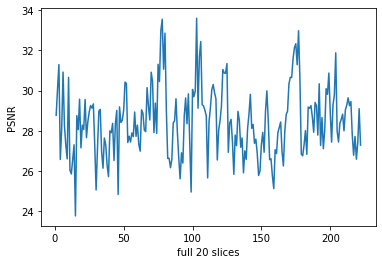

In [70]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')



# MSE

0.00155899636364548
0.0013649968742691328
0.0012876518325071267
0.0013292605456624485
0.0016420837252433787
0.0013916065927910741
0.0013309955187404323
0.001265663716959514
0.0013059820485992247
0.0012629599576377752
0.0013562317025039023
0.001432209097145048
0.0013740750650383265
0.0013832114651361946
0.0012565674235659628
0.0012355384701702899
0.001200053096652924
0.0010965620312554907
0.001149766979908111
0.001471306877420573
0.0011150936542792657
0.000993846941254557
0.000881409708965396
0.0009368272906582582
0.0011146101846066414
0.0011631027539564403
0.0010180504400458985
0.000920972041462562
0.0009585367176048188
0.0010357036989926817
0.000957017045877322
0.0009366040330867592
0.0009616652980704529
0.000998880793358639
0.0009659008538157619
0.0009332490926070555
0.0008865094312955614
0.0009000040300141559
0.0009391003940112876
0.0010224326582145527
0.0008161691020759592
0.0007674104175708597
0.0006841975912404606
0.0007483819285137288
0.0008948262822744857
0.0008001447299252828


0.0019900491054227463
0.0020605495583036586
0.0018466226920308983
0.0019070906851489666
0.001954679374930821
0.001647411457853533
0.0014690588815421462
0.001345386370434382
0.0013973072214034494
0.0013873773684654391
0.0014368815287079102
0.0015412091116740866
0.0016137844715139419
0.001630581813795202
0.0014033812502852543
0.0014747332489027135
0.0014187236442828924
0.0014149073967498031
0.0016361747119406674
0.0017635625556797368
0.0018501492818566016
0.0014818045980611043
0.0016750714669506437
0.0015364880426101636
0.0014505361383904624
0.0014972568112587934
0.001305372078763631
0.0012311801554106062
0.0011927321060226114
0.0011449895151812526
0.001173779089317069
0.0011829890789193645
0.001407212860865073
0.001435581068155457
0.0013443414349384045
0.0014285196616655176
0.0013045268753085393
0.0014092641719229563
0.0014314471299562152
0.0015586267537429654
0.0014826781739530016
0.0013810533282876914
0.001385809761415598
0.0012743037578501256
0.001296773495478905
0.001257319317226703

0.0032745621738148128
0.0033498407373224325
0.003366682878547473
0.0032180758267453774
0.0032250063265375495
0.00330176762865414
0.0014376388258329422
0.0013702627012047706
0.0013326071432674237
0.001270525718041688
0.0013033564251528802
0.0012900624715877222
0.0012214819142328428
0.00116388920603325
0.0012630547432882812
0.001291680508265165
0.001226982331589153
0.0012393517299003102
0.0012293353812173257
0.0012046827666204892
0.0011256361587746802
0.001066024230304922
0.0010028834179773454
0.0009534037490828288
0.001048867697710009
0.0012122287090659653
0.0018661919939697096
0.001580792161517331
0.001448051186202969
0.0014705116072857996
0.001576258106545375
0.0014748905231020775
0.001492071494871116
0.0016507481816697227
0.0017459604972648347
0.00151816742868404
0.0015048194407983383
0.0015775938365152951
0.001436306454115458
0.0013137017985744735
0.001245151761008417
0.0011817506914157244
0.0011352349822291758
0.0011204696033090835
0.0012491655435180684
0.0015386653013304582
0.0016

0.0007144230608792511
0.0006595245337215843
0.0007174009689596046
0.000831560553411753
0.0008154005078543983
0.0008092612761538816
0.0007836229124283181
0.0007928309700142196
0.0008409842930688222
0.0008105722502451118
0.0008223268447695384
0.0008363579973769958
0.0008599225639423376
0.0007820468990090402
0.0007266396480637799
0.0008136967112062842
0.000826644211701302
0.0009160018790700741
0.0011571769866233275
0.0011225184103626495
0.0009498217835900442
0.000800924125103212
0.0008544040446464232
0.0009007148728229501
0.0009540753607846535
0.0009176286124600176
0.0008625023317546531
0.0008196245299263885
0.0008466744862803345
0.000930038549795655
0.0009462403273497887
0.000940606281771635
0.0009799959563042957
0.0008558565381151793
0.0007854313213567937
0.0007814584387487852
0.0008477298643368627
0.0009448789498027064
0.0019054690345234136
0.0020971285474184103
0.001926535866746554
0.0015660716618658838
0.0014918787877839196
0.0015178136350572412
0.0015554985490371525
0.00151378234113

0.0022611778327704894
0.0021577186732022365
0.0025688630404426403
0.0028727809877658857
0.0015868029167606145
0.0014689358910150094
0.0013550462564477844
0.00139639861660996
0.001438795551809422
0.0013869567701857836
0.0014223348846828447
0.0014066186050346392
0.001376133846387106
0.001368878305174316
0.001327448228208578
0.0012567306792658631
0.001193413546742612
0.0011806394721281179
0.0012441698967919136
0.0013032673008272384
0.0012430027415421627
0.0011996425852922872
0.00130388368027446
0.0014339805667738935
0.0013020351212278186
0.001168735628169628
0.001086116835773338
0.001087179669376912
0.0011855700362058024
0.0011665466391177514
0.0011641277145418797
0.0011502081475285866
0.00115855062025744
0.0011044909499819688
0.0010405807717885941
0.000979851465105053
0.0009250457614016182
0.0009640314212431869
0.0010141713587979535
0.0010407601623618223
0.000998909921889087
0.000972588578397022
0.001143885286841128
0.0012124900853878362
0.0014292908589882696
0.001483659540869479
0.00142

0.0013433984187006677
0.0015644478231168564
0.0024930676453028696
0.0021360507105944956
0.0021017440112967582
0.00235468284132602
0.00263375253887085
0.0028962912796132237
0.0027528372778961403
0.002740117443920732
0.0026265747263016443
0.0025958667446967214
0.0026092172825287864
0.002193004372215617
0.001999342515516722
0.0019113632208593069
0.0018025992224731347
0.0017378099070160394
0.0017389202475379187
0.0018155341521543847
0.0018434953043188441
0.002035384805430775
0.0017749323846514113
0.0016105158826381426
0.0015213483555069646
0.0015833037989060107
0.0016776090745733354
0.0017471485608673125
0.0017130786130443113
0.0017378907992110838
0.0016794526478144064
0.0017262749729805723
0.0018045971793901484
0.0016688696503668083
0.0015403264029237719
0.00143356983097985
0.0013362116601532896
0.0014455151053632289
0.001365102128143894
0.0013203536991865578
0.0013838866963067548
0.0015576124066570705
0.0016059342465134224
0.0013772096346706072
0.0013283338028024592
0.0013615876909763788

0.001258866511384027
0.0012172261044539109
0.0012824479485433905
0.0012978295074186636
0.0013483162758613988
0.0012487814538789425
0.0011953793419556121
0.0012058468858599407
0.0012350756971197792
0.0012457506471220347
0.0013166148957339764
0.0014446556806406124
0.0011901878039511438
0.0010552262851393594
0.0010419030701075659
0.0010358675531322247
0.0010068236265109343
0.0011317216404555768
0.0011723989403621487
0.0011878700131931197
0.0010583244574738067
0.0009975937693186697
0.0010599389052422248
0.0010054202248746913
0.0009986145173646482
0.000977174148478747
0.0009512306333667546
0.00096043126132853
0.0009651423444125859
0.0009660475713890656
0.0010400017978024613
0.0011502107354254285
0.0015667541111744358
0.0015054339150378502
0.001649378314176752
0.0016681479607448756
0.0016338791909342953
0.0016465670037050842
0.001674636378531734
0.0016037302231172042
0.0014266082399482661
0.0014081379177832134
0.0014681352617911974
0.0015871107487118194
0.0014642401770350436
0.00137823111417

0.002207019147852238
0.0020204839718729684
0.0018884827944865906
0.0019448212907211457
0.0019212588132497147
0.0017791878854041833
0.0018384411780504647
0.002041528246317307
0.0021439617304760926
0.0022802249708575298
0.0024639112293667843
0.0023393098836550484
0.0022974535720625957
0.0022574202205364047
0.0024149670080343046
0.002414125356186093
0.002373113875968688
0.002324327687738596
0.0023962156152094473
0.0024735139252485723
0.0025319598490396965
0.0024551792264395043
0.0022339056999102053
0.0021479712680326692
0.0022044623262615004
0.0021869382869314563
0.002326706172922316
0.00252084466364662
0.0026777534648379318
0.0025647918849582103
0.0016121994267425785
0.0014948132091137255
0.0014328596796438322
0.0015440460471294738
0.001699181458122366
0.0015771422742093377
0.001677489833956442
0.001682865225489245
0.0016747312199900848
0.0016775493833433716
0.0016322747704235062
0.0016055595181624527
0.0015933323894901786
0.0015639844546958526
0.0015012173938430992
0.001421662823247454


0.0013277958820839997
0.00134669617208736
0.0012944001922926584
0.001255830003827744
0.0011651968231778417
0.001185134553261689
0.0012168879303165654
0.0012477614362989033
0.0011403362179417543
0.0010255702503568006
0.0009982308658466985
0.001033284065497679
0.0010860122347061813
0.0011848188122447034
0.001084640145809336
0.0009883321996306499
0.0009873425557379721
0.001017801889687113
0.0011737290871653993
0.0012321352018419241
0.0012408703996466671
0.001322182449325919
0.0012101320149922744
0.0012350901281846843
0.0012175131194559817
0.0011715225840090416
0.0012289045066714859
0.0012660553739047094
0.0012110582021177814
0.0011442251670190245
0.001099613664885841
0.0010998318297015556
0.0011899480067985003
0.0012879255411691521
0.0012112941635859698
0.0010901345066315102
0.0010513092321489674
0.0011022890198657672
0.0012140510242992886
0.0017584024694548414
0.0017616111016632305
0.0017893966729865959
0.0016630995527153387
0.0016198933734819705
0.0016486077311348287
0.00162932387976647

0.001244970338238673
0.0010973567769414867
0.00109828335760187
0.0010594751674860225
0.0010231762431994024
0.0010797799518904839
0.00117535821435632
0.001313344414788606
0.0010700348267216019
0.0010767376777108912
0.0010634540637462116
0.0010784457979533923
0.0010642572347658661
0.0010688347886692322
0.0010409455238672676
0.0010377291767312785
0.0010190495386066985
0.0010572573632047387
0.00117269206863946
0.0012972699532859486
0.0012937500922445442
0.0011803524303793133
0.0010898729370751657
0.0009635521703415236
0.0009058180354329614
0.0009397670915728986
0.0011242880960382513
0.0016748931505796098
0.0013257507278983444
0.001197910366360331
0.0010996145902365901
0.0013027488446393821
0.001380943742123544
0.0014362206708780484
0.0011364369645229678
0.0010617096389080223
0.0012314291169593086
0.0014215343132599196
0.001150640172543925
0.0010807616101207354
0.0011925336748818578
0.0010904722825240693
0.0009843500529143404
0.0009196047498140253
0.0009665924316316453
0.001136370145902984


Text(0, 0.5, 'MSE')

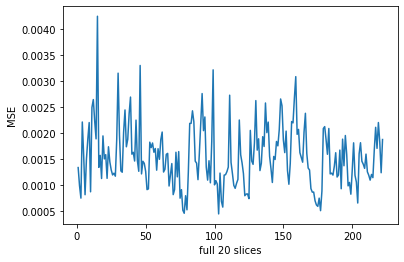

In [71]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)
        
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')





# crnn23

In [24]:
data_test =scipy.io.loadmat('Test_16und_truth.mat')
test_truth = data_test['imagesTruth']
del data_test

recon = scipy.io.loadmat('Results_unet/Results_crnnDCNormalised_23und-Results_DCRNN_23und_100epoch.mat')
recon = recon['recon']

print(recon.shape)
print(test_truth.shape)

recon_channel = np.ndarray((222,128,128,20,1))
test_truth_channel = np.ndarray((128,128,20,222,1))

recon_channel[:,:,:,:,0] = recon

test_truth_channel[:,:,:,:,0] = test_truth
print(recon_channel.shape)
print(test_truth_channel.shape)

recon = torch.from_numpy(recon_channel)
test_truth = torch.from_numpy(test_truth_channel)

print(recon.shape)
print(test_truth.shape)

recon = recon.permute(0,1,2,3,4)
test_truth = test_truth.permute(3,1,0,2,4)

print(recon.shape)
print(test_truth.shape)

recon = recon.numpy()
test_truth = test_truth.numpy()

recon = tf.convert_to_tensor(recon, dtype='double')
test_truth = tf.convert_to_tensor(test_truth, dtype='double')


recon_crnn23 = recon



(222, 128, 128, 20)
(128, 128, 20, 222)
(222, 128, 128, 20, 1)
(128, 128, 20, 222, 1)
torch.Size([222, 128, 128, 20, 1])
torch.Size([128, 128, 20, 222, 1])
torch.Size([222, 128, 128, 20, 1])
torch.Size([222, 128, 128, 20, 1])


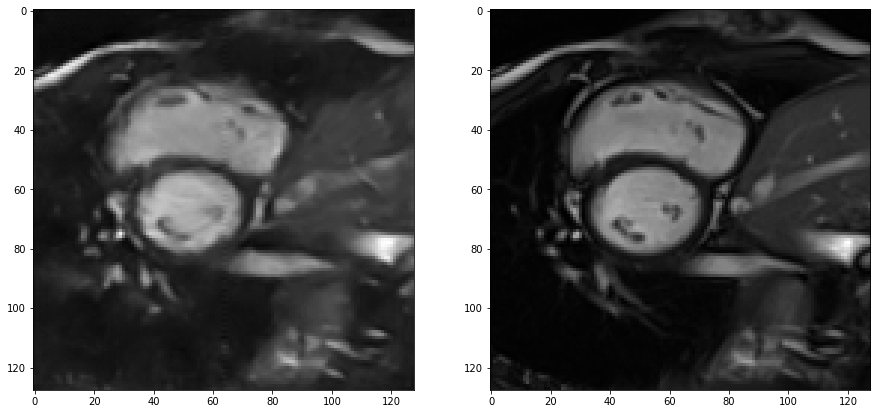

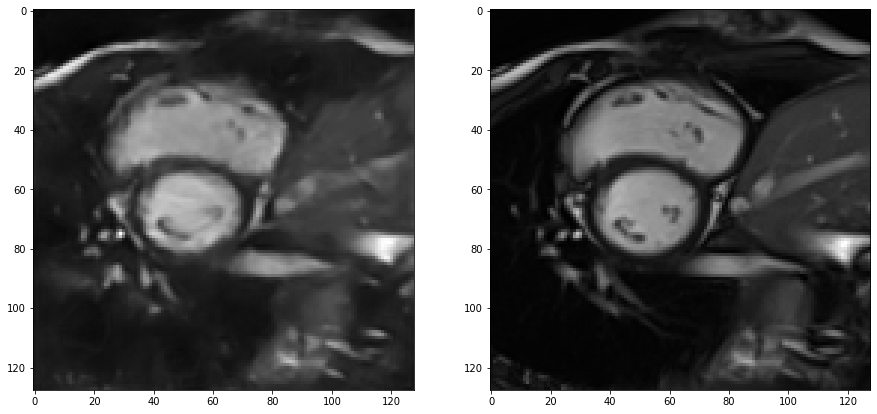

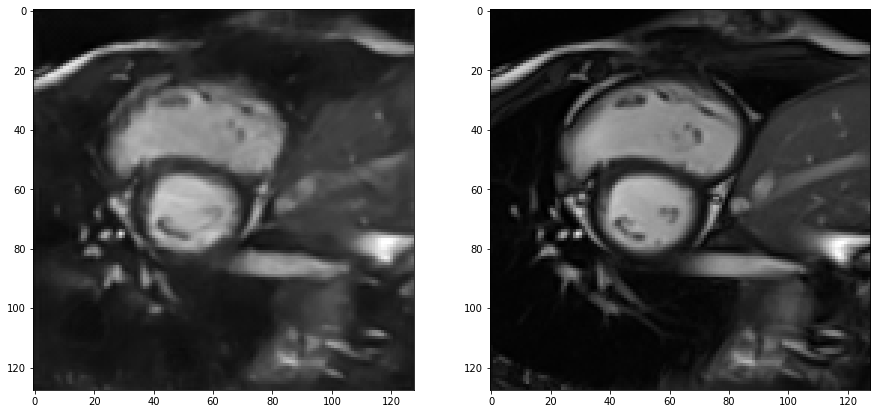

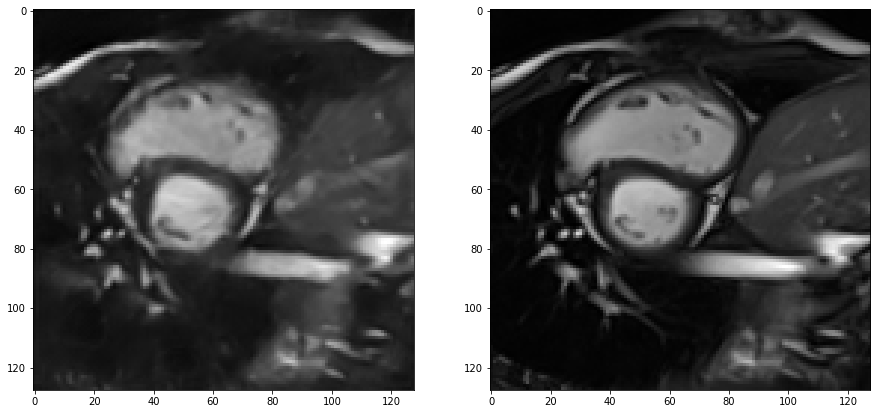

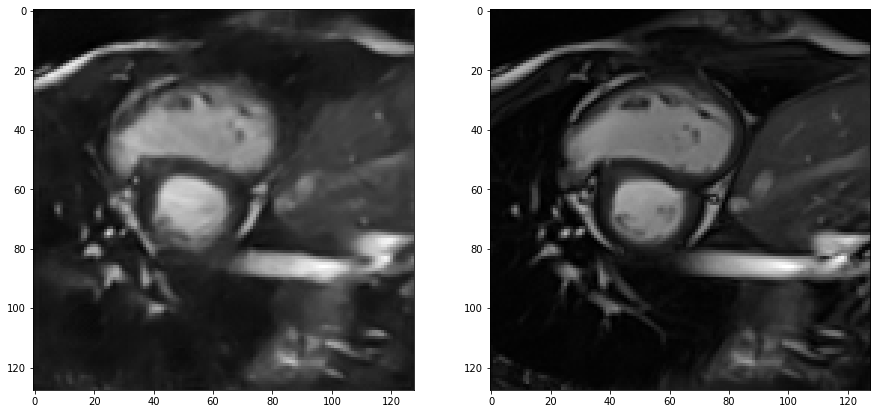

...

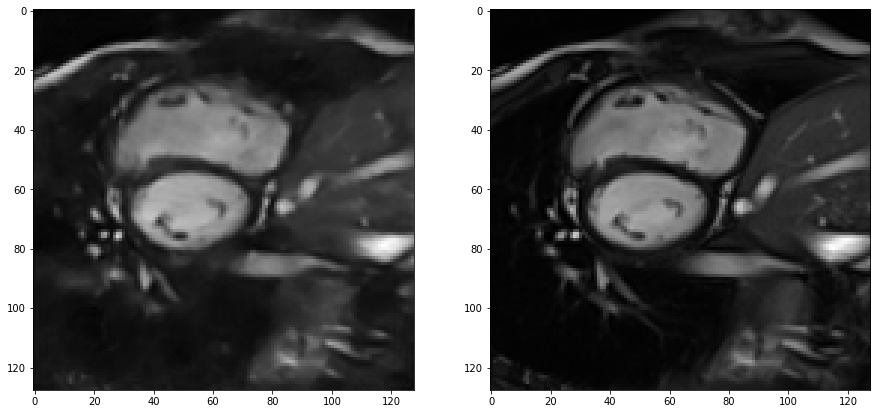

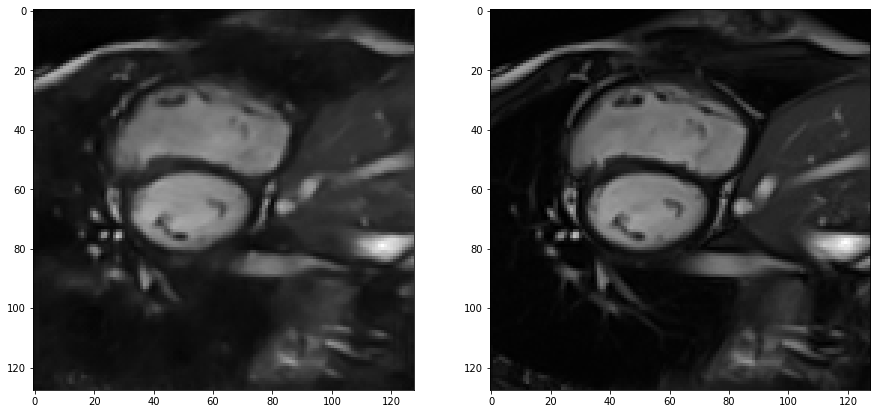

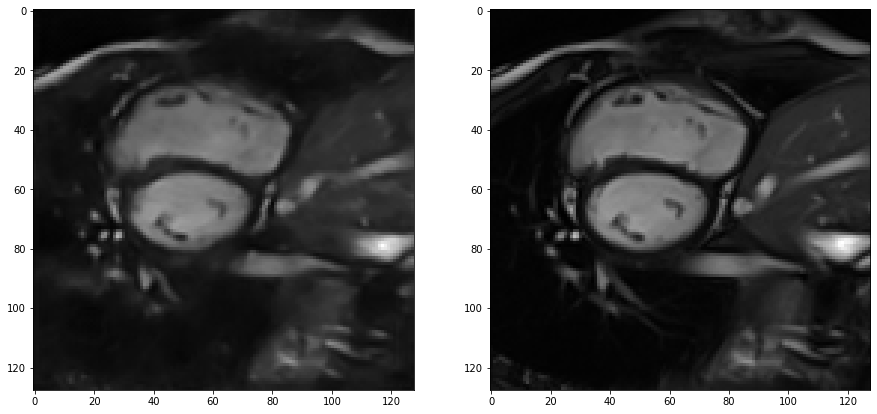

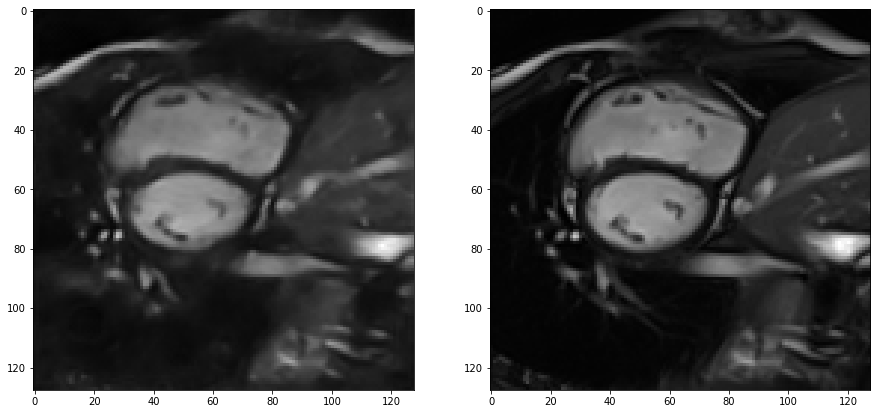

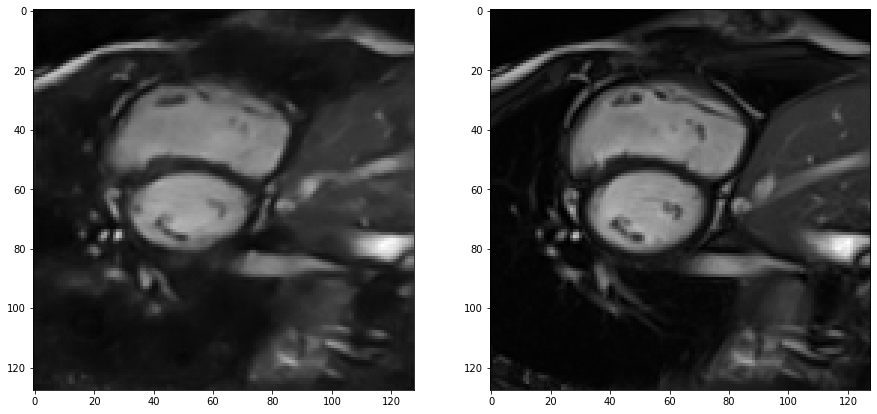

In [19]:
for i in range(1):
    for t in range(20):
        f, arr = plt.subplots(1,2, figsize=(15, 15))
        arr[0].imshow(recon[0,:,:,t,0], cmap='gray')
        arr[1].imshow(test_truth[0,:,:,t,0], cmap='gray')

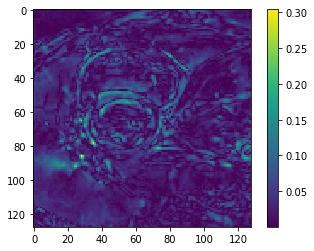

In [70]:
plt.imshow(np.abs(recon[0,:,:,0,0] - test_truth[0,:,:,0,0]), cmap='viridis')
plt.colorbar()

# SSIM

In [73]:
results = []

In [74]:
for t in range(20):
    a = tf.image.ssim(recon[:,:,:,t:t+1,0], test_truth[:,:,:,t:t+1,0], max_val=1)
    print(a)
    results.append(a)

tf.Tensor(
[0.75663656 0.78058386 0.78945357 0.81511307 0.8073216  0.804179
 0.77991956 0.7701371  0.7350236  0.8135495  0.7811037  0.7382859
 0.7580713  0.74297416 0.7448737  0.8045061  0.766747   0.77692926
 0.7514902  0.7641554  0.76360595 0.77536494 0.7253239  0.73486054
 0.7360637  0.75269586 0.8063581  0.83835    0.730557   0.74793786
 0.7595937  0.8253943  0.81849647 0.7362298  0.76401526 0.7681941
 0.76665527 0.7512254  0.81830466 0.8014065  0.7991283  0.8038458
 0.7329107  0.7059121  0.7578352  0.7701271  0.8258179  0.79794514
 0.75646085 0.8023758  0.8457745  0.8489056  0.76674056 0.6944343
 0.82876587 0.81662005 0.8065362  0.8189029  0.7741943  0.75965285
 0.731922   0.7469797  0.8091697  0.82556856 0.767637   0.74132186
 0.795271   0.784211   0.7962126  0.8313361  0.860522   0.8405979
 0.7885868  0.72259897 0.7796699  0.80752563 0.8494272  0.8487056
 0.86051285 0.89337814 0.8787553  0.77681214 0.7681438  0.7691517
 0.77267045 0.7880084  0.8158306  0.84377855 0.7423613  0.73

tf.Tensor(
[0.76691914 0.7834591  0.77022266 0.81919354 0.7998988  0.80679125
 0.7892867  0.7938426  0.7489181  0.83629006 0.8083369  0.7703203
 0.79058516 0.7699265  0.7505795  0.8101145  0.7826882  0.82283723
 0.7276415  0.7398911  0.7166907  0.7732167  0.71224326 0.71930647
 0.7309532  0.75823975 0.8168172  0.85406995 0.7390562  0.74341726
 0.77896595 0.84494925 0.8394653  0.77338594 0.7809237  0.7922869
 0.78633136 0.7820282  0.82497466 0.8309752  0.8280364  0.8304922
 0.7733157  0.7432401  0.78447545 0.7814109  0.8180187  0.7905718
 0.74875623 0.8052497  0.86947167 0.8711325  0.8026281  0.7522508
 0.83967686 0.81903    0.8169222  0.8098419  0.78786117 0.78241163
 0.75423723 0.7741006  0.83404845 0.839568   0.76453006 0.74383146
 0.79015684 0.79614526 0.7967714  0.82267916 0.8641303  0.8399086
 0.78145516 0.74118066 0.7937856  0.80950296 0.85370964 0.84960794
 0.84690255 0.8851467  0.8687253  0.79979223 0.7898794  0.8108803
 0.8067761  0.82099015 0.8349541  0.86184895 0.7858527  0.

tf.Tensor(
[0.7706749  0.7663488  0.7747502  0.80982465 0.79762447 0.80795807
 0.7990486  0.7871803  0.7570508  0.8251001  0.7947436  0.7678023
 0.7980687  0.76163924 0.75092703 0.80661935 0.79117715 0.82067484
 0.77066475 0.755227   0.7617125  0.7620631  0.71099186 0.72479385
 0.7357275  0.7642663  0.8144014  0.8627568  0.7461713  0.76139164
 0.77136725 0.83924073 0.8469434  0.7879364  0.77527744 0.7892283
 0.7784026  0.76933086 0.83091825 0.8392748  0.82543445 0.83264154
 0.78386265 0.7402782  0.77242327 0.7890503  0.8062707  0.7826245
 0.7580169  0.7928327  0.84454143 0.8659694  0.8090839  0.74669206
 0.83326274 0.81837195 0.83112943 0.810742   0.786729   0.7866859
 0.76196736 0.7795786  0.83491087 0.8370225  0.7819623  0.7640662
 0.80274576 0.80734813 0.7961675  0.81389934 0.86470175 0.8430091
 0.7776177  0.74858034 0.79374653 0.795139   0.8287753  0.8241018
 0.826645   0.8891839  0.8852026  0.7843702  0.786402   0.7966096
 0.80626583 0.82661915 0.8413999  0.85779387 0.7952415  0.7

tf.Tensor(
[0.7777553  0.78387415 0.7909363  0.823565   0.7996919  0.8262432
 0.80983746 0.7997702  0.78445685 0.8410965  0.81549084 0.7736872
 0.8032968  0.7587192  0.7585489  0.81023455 0.7903565  0.83693975
 0.8018     0.7907294  0.7786676  0.8073612  0.75212705 0.74725455
 0.7671151  0.7825562  0.847956   0.8689144  0.76653576 0.80542564
 0.7809513  0.84142333 0.8385729  0.7728481  0.7725708  0.797446
 0.7788062  0.7702141  0.8305998  0.8361404  0.819353   0.8304695
 0.796597   0.7385458  0.78499466 0.8177432  0.84700906 0.8150932
 0.7751712  0.822289   0.8763656  0.86796874 0.82105565 0.75727725
 0.8461436  0.83156735 0.8374109  0.8354023  0.810655   0.7856671
 0.76538354 0.7813583  0.83844537 0.84401286 0.79865736 0.7796936
 0.8176385  0.8221655  0.8107097  0.8481612  0.8679594  0.8471592
 0.7820937  0.76871204 0.81147057 0.83015245 0.8590543  0.85705775
 0.8547541  0.8799768  0.8799845  0.796307   0.7886396  0.80691147
 0.80714685 0.8210736  0.8447157  0.8615327  0.7954295  0.76

tf.Tensor(
[0.80638033 0.7974926  0.79926574 0.83726263 0.8075621  0.8241182
 0.8183135  0.80948126 0.78013515 0.8502817  0.8302253  0.7722042
 0.800306   0.77104145 0.76590323 0.817702   0.7854488  0.8300034
 0.8088405  0.80696154 0.8011897  0.80769885 0.76743954 0.7675091
 0.77610236 0.79442394 0.8402558  0.87360376 0.76152253 0.8077817
 0.7875594  0.8436792  0.8254126  0.7836255  0.801087   0.8003117
 0.790711   0.7897414  0.8366603  0.82967526 0.8336474  0.84408695
 0.7829992  0.75114477 0.81275815 0.83207667 0.8641558  0.84119076
 0.8135263  0.8574055  0.8928278  0.8730278  0.8210021  0.7597192
 0.8409661  0.8342794  0.83085716 0.8371883  0.80713063 0.7814758
 0.7733752  0.7839509  0.83383036 0.8413496  0.8046763  0.7734771
 0.8278766  0.81262946 0.8143994  0.8566925  0.87439865 0.8488203
 0.7911093  0.7868167  0.8189024  0.8353149  0.87326473 0.8649958
 0.8689981  0.9042445  0.8802742  0.80320406 0.7867353  0.8050149
 0.8041184  0.82000154 0.84233826 0.8585304  0.7985407  0.76479

In [75]:
r = []

In [76]:
for k in range(20):
    r.append(np.mean(results[k]))

In [77]:
np.mean(r)

0.80975753

[0.783542, 0.785644, 0.78754, 0.8207237, 0.80405104, 0.8152811, 0.8040823, 0.7994727, 0.7638852, 0.8364979, 0.8090531, 0.7655761, 0.79157317, 0.7629446, 0.7542763, 0.8092559, 0.78310853, 0.81891763, 0.7800929, 0.7754797, 0.7683773, 0.78914297, 0.7369429, 0.73840374, 0.75148886, 0.77239716, 0.8272544, 0.85965455, 0.7554625, 0.77830446, 0.77764827, 0.8394362, 0.8327614, 0.77398807, 0.779787, 0.79316485, 0.781771, 0.77412355, 0.8297599, 0.82832545, 0.82256603, 0.8298548, 0.77616566, 0.7398271, 0.7868388, 0.804201, 0.8349202, 0.8119353, 0.7793837, 0.82261, 0.8705413, 0.86738366, 0.8077822, 0.7469417, 0.83797204, 0.82509744, 0.8254771, 0.8243494, 0.79511493, 0.7783219, 0.7608148, 0.77651894, 0.831987, 0.8381022, 0.7870876, 0.7659992, 0.80961114, 0.8050286, 0.8020418, 0.8326575, 0.8661908, 0.8438824, 0.7808367, 0.75834215, 0.8036213, 0.81738406, 0.8540567, 0.84920233, 0.84867364, 0.8884076, 0.8778372, 0.79476136, 0.78597975, 0.7985936, 0.7986402, 0.8156555, 0.8359734, 0.8566284, 0.78676826, 

Text(0, 0.5, 'SSIM')

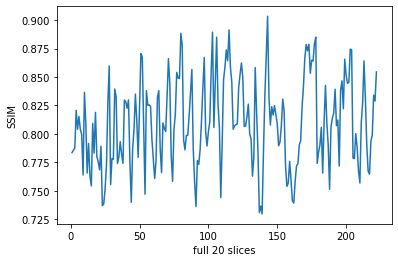

In [78]:
results_patients = []
for i in range(222):
    results_patients.append([results[k][i] for k in range(20)])

results_ssim_patients = [np.mean(results_patients[i]) for i in range(222)]
print(results_ssim_patients)
print(np.mean(results_ssim_patients))

plt.plot(np.arange(222)+1, results_ssim_patients)
plt.xlabel('full 20 slices')
plt.ylabel('SSIM')

# PSNR

In [79]:
results_psnr = []

In [80]:
results_psnr = []
for i in range(222):
    for t in range(20):
        a = psnr(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_psnr.append(a)

27.246699515723943
27.76587045571928
27.99058888683083
27.319058544575945
26.637262403151336
27.524742065128663
27.922345246654984
27.965758710911615
27.809918568853234
28.162074672710187
28.182628914195465
28.186528973146224
27.831274417562497
27.985750023253672
28.206274059111895
28.259510801663343
28.500155312187694
28.631224136665075
28.66290420870825
27.900396658701897
28.94000123553863
29.047794169314102
29.179873740653058
29.05342337960098
28.845883863558214
28.84975892784638
29.01757234902704
28.603070304823312
28.36031797085752
28.49492910687255
28.890129672008538
28.908383163598227
29.033305166060615
29.221328620117642
29.543420191177038
29.631721194707296
29.44290334078053
29.406444939631832
29.271187108657635
29.23554081429186
29.41795760032724
29.36450822530963
29.368229363946796
29.233650218363685
28.809000326796696
29.260968725004226
29.381178732667284
29.186774510543852
29.24103901721823
29.22053443075383
29.28778560972495
29.42061892161467
29.25457042804448
29.36196489

26.703497006566806
26.52160135647322
26.742298081021403
26.73305264427561
26.498625534393963
26.816896449316985
27.076329955290035
27.00645033207337
26.961081736502294
26.527901983144307
25.448441059982105
25.653825941963607
26.14043549414062
26.278863206588134
26.12335880753364
25.928329247981516
25.909589397212148
25.908688150876973
25.89356520753014
25.778510302803994
25.73075496000627
25.91387197306934
25.93451969827452
25.990355801845606
26.09601210812256
26.529861463244004
26.776211879510324
26.603600380124462
26.356567120016546
26.023407694810878
26.228382388251354
26.608346354171644
26.875985253006775
26.83301714725051
26.847955519359623
27.156774730647722
27.32854284288478
27.25881585117031
27.153897631399918
27.12933869369961
27.457197635508194
27.4363012056765
27.20737028846351
27.23644148884404
27.151210569500165
27.040720547876415
26.971742788388436
26.96138322370463
26.83046996945269
26.487262509014222
24.109840295823346
24.605742923564534
25.21503619215985
25.62081770534

28.86800518819083
28.923342427719927
29.070155240356456
29.066399786367732
28.830768063233027
28.60948372578557
28.44836821303282
27.730396947284028
27.530805595349893
27.883042298511622
27.86313888407056
27.83376339607019
27.651418454018103
27.591995744561558
27.569248954381614
27.503410736800248
27.55208075166336
27.39943406394401
27.648452968672057
27.843285705439822
27.92588986372989
28.01657464267976
27.896160432700214
27.967107990474794
27.906911843753374
27.82811590677361
27.43825231998015
27.09927383815044
25.917228751019156
26.315111672744482
26.520410206179985
26.55703209569262
26.44893326992588
26.31563494378202
26.282213371678832
26.473151206069204
26.654593611172437
26.574884967851453
26.481014385730447
27.062497206853358
27.12784866908145
27.0056739810439
27.026055805822715
26.91449994944195
26.85288778987834
26.9402156281247
26.63945759743679
26.466559591804312
26.501203839354236
27.144979575781885
27.153739986572425
26.984505464085387
27.366377966732593
27.1190786605656

33.17966342300273
33.30493692876801
33.35407032618662
33.39567214503995
33.354101636250284
33.77255966375209
34.22158114934247
34.28134743535616
34.512140440877
34.79117330846095
34.72584673649268
34.42006743855129
33.89035725214595
33.575946537956526
30.955838593597154
30.56595688647746
30.383110673789883
30.38307741679679
30.165524069728917
30.548014647953817
30.792835594703774
31.22010950175017
31.01280534025642
31.13038420024992
30.614158183380983
30.66303125798666
30.841568247186313
30.755653413636907
30.62312819716063
30.82866397040302
31.00519491031994
31.230493938597746
30.66821522066853
30.913577631080887
26.443994607946486
27.047831172283562
27.493932908192228
27.523115935079034
27.62069811881316
27.61441724695811
27.46895310799706
27.47018865470151
27.437999256277024
27.479200235653952
27.59495294337091
27.648439181058862
27.462938333573717
27.531252506819143
27.48202353577767
27.324461534198534
27.028072564622782
26.864480288057393
26.604151053541617
26.233834851619385
25.4

34.47328873697647
34.37015870667679
34.14933374702819
34.22348814858757
33.892063596941185
34.10909643711874
34.288337280025026
34.40688102790472
34.37200585941913
34.46427502688346
34.44013602994937
34.453651502493315
34.193176203055316
32.98716531478597
29.320633398703634
29.618763266909824
29.725420621414244
29.57693351480963
29.3906479007642
29.48238832476487
29.073402282955954
29.10354189684959
29.040594134753093
29.271796233309516
29.625008423711968
29.422271575284494
29.59929075786615
29.385843342399575
29.683349622332763
30.035522088480548
29.97501689340912
30.003703070315698
29.864365771969386
29.932613258967965
28.365131487020264
29.916417301655358
30.79994491140305
30.877595195669144
30.75811508346446
31.253594291215254
31.372473916340727
30.913329102648884
31.052025486401295
30.95271488892135
30.16931167033779
30.237783930916784
30.66814478667494
31.240754534458016
31.229488813172736
31.00703798505569
31.120005933057662
31.304209627107724
31.388247363113262
30.1099697367592

24.693684210805134
24.74045118739621
26.07288200524076
26.759643850655834
27.470593007511447
27.455623126208025
27.0847183761672
27.0753354516198
27.207795247883855
27.191655558193503
26.89302476801313
26.609288733209905
26.28621820170171
26.420120928581923
26.582912940686114
26.85306287079638
26.656924023682635
26.301035195247454
26.241247678928584
26.19438688331522
26.090681992240697
26.137735372895282
27.260099916546352
27.70805898710867
28.02804248695843
28.070985247916454
27.9073521079391
27.960466928779848
27.97454270181659
28.055921862873628
28.25901514184643
28.006984681021695
27.924182370572545
27.525081527090943
27.632369835860857
27.907618778121396
27.920523837536734
28.113620041318683
28.346437689458423
28.150514091575776
27.74289165654198
27.71906305526491
27.28647300713189
27.02051467777711
27.726196188977173
27.318340363493192
26.945198831498274
26.28957339310251
26.434649734686776
26.676863441007544
27.205788128804432
26.775982761056092
26.737933437482553
26.62478797546

24.97683048689012
24.912032813333226
24.79130695292941
24.679602415399145
24.62145739117227
24.70977670765923
24.678997010179124
24.749063322744572
24.815619239208676
24.7460602324731
24.366404233516835
24.278451510534715
24.383145848414834
24.757389548233387
24.971918173320606
25.169744790559363
25.147579395028146
24.947597398591512
24.78956463603087
25.157266096248314
25.404353658513514
25.37981799507319
25.405998524365906
25.493116476783662
25.16749751462332
25.09032258140413
25.507575185249657
25.605736292247393
25.51338444510842
25.44064831789292
25.385355147118524
24.93033086310595
24.81868033902483
24.957997155223257
25.322670844600648
25.46170948303405
25.402353391856508
25.287078140432815
25.21742853081994
25.271549381194948
25.473481621254223
25.59889448252693
25.723034980212315
25.83700601471515
25.55654849137329
25.790187179310593
25.857378424888772
25.73059791567121
25.5235923684716
25.449411923894264
25.422088298122347
25.23705840179619
26.66152274737118
26.78804712911533

25.24831594111465
25.32874658330989
25.22921641395667
25.020716434442694
24.957317579935918
25.041861536238258
25.170345620468453
25.368894644892368
25.552350561143026
25.23376819097511
24.904609651570023
24.91542233476516
25.814561499683983
26.281076996750215
26.749765288382434
27.011221086791434
27.292268116724063
27.244311064051708
27.159441455242714
27.131065917308433
27.18251367000327
27.04699335111707
26.826216510474858
26.72543222475333
26.64015122997949
26.95214839287712
27.333941868726402
27.72418270739085
27.72441115668459
27.257617051245898
26.83872849962832
26.64473356487648
27.34497045310637
27.51538165680477
28.069151417894204
28.38840872064866
28.550876871031775
28.602028204908695
28.586867933245216
28.363363543090017
28.379850102963502
28.67052143938338
28.73712512908135
28.662622107885266
28.625863074924727
28.37048998342944
28.619610485178498
29.02580251228517
29.185073275752096
28.89488918584902
28.37079411105257
28.119434771768898
26.081632163350676
26.2693674577257

27.281283464651338
27.310252507404712
27.340798771740094
27.345559744797534
27.613900753028418
28.08319463683107
28.0969965520571
28.09087691974783
28.106707698414397
27.674992502905916
27.483544531659074
26.86749142317727
26.925475894141012
27.330261173071897
27.465736712716037
27.72507574880845
27.37077369610175
26.633533893980367
26.48885172329836
26.791673176993086
27.10578467009812
27.380843704739085
27.458050063833763
27.656143092440967
27.910713621054445
28.171968017732706
28.35280755702169
28.376481443981522
28.202945902962114
27.666614065454556
27.4519039006206
27.43146466187209
26.15934677427397
26.58791354430527
26.859274259876624
26.942280227681827
26.950480438275783
26.662043506447475
26.33156961434896
26.287478361280744
26.29264208409596
26.466904884286997
26.52520048667544
26.828734213093952
26.787973542340143
27.088709979691018
27.43241688438382
27.66988563512286
27.693730981896497
27.35600523374819
27.131112300309272
26.610389610998418
25.24893574330575
25.435473620004

In [81]:
np.mean(results_psnr)

27.20490883642188

[27.9345483287728, 29.04884946295615, 29.251175588980686, 30.05315180548942, 28.568218890425413, 29.330926259274975, 28.338915738340756, 28.680829013428173, 24.110821380940543, 29.89616535488234, 26.284878832174883, 25.613315924161174, 23.271023045239332, 22.768031610477486, 23.467233684561315, 26.188981447698335, 26.377840472245502, 29.171159674988672, 27.148700020004394, 27.51832713194026, 27.16976744846189, 28.118158303809075, 23.880451443200492, 24.007525577591466, 23.611728062817875, 25.942073027689283, 28.530412003452277, 29.560371556547672, 22.488919957712742, 26.565097534606156, 25.31712276480743, 26.151188792092363, 26.214645178993, 26.528971392689034, 26.050938494781867, 27.010057831913553, 25.511871513065394, 25.18859355906198, 27.847700581331054, 27.55671412964615, 27.09063472528616, 27.7125110479537, 25.93102770890146, 23.37789655249362, 24.632660640596534, 25.837154513646446, 28.3803397023806, 24.571197847230792, 24.940690842270932, 26.429823452665524, 29.393916087401088,

Text(0, 0.5, 'PSNR')

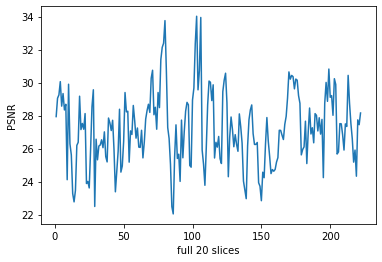

In [82]:
results_psnr_patients = [np.mean(results_psnr[0+20*i:20+20*i]) for i in range(222)]
print(results_psnr_patients)
print(np.mean(results_psnr_patients))

plt.plot(np.arange(222)+1, results_psnr_patients)
plt.xlabel('full 20 slices')
plt.ylabel('PSNR')



# MSE

0.0018850811401815999
0.0016726803477505052
0.0015883313622922016
0.0018539334720745816
0.002169070958630721
0.0017681772296656204
0.001613487017563656
0.0015974384327556257
0.0016558010098025103
0.001526836497332799
0.0015196273754300737
0.0015182633295426828
0.0016476788166628522
0.0015901020506988415
0.0015113762525197437
0.0014929625705167515
0.0014124870304249842
0.0013704954130754723
0.001360534563196221
0.0016216619776526448
0.0012764384456731268
0.0012451468753409837
0.0012078489495300922
0.0012435339943840545
0.0013044024734088166
0.0013032391178336006
0.0012538418607549512
0.001379408727756811
0.0014587074563761145
0.0014141878097241242
0.0012911807208563547
0.0012857652488322793
0.0012493078917963972
0.0011963744731547166
0.0011108565519401283
0.001088498614363022
0.00113686701461498
0.0011464510226483321
0.0011827182251260813
0.001192465762315189
0.0011434159339045113
0.00115757510304347
0.0011565836898976734
0.0011929849864348984
0.001315527609779652
0.0011855042834359982


0.0037928306413104926
0.003491549325015766
0.0034767202587805677
0.00334730604618879
0.0033974393612163775
0.003392340682294124
0.003787369997031659
0.003976136644963558
0.00478854224255237
0.004315999508460417
0.0044168216855700985
0.004220909066172896
0.004474057108482001
0.004362225716908948
0.004450933856525575
0.004252293321168244
0.004220830723899161
0.0043408586013381975
0.004687824224547014
0.004893503755567621
0.004614821733944757
0.0043796186899677115
0.004252910257119957
0.004047670820320503
0.0039190356684672654
0.003979029105169006
0.004134287317338315
0.004455073257215499
0.0026164986838378874
0.0023169580988740474
0.002471970756377828
0.0025108659337325446
0.00253272605266524
0.002505806346223898
0.002497378603066003
0.002319609923436576
0.0022870935639740485
0.002501578487856146
0.002707940135750279
0.0030252069871225433
0.002925864654726001
0.0027033593076765065
0.0025099727939128856
0.002366315711817726
0.0023137677158316028
0.0024082658313224013
0.0026607768093923033

0.004012172152250611
0.0036652143750804103
0.00340366164907857
0.003497227022157727
0.0036312989897543647
0.0036603943420635363
0.003548322732014277
0.0035829947870759035
0.0036344613528831978
0.00374339537721123
0.003366232485330155
0.0032761050391802446
0.0034234610753961525
0.00373509337609937
0.003126625672509496
0.0029310145207570213
0.0028459621286180117
0.003234551626867638
0.002923177775131861
0.0030876644423441556
0.003306344637911856
0.003512786337461541
0.003310621196813522
0.003292759513646085
0.003053786390081242
0.002657125924338237
0.002900619401289048
0.003271569599795063
0.0033534696645650215
0.00257846200022494
0.0022000579618219962
0.0021287151181320248
0.0023544080193356686
0.002477060850931218
0.0021770233228308373
0.0021808049476113346
0.00227706720345754
0.0023834312619748065
0.002341389481326477
0.0024269843637052787
0.0025335263375804605
0.002418818016144593
0.0022819621341000325
0.002189852506560984
0.0021429393257276627
0.0018397752494680995
0.002152202751010

0.0008357048336291472
0.0008393846270060353
0.0009055456461726018
0.0008806352606230157
0.0009439453756667027
0.0008591269334513853
0.0008171301456495947
0.0007702839346785669
0.0007546407697218795
0.0007329574566023397
0.0007336864221226079
0.0007696769750479555
0.0008141218035022603
0.0017282756452360426
0.0018005156618805136
0.001900003475170325
0.0017241752263619805
0.0016833755105400854
0.0015810271474547203
0.001498423801159537
0.001410051228024874
0.001428464352795273
0.0015306285519249847
0.001636968465090677
0.0016088957732602782
0.001583526110623546
0.001558841647088834
0.0015879801155505645
0.0014686563322952473
0.0014407228923001198
0.001283020163704926
0.0014456325502311069
0.0015914670344392584
0.0013711142662879306
0.0014419012144099535
0.0014986983484480505
0.0013850783320388865
0.001445924757178584
0.0014524588578818504
0.0014819401681753779
0.0014925961301767532
0.0015453033618105802
0.0015180672583952886
0.0014464377634720762
0.0013799747709813191
0.00134022309735752

0.0020775302792546343
0.0020849736012621984
0.001993605147241347
0.0019648780867533126
0.0018514198275530382
0.0018446810724024112
0.0019388833220970378
0.001960995577619034
0.0019465611856884757
0.001888489954668598
0.0016945163696735158
0.0015511229836174712
0.0015071360331492852
0.0015989677513616129
0.0015564635775372501
0.001492104125794942
0.0014215962650037492
0.0014080914516357555
0.001373787271821568
0.0013856717197194704
0.0014706110381008575
0.0015044247715524576
0.0015453428169151242
0.0014923852935273033
0.0013429489568207087
0.0013006782175548773
0.001403249935882781
0.001499049551278931
0.0015004203047805642
0.001779837718948077
0.0015040305155734656
0.0014721407124336202
0.001360141380207235
0.001355505632803974
0.0013303237250142865
0.0012270042617802427
0.0011972441301119465
0.0011869474336176147
0.0011388723142317292
0.0012205489509172903
0.0012209843283610968
0.0012423562947427955
0.001342711046755776
0.0013667061123850623
0.0012645813302824302
0.001192624749357367


0.0016176519465038184
0.0017096649223316972
0.0017165188584763822
0.0019274218250388627
0.0023452495860158797
0.0030248095426899414
0.003647626505224757
0.0039541079329208344
0.0029791820541238013
0.0026288865847125106
0.0024226716418096978
0.002427585346827579
0.002571871789763663
0.002879147240719317
0.0029452871262230914
0.002922023919477178
0.0027288727949363245
0.002733945230526062
0.003111069161972853
0.002680152455379255
0.0024684944901532994
0.002180556078699353
0.002025643059483308
0.0019298681275398974
0.0019041141831223178
0.0019735329768773603
0.0020400959399741224
0.0022993605085918746
0.0025388039927103714
0.0022369259177175606
0.002100931587863856
0.0021576033373670294
0.0023266243945323064
0.002316457043044641
0.002242480473942303
0.002282165828912304
0.002197708753365964
0.002291555169865314
0.0023690976073821417
0.0022503319112541784
0.0020989880942221626
0.0019227053200998809
0.0020296347877877567
0.0018941951920901162
0.0018265125964659046
0.0017701060829651426
0.00

0.0021432371048488164
0.0022194500696016105
0.002396627283091351
0.00267083491707467
0.0020767114237669852
0.0017858419625542499
0.0017207107340608768
0.0016178928855376236
0.0015929422740564173
0.0016664245621099277
0.0017404463327631012
0.0017165863474218356
0.0017348917937168743
0.0015957495195735782
0.0016042760800649316
0.0016371889480881097
0.0016983885596682838
0.0016603116513420214
0.0016412040508731606
0.0015491955154847128
0.0015108842558083486
0.0015742980608129072
0.0016601050893042001
0.0019447684337217004
0.0018509040501018012
0.0016606781979720529
0.0016596031070263732
0.0015215428976309532
0.0011351833091062674
0.001164453456202933
0.0012439811768575526
0.0014665629471892006
0.001474205522044184
0.0015670779847812724
0.0016282451272419487
0.0016556277681855653
0.001624673571412366
0.001510802634702256
0.0013883999704928929
0.0012951390560574927
0.001349085191832425
0.0013190997224147654
0.0014645623091095743
0.0015528801351512218
0.0015180512784236635
0.0015284505717754

0.0019239745708820339
0.0020753988478877587
0.0021154033885866716
0.0023267955926981167
0.002227990732167025
0.0021493899841028086
0.0021386167366695234
0.002228364626680617
0.002352858255916517
0.0022292450635072137
0.001951174327904663
0.0018766078570773281
0.0019668088260333975
0.0018624998957077776
0.0017974240947037773
0.0018605283387698147
0.001911385954120658
0.002044194873413537
0.0020032828104621326
0.0020332587923736164
0.002097010202853654
0.0023260252603934297
0.0025061866930823637
0.00254807864866883
0.002269931932145333
0.002134127135807505
0.0020581988320012624
0.0022844576102829263
0.002540432367860268
0.0024195187375872862
0.0021486009409145525
0.002065289802872492
0.0020565250916042416
0.0020082715031442657
0.0018972107744534288
0.002034031709984185
0.0021304699156090906
0.0021520283319142104
0.002149228444055292
0.002171509676149808
0.00230578970012292
0.0024254808402345467
0.0026801213049954978
0.0021715876876124756
0.002042550649786824
0.001936700682140426
0.001836

0.002433095900548325
0.0023128608776017703
0.0022031029034262897
0.002166668151817581
0.0022117393239732834
0.002113349186831231
0.0020732722757472685
0.002130854844165712
0.002147072333739998
0.002257926977479365
0.002274989119587492
0.0024407857882709043
0.0017893422061221295
0.001759235819837633
0.0016328988081980083
0.001488550279633787
0.0015202896634870428
0.0015087126696509002
0.0014738242317227845
0.0015265986574395294
0.001558208892087566
0.0016232448552363163
0.0016301058549899588
0.0016152750680758843
0.0015483784203920345
0.0014284522399562816
0.0014322522397088922
0.0014651766095279354
0.0014394831235019574
0.0014234934297497098
0.0015179309669417522
0.0015478961148842237
0.0016577793042622771
0.0016152760734206243
0.0015529512598500448
0.0014856810298479375
0.0015224214672341651
0.0015700366862377922
0.0015936687762955393
0.0016054548531931987
0.0016118974819413292
0.0016191992836601583
0.0015384252485443031
0.0014770987106149094
0.0015091702381347131
0.001521272174970708

0.0025133760255355376
0.002380246141182143
0.002370356693122548
0.0021180815886800972
0.0017993418321135678
0.0017723909072212517
0.0018091885607632438
0.0018988628927247716
0.0017549246109386004
0.0017381830316991979
0.0016707904104327604
0.0016171462084211116
0.0015425860756168258
0.0015522559510195559
0.0014544291465287162
0.0016308587669270702
0.0017401761464579048
0.0018671670399427588
0.0019661578626095745
0.002153067415787335
0.0012151156740720513
0.0010136940256308892
0.0010130110771472602
0.0008969819589793733
0.0008884158960417398
0.000892018276212076
0.0008722355152901775
0.0009051745904351234
0.0008724400881082783
0.0008882836636126441
0.000945792093042399
0.0008954821106843591
0.0008465349528574635
0.0008170568028003471
0.0007766101362767168
0.0007980059645532282
0.0008224744410477184
0.00088772484387086
0.0009156664559367058
0.0010339785057122766
0.0019065937870916348
0.0014308738061711143
0.001440862847020563
0.0014511602495629586
0.0015483561955622993
0.0014708201007539

Text(0, 0.5, 'MSE')

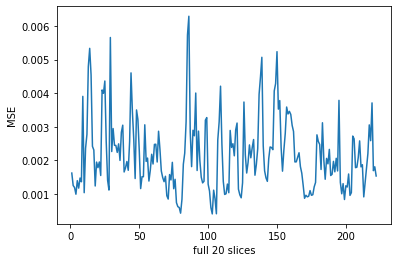

In [83]:
results_mse = []
for i in range(222):
    for t in range(20):
        a = mse(recon[i,:,:,t:t+1,0].numpy(), test_truth[i,:,:,t:t+1,0].numpy())
        print(a)
        results_mse.append(a)
        
np.mean(results_mse)

results_mse_patients = [np.mean(results_mse[0+20*i:20+20*i]) for i in range(222)]
print(results_mse_patients)
print(np.mean(results_mse_patients))

plt.plot(np.arange(222)+1, results_mse_patients)
plt.xlabel('full 20 slices')
plt.ylabel('MSE')





# All the reuslts

In [244]:
ssim_unet13 = [0.8457861, 0.83970165, 0.811525, 0.8418509, 0.84221905, 0.8709668, 0.8848046, 0.86247194, 0.8465041, 0.82869357, 0.8585683, 0.8329576, 0.80556285, 0.80454284, 0.79605067, 0.8734948, 0.8507694, 0.8164431, 0.8455766, 0.87160224, 0.8330879, 0.85866225, 0.8387597, 0.8240115, 0.84142196, 0.8561838, 0.8606885, 0.88230956, 0.85482484, 0.8091582, 0.8393402, 0.8896758, 0.8881261, 0.84181863, 0.83063287, 0.86201763, 0.8509075, 0.8533891, 0.8867137, 0.8945347, 0.88696605, 0.90055907, 0.85688543, 0.8700064, 0.88792837, 0.89006597, 0.88536406, 0.8778577, 0.892862, 0.89337397, 0.9167684, 0.9036933, 0.8590285, 0.854667, 0.8828912, 0.8772516, 0.8556465, 0.8716251, 0.87039745, 0.86716634, 0.8558974, 0.85559094, 0.8839075, 0.85323894, 0.84607327, 0.83427, 0.86322385, 0.86577064, 0.8784026, 0.8907644, 0.88293123, 0.850962, 0.8335622, 0.8586049, 0.861475, 0.8672501, 0.86179656, 0.81194735, 0.8430873, 0.8799319, 0.84509647, 0.80860585, 0.82227075, 0.8260001, 0.8202531, 0.8719715, 0.8747244, 0.90550727, 0.8429124, 0.7686824, 0.75591284, 0.8436592, 0.8792809, 0.8251972, 0.8817714, 0.88221025, 0.90054923, 0.8615348, 0.85937566, 0.86583376, 0.8430344, 0.873767, 0.9101039, 0.85905504, 0.88877565, 0.88285905, 0.8802184, 0.8790412, 0.8826725, 0.88527185, 0.900829, 0.8859666, 0.90174866, 0.91016495, 0.93122846, 0.90199375, 0.8748323, 0.84178483, 0.87210405, 0.871912, 0.8832752, 0.8973228, 0.90802395, 0.9154679, 0.889829, 0.815324, 0.8340087, 0.8551508, 0.86764747, 0.8628217, 0.83638763, 0.8277731, 0.8508512, 0.85998803, 0.87702, 0.8562709, 0.83543617, 0.8327454, 0.8485495, 0.87056005, 0.8940924, 0.9061491, 0.93052864, 0.8833889, 0.87702435, 0.8438016, 0.8597454, 0.8841375, 0.8756488, 0.8594614, 0.8707932, 0.89271384, 0.8871776, 0.8887564, 0.88041526, 0.8420429, 0.83723295, 0.83919156, 0.82020444, 0.83342016, 0.8203643, 0.82977283, 0.84914494, 0.83484334, 0.8384371, 0.84822243, 0.85429573, 0.880456, 0.89731807, 0.90483063, 0.9082468, 0.90804356, 0.8969043, 0.9035206, 0.9017377, 0.8881758, 0.907393, 0.91432965, 0.8394208, 0.83668053, 0.8269051, 0.86250037, 0.83912295, 0.88085854, 0.8925346, 0.87946, 0.84405214, 0.8498663, 0.88777953, 0.88043106, 0.8963434, 0.89523697, 0.8545307, 0.8702987, 0.8481367, 0.88438576, 0.8847564, 0.88664377, 0.88541424, 0.8932227, 0.89700544, 0.895191, 0.90153486, 0.8936092, 0.85428536, 0.8416346, 0.8447544, 0.8361829, 0.8566861, 0.85437346, 0.8777364, 0.8856894, 0.90948945, 0.8795028, 0.86046124, 0.86424446, 0.85101974, 0.8567282, 0.87379503, 0.89361703, 0.8843762, 0.89888036]
ssim_unet20 = [0.8185069, 0.6973949, 0.6108574, 0.6269417, 0.6001074, 0.8159634, 0.831625, 0.78656316, 0.8036534, 0.7754966, 0.8255973, 0.74168265, 0.74744606, 0.7475877, 0.7383879, 0.7955899, 0.7308166, 0.7979986, 0.7193912, 0.75477606, 0.7637591, 0.7728895, 0.7912381, 0.8005164, 0.7841034, 0.79196596, 0.83417207, 0.78938925, 0.7973782, 0.73322874, 0.79028475, 0.8193513, 0.7884184, 0.79845965, 0.7758512, 0.81932896, 0.7813092, 0.74795306, 0.8194974, 0.77258545, 0.81323797, 0.7945654, 0.7747989, 0.8044337, 0.84560317, 0.85110456, 0.8656641, 0.8479694, 0.8693427, 0.8642646, 0.82640266, 0.7339191, 0.8281971, 0.81472266, 0.8596004, 0.86201966, 0.8626922, 0.8526661, 0.85858476, 0.8098875, 0.76544034, 0.7996133, 0.8724869, 0.86983377, 0.8066028, 0.75648344, 0.8015874, 0.8020663, 0.7068165, 0.72209007, 0.6224841, 0.60633314, 0.629496, 0.78450525, 0.7897149, 0.81929696, 0.78468084, 0.7327639, 0.78484595, 0.75145215, 0.7568807, 0.8196112, 0.8218845, 0.8192235, 0.8070513, 0.7917584, 0.7458914, 0.86104405, 0.77823645, 0.73546636, 0.7615934, 0.79373604, 0.81702167, 0.83418036, 0.8442501, 0.86308336, 0.8523876, 0.8078362, 0.77306706, 0.81135446, 0.77443933, 0.77765876, 0.7226335, 0.6316822, 0.8053592, 0.6443404, 0.85919, 0.8489269, 0.8267349, 0.8571628, 0.8643551, 0.8539492, 0.83489215, 0.86953706, 0.88925916, 0.83732814, 0.86202466, 0.7520276, 0.80008775, 0.8098167, 0.80474997, 0.8733503, 0.8822855, 0.8715372, 0.86422443, 0.76057076, 0.82384574, 0.8288808, 0.824662, 0.79542863, 0.81817675, 0.81940573, 0.8217084, 0.7995446, 0.8068473, 0.8247181, 0.79035723, 0.78253883, 0.7891887, 0.8024232, 0.7169888, 0.6891052, 0.6710707, 0.8153354, 0.835811, 0.8470537, 0.8230008, 0.8138067, 0.8068244, 0.8057451, 0.80152047, 0.8134464, 0.8392855, 0.84850264, 0.8231422, 0.7538827, 0.75592107, 0.74636376, 0.75861543, 0.77768254, 0.7736862, 0.7826684, 0.76875544, 0.7931815, 0.81265414, 0.82777435, 0.82310563, 0.7472137, 0.7252744, 0.83953965, 0.84007615, 0.81789, 0.85564345, 0.85295266, 0.87197053, 0.8899292, 0.92419547, 0.9055214, 0.80577576, 0.8076626, 0.8018362, 0.816957, 0.79944074, 0.84592354, 0.84511834, 0.8471298, 0.79752666, 0.7774079, 0.7893554, 0.8666072, 0.8602581, 0.87594205, 0.8046075, 0.8235698, 0.8045705, 0.82054394, 0.83466786, 0.81968486, 0.83081925, 0.8540311, 0.83145225, 0.82588977, 0.84620255, 0.8582513, 0.79683316, 0.8001583, 0.8291092, 0.8088727, 0.8224269, 0.8223546, 0.83882284, 0.81622964, 0.8449866, 0.8081622, 0.8196241, 0.80164015, 0.76336884, 0.7500913, 0.78010505, 0.7923779, 0.71232474, 0.8072869]
ssim_unet23 = [0.764453, 0.63833207, 0.5688516, 0.5968257, 0.5349434, 0.7377887, 0.7786627, 0.74538326, 0.7431808, 0.708665, 0.7451755, 0.6745712, 0.7018922, 0.7112578, 0.68028665, 0.7574468, 0.6834658, 0.7283604, 0.7211412, 0.69437104, 0.7273634, 0.7209334, 0.7203052, 0.75768197, 0.7305501, 0.7673248, 0.79634196, 0.7867391, 0.7584438, 0.711179, 0.7376978, 0.7936871, 0.77010405, 0.7147631, 0.7209159, 0.7649161, 0.73698896, 0.6933011, 0.7469547, 0.73564595, 0.7606492, 0.7629565, 0.7152426, 0.7435182, 0.78921425, 0.7969245, 0.8124409, 0.77864, 0.8037664, 0.82630414, 0.85073555, 0.8158062, 0.7644029, 0.7577707, 0.7898475, 0.7883454, 0.81052816, 0.7994277, 0.7762147, 0.75275177, 0.73898363, 0.75525665, 0.79535466, 0.8028056, 0.72054267, 0.6586815, 0.71549845, 0.69281214, 0.61015886, 0.6748869, 0.5636398, 0.5681149, 0.55894554, 0.7604493, 0.7490285, 0.7527147, 0.72831833, 0.6795814, 0.72985756, 0.72885484, 0.7216421, 0.7453897, 0.74601567, 0.76331365, 0.756573, 0.7687048, 0.7528114, 0.80109674, 0.6935086, 0.6797133, 0.6720332, 0.7347566, 0.75291055, 0.78333986, 0.78991956, 0.81883085, 0.825889, 0.7782, 0.7049966, 0.7622976, 0.7063967, 0.7330054, 0.67663085, 0.6057375, 0.7612978, 0.608472, 0.790659, 0.77612823, 0.7417835, 0.77413607, 0.7931531, 0.78452194, 0.78253186, 0.8200281, 0.8651846, 0.8068097, 0.8133823, 0.73008144, 0.7520779, 0.7661232, 0.76581293, 0.8249973, 0.8272322, 0.8272933, 0.83269423, 0.7460692, 0.7555559, 0.7634387, 0.76917875, 0.720737, 0.75018847, 0.75101054, 0.7596544, 0.7529426, 0.7881834, 0.77397454, 0.7484131, 0.72239953, 0.7296837, 0.770407, 0.77003384, 0.7690742, 0.78733474, 0.7863717, 0.7594456, 0.7757822, 0.77642184, 0.78146905, 0.7743351, 0.7615647, 0.76967216, 0.7699965, 0.77306926, 0.8008871, 0.76607, 0.6923286, 0.68910426, 0.6651833, 0.6970356, 0.71955836, 0.7046807, 0.7199136, 0.6914042, 0.71036255, 0.7578591, 0.7804994, 0.7765922, 0.7341932, 0.74574155, 0.78004086, 0.7838086, 0.7730775, 0.8161823, 0.81250685, 0.84098756, 0.84670144, 0.8854127, 0.8638444, 0.72796863, 0.7172172, 0.72361124, 0.7391414, 0.724898, 0.78468496, 0.79366887, 0.785588, 0.71784335, 0.6994649, 0.71833766, 0.78851974, 0.80273235, 0.80411613, 0.7647064, 0.77176464, 0.74952877, 0.7687294, 0.7801848, 0.7564744, 0.77416945, 0.80596554, 0.8006244, 0.79023784, 0.81969655, 0.8622087, 0.7584111, 0.7276022, 0.7482528, 0.75814736, 0.74845326, 0.7472568, 0.780948, 0.7621293, 0.79592174, 0.74613756, 0.72116244, 0.7026633, 0.7168263, 0.72138816, 0.7597813, 0.7883569, 0.6993321, 0.7858253]

ssim_crnn13 = [0.8853385, 0.8670508, 0.8248167, 0.8471826, 0.81118524, 0.88639516, 0.89757454, 0.8835613, 0.8723607, 0.89433354, 0.87753123, 0.8605525, 0.8680792, 0.86047953, 0.8580807, 0.89617634, 0.8715855, 0.8683114, 0.869153, 0.88424885, 0.8602959, 0.8752052, 0.8629346, 0.8566635, 0.8737979, 0.88309443, 0.87915266, 0.89428663, 0.87964994, 0.82947177, 0.86855763, 0.909853, 0.89900696, 0.84857416, 0.8620509, 0.8757411, 0.8693305, 0.8697995, 0.90489686, 0.9074086, 0.8984095, 0.9171624, 0.8661882, 0.8675803, 0.8794314, 0.88797796, 0.8893668, 0.8829959, 0.8907238, 0.90336, 0.92161024, 0.9177209, 0.87342834, 0.8510782, 0.90324944, 0.9065236, 0.88819426, 0.89452744, 0.88323534, 0.8850943, 0.8795835, 0.8862151, 0.89778453, 0.9090339, 0.8769742, 0.87196505, 0.886757, 0.8805566, 0.8658787, 0.8855545, 0.8160056, 0.81274337, 0.83093816, 0.86225355, 0.87075555, 0.88261116, 0.90303963, 0.8648597, 0.89367807, 0.89426804, 0.8794134, 0.86189526, 0.8651169, 0.8767799, 0.8842243, 0.9109391, 0.91093063, 0.9194252, 0.8619674, 0.8448335, 0.80451596, 0.8470505, 0.8803042, 0.8735713, 0.89729404, 0.8946004, 0.91009015, 0.87942743, 0.8709453, 0.8724225, 0.85632837, 0.89615315, 0.8895154, 0.85495234, 0.9004367, 0.8352753, 0.8927685, 0.8895243, 0.89237726, 0.9024434, 0.91649723, 0.9201204, 0.93069667, 0.92367506, 0.94574755, 0.9255792, 0.9067383, 0.8639964, 0.88165474, 0.8876225, 0.88760936, 0.9087666, 0.9163909, 0.927633, 0.91686344, 0.8814124, 0.87683475, 0.88976985, 0.8848856, 0.8815993, 0.866573, 0.83400583, 0.83784074, 0.89033955, 0.87971574, 0.8727862, 0.83075124, 0.8297203, 0.8551583, 0.8830718, 0.9098339, 0.9184011, 0.91763544, 0.8998405, 0.8842964, 0.868852, 0.87452614, 0.8948299, 0.89132375, 0.9018029, 0.8949175, 0.8982073, 0.8836056, 0.90466833, 0.89584506, 0.8650109, 0.87406856, 0.86102057, 0.8642106, 0.8748533, 0.83211803, 0.8476694, 0.85170233, 0.8444878, 0.8600497, 0.8715807, 0.8617333, 0.893386, 0.9010111, 0.9105852, 0.9118112, 0.9082173, 0.89588785, 0.8934078, 0.8832139, 0.8995042, 0.92007256, 0.9255563, 0.8706309, 0.86054325, 0.85849094, 0.880911, 0.8691799, 0.89195526, 0.9120196, 0.90172756, 0.8748183, 0.86140364, 0.90382206, 0.90680486, 0.90917444, 0.9226667, 0.87164176, 0.88286877, 0.86318934, 0.8917054, 0.8963159, 0.88638353, 0.90690774, 0.9020807, 0.9088084, 0.9047781, 0.91918737, 0.9205402, 0.87317467, 0.8606199, 0.8697425, 0.877329, 0.8750076, 0.85243666, 0.8798788, 0.8929493, 0.89795244, 0.8575541, 0.8720341, 0.86449635, 0.8614858, 0.86643934, 0.8895585, 0.89836854, 0.8898183, 0.9122572]
ssim_crnn20 = [0.83727443, 0.83798087, 0.8504502, 0.8152251, 0.86955345, 0.8742444, 0.8586801, 0.8293452, 0.8374833, 0.85447454, 0.84599507, 0.80377305, 0.8332262, 0.8213356, 0.81444705, 0.86444294, 0.84770536, 0.84972095, 0.7915099, 0.8007115, 0.8108527, 0.83814394, 0.8095158, 0.81141007, 0.8203813, 0.84129655, 0.8466126, 0.8677211, 0.8304082, 0.74642134, 0.8202001, 0.8746637, 0.8712325, 0.81109333, 0.80294085, 0.8426665, 0.81739676, 0.8220397, 0.8508069, 0.8572818, 0.85770607, 0.87493134, 0.8254067, 0.84117556, 0.86074466, 0.83035374, 0.85602635, 0.8461257, 0.8506482, 0.8672145, 0.8900045, 0.8811533, 0.8468243, 0.8250793, 0.88450754, 0.879557, 0.85843885, 0.854849, 0.8544933, 0.83020794, 0.80015725, 0.8201067, 0.8705913, 0.8936693, 0.82642573, 0.832826, 0.8495959, 0.84523, 0.8489687, 0.8823425, 0.88369083, 0.86326045, 0.81352246, 0.81106186, 0.84833115, 0.83967036, 0.88698256, 0.87717646, 0.87714636, 0.87047464, 0.86218995, 0.80943286, 0.8130058, 0.8281542, 0.8398967, 0.8778964, 0.871425, 0.88943434, 0.82702714, 0.7999543, 0.75068176, 0.7941295, 0.83731556, 0.8401308, 0.8598647, 0.8596489, 0.8884627, 0.83876354, 0.8275917, 0.83842915, 0.8349618, 0.8751768, 0.8749258, 0.86187536, 0.87638456, 0.89792365, 0.83661115, 0.8560877, 0.8568926, 0.8590234, 0.8796755, 0.87042093, 0.86116344, 0.8639415, 0.9118617, 0.8939112, 0.84012765, 0.8276898, 0.84489375, 0.840172, 0.85368985, 0.87389696, 0.8869238, 0.89192027, 0.89295006, 0.85287017, 0.84638566, 0.85529596, 0.86551255, 0.827781, 0.83156097, 0.82462376, 0.85436356, 0.87110555, 0.83888924, 0.826656, 0.7729766, 0.80663663, 0.79671127, 0.83361197, 0.87007487, 0.89494675, 0.91555166, 0.86053884, 0.8374343, 0.84465504, 0.84343654, 0.839235, 0.84590733, 0.8563466, 0.8522903, 0.8591669, 0.86942816, 0.8721897, 0.8414815, 0.81524736, 0.81356037, 0.796244, 0.79752123, 0.81715715, 0.79070055, 0.80349433, 0.8195759, 0.8285122, 0.8234972, 0.83273363, 0.840299, 0.86908495, 0.88800687, 0.9035288, 0.9047581, 0.9211464, 0.9105317, 0.91610986, 0.9170518, 0.9189781, 0.93011224, 0.9348836, 0.8157104, 0.8239479, 0.8155677, 0.8411412, 0.81684685, 0.8490027, 0.8631395, 0.8552373, 0.82939184, 0.8242178, 0.8686102, 0.8651139, 0.8820785, 0.8886175, 0.82015693, 0.84119594, 0.8241536, 0.8435689, 0.86201584, 0.8534009, 0.8700261, 0.86877537, 0.8686965, 0.86913794, 0.8893898, 0.90687454, 0.82226914, 0.81298506, 0.8362754, 0.82979906, 0.8296846, 0.82318527, 0.8488024, 0.86408615, 0.88502914, 0.86701643, 0.84753865, 0.8304926, 0.8069151, 0.8238298, 0.8397911, 0.8542283, 0.8470227, 0.87175]
ssim_crnn23 = [0.783542, 0.785644, 0.78754, 0.8207237, 0.80405104, 0.8152811, 0.8040823, 0.7994727, 0.7638852, 0.8364979, 0.8090531, 0.7655761, 0.79157317, 0.7629446, 0.7542763, 0.8092559, 0.78310853, 0.81891763, 0.7800929, 0.7754797, 0.7683773, 0.78914297, 0.7369429, 0.73840374, 0.75148886, 0.77239716, 0.8272544, 0.85965455, 0.7554625, 0.77830446, 0.77764827, 0.8394362, 0.8327614, 0.77398807, 0.779787, 0.79316485, 0.781771, 0.77412355, 0.8297599, 0.82832545, 0.82256603, 0.8298548, 0.77616566, 0.7398271, 0.7868388, 0.804201, 0.8349202, 0.8119353, 0.7793837, 0.82261, 0.8705413, 0.86738366, 0.8077822, 0.7469417, 0.83797204, 0.82509744, 0.8254771, 0.8243494, 0.79511493, 0.7783219, 0.7608148, 0.77651894, 0.831987, 0.8381022, 0.7870876, 0.7659992, 0.80961114, 0.8050286, 0.8020418, 0.8326575, 0.8661908, 0.8438824, 0.7808367, 0.75834215, 0.8036213, 0.81738406, 0.8540567, 0.84920233, 0.84867364, 0.8884076, 0.8778372, 0.79476136, 0.78597975, 0.7985936, 0.7986402, 0.8156555, 0.8359734, 0.8566284, 0.78676826, 0.7576703, 0.73611546, 0.7766081, 0.7731609, 0.78612745, 0.81138265, 0.84086704, 0.8672269, 0.8021778, 0.78939927, 0.8017443, 0.8104814, 0.85383147, 0.8893913, 0.8056137, 0.84684277, 0.8849322, 0.82633895, 0.80528134, 0.74398845, 0.7908993, 0.8474563, 0.8583816, 0.87377346, 0.8643422, 0.8913889, 0.8586353, 0.8455842, 0.804056, 0.807061, 0.8081415, 0.8087204, 0.8407294, 0.85225075, 0.8623762, 0.84917736, 0.8065314, 0.8068749, 0.8149797, 0.8262204, 0.7999255, 0.7955856, 0.76288104, 0.7793609, 0.85827243, 0.8193952, 0.78479815, 0.7308033, 0.7365092, 0.72966355, 0.7847888, 0.8332102, 0.86848736, 0.90339786, 0.83200455, 0.8077801, 0.8238987, 0.81656677, 0.8248316, 0.81724775, 0.80915517, 0.78951347, 0.792844, 0.8076788, 0.830613, 0.8199754, 0.7726861, 0.7538388, 0.7568708, 0.77589893, 0.75924957, 0.7410568, 0.7391652, 0.75817716, 0.7719039, 0.7737192, 0.79024106, 0.79385096, 0.82305133, 0.8411201, 0.8663163, 0.87860584, 0.8730029, 0.87884915, 0.85326326, 0.8647679, 0.86391866, 0.8791934, 0.88504773, 0.7740196, 0.7839952, 0.7903913, 0.8057865, 0.7655445, 0.8098586, 0.84260035, 0.81030285, 0.79002917, 0.7513422, 0.80580616, 0.8137681, 0.81813353, 0.8392619, 0.8072217, 0.8121929, 0.7716656, 0.8383565, 0.84663695, 0.8221248, 0.86566603, 0.8516127, 0.8444108, 0.84525996, 0.8744251, 0.8740283, 0.7787195, 0.7781993, 0.8002523, 0.78841865, 0.767557, 0.7568237, 0.80981797, 0.8273181, 0.8641243, 0.830962, 0.79030544, 0.767161, 0.7646124, 0.7935273, 0.7990454, 0.83405477, 0.82884055, 0.85446966]


Text(0, 0.5, 'PSNR')

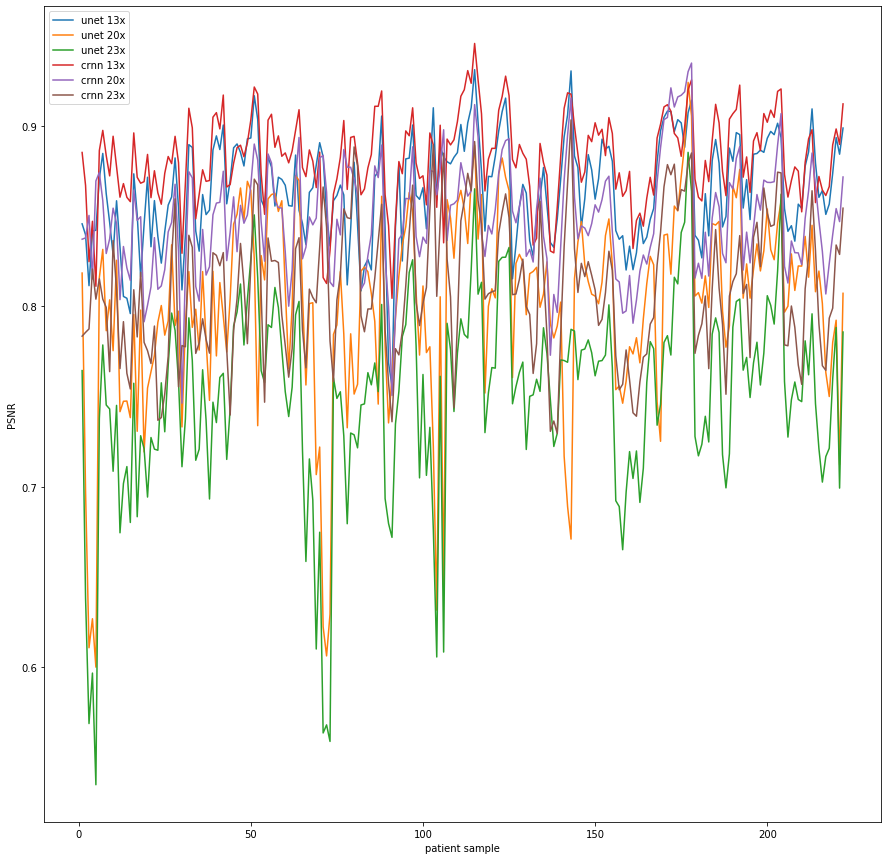

In [133]:
plt.figure(figsize=(15,15))
plt.plot(np.arange(222)+1, ssim_unet13, label='unet 13x')
plt.plot(np.arange(222)+1, ssim_unet20, label='unet 20x')
plt.plot(np.arange(222)+1, ssim_unet23, label='unet 23x')

plt.plot(np.arange(222)+1, ssim_crnn13, label='crnn 13x')
plt.plot(np.arange(222)+1, ssim_crnn20, label='crnn 20x')
plt.plot(np.arange(222)+1, ssim_crnn23, label='crnn 23x')

plt.legend()
plt.xlabel('patient sample')
plt.ylabel('PSNR')

Text(0, 0.5, 'SSIM')

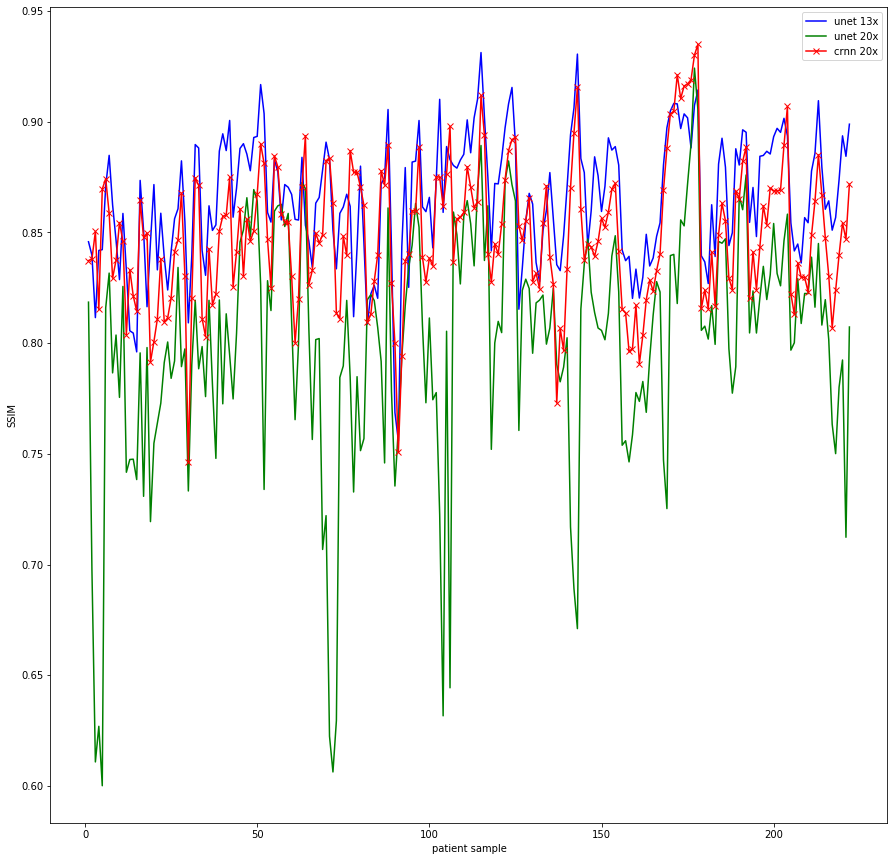

In [196]:
plt.figure(figsize=(15,15))
plt.plot(np.arange(222)+1, ssim_unet13, 'b', label='unet 13x')
plt.plot(np.arange(222)+1, ssim_unet20, 'g', label='unet 20x')
#plt.plot(np.arange(222)+1, ssim_unet23, label='unet 23x')

#plt.plot(np.arange(222)+1, ssim_crnn13, label='crnn 13x')
plt.plot(np.arange(222)+1, ssim_crnn20, 'rx-', label='crnn 20x')
#plt.plot(np.arange(222)+1, ssim_crnn23, label='crnn 23x')

plt.legend()
plt.xlabel('patient sample')
plt.ylabel('SSIM')

In [244]:
[ssim_crnn20[i] - ssim_unet13[i] for i in range(222)]

[-0.008511669999999971,
 -0.0017207799999999773,
 0.03892519999999999,
 -0.026625799999999922,
 0.02733439999999998,
 0.0032775999999999916,
 -0.026124500000000106,
 -0.03312674000000004,
 -0.00902079999999994,
 0.025780970000000014,
 -0.01257322999999999,
 -0.029184549999999976,
 0.027663349999999975,
 0.016792760000000073,
 0.01839637999999999,
 -0.009051860000000023,
 -0.0030640400000000456,
 0.03327785000000005,
 -0.05406670000000002,
 -0.07089073999999995,
 -0.02223520000000001,
 -0.02051830999999993,
 -0.02924389999999999,
 -0.012601430000000025,
 -0.021040660000000044,
 -0.014887250000000019,
 -0.014075899999999919,
 -0.014588460000000025,
 -0.02441663999999999,
 -0.06273686,
 -0.019140099999999993,
 -0.015012099999999973,
 -0.016893600000000064,
 -0.030725300000000066,
 -0.02769201999999993,
 -0.019351129999999994,
 -0.033510740000000094,
 -0.03134939999999997,
 -0.035906800000000016,
 -0.03725290000000003,
 -0.029259979999999963,
 -0.02562773000000007,
 -0.0314787299999999,
 -

In [ ]:
plt.imshow(test_truth[102,:,:,t,0], cmap='gray')
plt.show()
plt.imshow(recon1[102,:,:,t,0], cmap='gray')
plt.show()
plt.imshow(recon2[102,:,:,t,0], cmap='gray')
plt.show()

In [243]:
psnr_unet13 = [26.96755891343123, 26.145739842000314, 25.186271756506994, 25.571926383731647, 25.061729522072845, 28.749380911902495, 29.78778001166703, 27.992317225549947, 26.912505627114903, 22.729203097144463, 25.90004951362718, 24.626918281651946, 20.4113169984033, 20.49422049487393, 20.18887049056604, 26.99997560680916, 25.70481938494685, 23.314417738363154, 29.091323901429156, 29.799187838431322, 27.353503715429262, 30.01807232489302, 28.542979477191295, 24.657094130562246, 27.01722949720939, 28.79481222088064, 29.175314306476434, 30.207572367791585, 26.414107540895323, 27.54838289555454, 26.071281268746798, 27.1312604582517, 29.115192879533243, 28.57788829693277, 25.898284839485235, 28.27038472637876, 27.807244610850244, 26.38039435090614, 28.47559425389465, 29.417139237562488, 30.278161700499105, 30.079111176956484, 26.411923281826603, 26.652533185025572, 31.038058992660712, 30.57865409714223, 30.442251739698936, 26.495005300690536, 28.64983066843758, 27.613095912890866, 30.686674239630282, 29.018084146428684, 27.145353134278185, 27.837793603795735, 25.624126773488285, 25.25131733699227, 27.59587411403001, 28.83551489669491, 28.236524024548608, 28.178463428773988, 29.080977994426235, 28.669753167449937, 26.003269448946423, 23.044620092872613, 28.116028899035605, 28.37993737596414, 29.535593471928383, 30.208640592296216, 30.567124521818567, 31.47388636528043, 30.71749255026169, 27.707373889677495, 29.099679979748345, 29.16053542573158, 28.202826727760037, 28.88283900486589, 26.553465808050333, 25.175113646362743, 27.149498699646607, 29.069042184993396, 26.568726923731013, 23.55847435195, 23.592996075704907, 23.06787302093181, 20.768272235231528, 24.136382933217728, 24.59284042407764, 30.126423991261294, 27.86134596389245, 23.128792034456772, 21.236857238400862, 27.216651496386532, 30.537118886792296, 23.05272110113758, 30.094026560653106, 29.92406385169445, 29.683573530779654, 27.051814742843835, 26.40361090153915, 30.800243147744993, 26.683708752104668, 28.176738267393432, 30.842501245714335, 28.860958316368546, 28.910626215245422, 29.80398666075147, 28.860747054132794, 29.304278971156418, 29.327373634826767, 29.303102478196315, 27.560322280404648, 29.881740330822048, 30.179865841046116, 30.03849194884419, 30.04748418946299, 29.176188332871753, 28.21400777120714, 24.330000413101605, 29.013570574497827, 29.003077945414248, 28.830063984118624, 29.112081286539638, 31.69310506561548, 31.686669353354084, 26.467348723256368, 20.815793165011655, 24.774980242556605, 28.713218181392023, 29.27673508387602, 29.332080155180982, 25.561449302807297, 24.58772251756117, 26.211290642516804, 27.424362849997078, 28.733485399682074, 27.65892700570992, 27.780886747056638, 25.717551783176567, 26.60136876141172, 29.014221284454134, 28.191047245699206, 29.280954174710654, 28.833766657490038, 27.85603591058781, 28.849653368040492, 25.16898277724941, 24.606317367474322, 26.212101490184864, 24.889603197338715, 23.402139179895933, 23.305968060214934, 28.88090025187413, 27.52941824364383, 26.48388349548646, 28.552310125867013, 26.622259373610756, 25.90090328725294, 26.807286392066043, 23.322298246918646, 23.87090708453523, 27.293806280220036, 27.3367901435576, 28.137296006144375, 27.757412884191695, 25.894364173586705, 26.41951118215452, 27.560077364814504, 27.485524619935802, 28.793576192229494, 32.06941170584049, 32.03531919512467, 32.42062061214354, 28.072467217472973, 29.473842343534535, 27.46018989118801, 25.762198998393323, 24.624699310078668, 30.940907460631745, 26.676413476494513, 25.333446250665595, 24.426365800078884, 28.569575312242712, 27.347432916045214, 29.3986366265193, 30.069758006112586, 28.550433757428852, 28.397200920109544, 28.045878814047086, 29.071904188935584, 29.27786928955817, 29.786974793613695, 29.355298647491736, 28.062534788220137, 28.052835196757787, 27.95387445336604, 29.403845830164336, 29.629880385540055, 29.951482106649642, 28.242867157123158, 30.278745110494317, 28.86383849712996, 29.52724073319745, 28.143400697645127, 26.136635936912306, 28.406240455923573, 27.239886958590347, 26.511976324578164, 26.333958771467763, 29.072204522428358, 27.679006587053617, 29.600267398974985, 30.163684058448894, 31.945846999579032, 30.587846599731883, 28.90192086972018, 30.418925540394874, 27.05661391213988, 27.206413188562863, 26.560575265648374, 30.118790975027974, 28.600530781806746, 28.691064386501296]
psnr_unet20 = [24.437092761631103, 20.010385869824006, 18.428435783428952, 19.0211384012753, 17.87577748950023, 23.978057897892352, 24.315044772136694, 23.205648799269035, 25.89151939462239, 20.855233863996833, 25.822205806764146, 20.857948214311705, 19.044970254639754, 18.56387564598004, 17.922372213889652, 21.6475585867341, 20.700934543196308, 23.58037602618332, 23.34756823479771, 22.342380099178776, 23.707580836386047, 23.574839447347237, 27.113426722735305, 26.131757466943753, 26.599262441583665, 27.39539115701215, 28.46176461200178, 25.04907498617451, 25.547356003119482, 23.910830900842235, 24.794428185330823, 23.248918326378536, 21.66269058593061, 26.814944652900472, 24.96842930558143, 26.757764701512222, 24.43339363719052, 21.88940979794135, 27.084385324068847, 24.35645940502912, 25.957785462223065, 25.95176133010373, 23.684706823063273, 23.884234935041924, 25.82602247771863, 27.39558891285667, 28.88954550473422, 24.363215626422495, 27.878649645998202, 28.83073593603634, 27.434810585059743, 22.704724163838616, 28.580406904304073, 26.104204317362235, 25.849130044236837, 27.263158374040557, 28.55311582498957, 27.010457947092885, 27.557645380113506, 26.019858610214705, 26.22114355375944, 26.919460494252196, 27.093759330426405, 26.647892192790078, 25.851327172648023, 22.611443259118865, 24.39941735242457, 23.273610914981155, 19.848271898716973, 19.943002235804137, 17.825491284582423, 17.447230010004088, 18.684651053450786, 27.20318525871688, 26.325287528832337, 28.337622963811164, 21.721150596958488, 20.259358976099175, 21.518479128461163, 19.50440589692117, 19.399485518426292, 27.112552103014202, 27.05917724992558, 26.23560691113017, 22.74028346571783, 23.097352397703453, 22.46166598565076, 28.44437778700462, 25.664701118671793, 25.089066200733384, 24.561415572008446, 25.532886304478048, 24.14421550510211, 28.260988242512656, 29.055452930992082, 29.5276954529463, 27.558781307471804, 25.55563708639544, 24.061394927864196, 27.26967489077999, 23.41356656164995, 21.077066048629504, 18.64477133829233, 19.18180546398625, 22.56682419498532, 18.009578026394763, 25.790949010580277, 27.175995453563292, 26.7803918321232, 27.771369263858475, 26.573383200019816, 25.913189150852048, 23.177401979227106, 25.58804708174303, 27.88471507693534, 25.038198919698747, 25.921304313883514, 20.93649017849067, 24.581160207251852, 25.75785115500912, 25.016471914932122, 29.21225466939101, 29.511960743173933, 29.240421980769497, 29.039003921229067, 20.425311817013164, 27.65739045829565, 28.028058588462905, 25.305002923366974, 24.266730670817033, 26.862553387555124, 26.912005973595182, 23.53948933294014, 20.923128866065518, 24.28761341572506, 26.521509325124175, 25.192165770289773, 22.78255578667687, 24.16097898603389, 25.472369340498638, 23.162840438442604, 22.019623477132665, 22.725307474918388, 27.19213370957373, 26.960049618852498, 27.161742199840706, 25.328357627759114, 23.006003524300674, 21.236412091257357, 20.87453068463801, 20.813381105767164, 22.393196043700904, 24.51837266180366, 25.838743141666832, 26.714259579422105, 23.510593942359783, 23.912844789918985, 23.224794784006242, 23.51638924482942, 24.468532276019573, 25.43390421278271, 25.463007852111748, 23.93591086876226, 25.752840788877705, 26.25877358098601, 27.204017496301493, 25.73713808356731, 23.016109542980114, 21.808753530295924, 22.71495193701876, 22.774688279710098, 22.678332375569457, 26.74093424226304, 27.657822019427222, 29.306871466499405, 30.100505909048422, 30.315160926089597, 29.600552518320892, 26.162015925436073, 26.08279351312111, 26.36988082275832, 26.687477190805385, 25.382790877904814, 28.661981495302264, 28.488223274703813, 28.377048126068928, 23.965245866444455, 24.971559380849722, 22.49272982500461, 28.0493033046911, 27.738446414890962, 27.787587257956602, 25.90720603942261, 25.12518834635645, 26.14964307877712, 23.564661434850123, 24.542495347173954, 24.093515514213284, 23.40173484918345, 25.300154958182684, 27.681736918269667, 26.32433615969981, 28.463280742750232, 28.68671051921252, 26.564886284060314, 26.972438361492134, 27.58607478783552, 26.931973742410975, 27.257125453044743, 27.65519743584877, 27.94038471953931, 25.705486908125444, 25.919210316862042, 24.05585513594244, 24.77810711550352, 24.783346535055507, 24.51383117309256, 22.336936371472856, 25.1959632257833, 24.533666092669215, 19.33628180946986, 26.759499366772225]
psnr_unet23 = [23.260820612399165, 19.3004621402776, 18.022479371024442, 18.570996051227937, 17.456050543724942, 22.89970522869686, 23.15329028299417, 22.389494309620222, 24.610187507995676, 20.153950088786114, 24.098737943846437, 20.500597838589634, 18.959953047652384, 18.523763560382214, 17.897987168193204, 21.42409688716001, 20.37707227358784, 22.39395689739002, 22.896120078712887, 21.549433412846, 22.0349971873112, 21.833904159563794, 24.020745526255233, 25.419391153583987, 23.79808792635196, 25.703715768299297, 26.291643576172117, 25.220927114342487, 24.472602893378863, 23.533520985073046, 23.965785787223957, 22.80159947521207, 21.575407877337533, 24.26407254489809, 23.439156473330687, 24.982562121772865, 23.3081307321745, 21.388446150814648, 25.006685064259067, 23.265245455990843, 24.7612863695634, 25.045341536709454, 22.738490020594632, 22.5616086100667, 24.33687801689897, 25.502387045003367, 26.837125972724984, 23.340223293840303, 25.296740426457305, 26.507780550315818, 26.68102245093914, 23.14065823402583, 26.10196447868957, 24.55191578944073, 23.686084286816907, 25.036589000804245, 26.946072612327576, 25.948342251844387, 25.44391086999059, 24.120451385269973, 24.716570255147015, 25.46626249962009, 23.870296331949966, 23.956270179623328, 24.00329711640141, 21.25141166886973, 23.011968956152906, 21.810061091377218, 18.98133259074897, 19.388038124516452, 17.424287589955973, 17.133502395653455, 18.10998902498995, 26.23834345590141, 25.09596084778429, 26.359112691744947, 21.098489661910286, 19.75842040373586, 21.009553156096796, 19.18131227019289, 19.045204250242076, 24.787333338288278, 25.00528786578308, 24.229138302220402, 22.10918440758932, 22.47079226651072, 21.970610057643555, 25.26041761584562, 23.426291925570602, 22.95836765918038, 22.817461659680966, 23.93348440488787, 22.913365066579523, 26.524713028202733, 26.803425542062076, 27.692534660755534, 26.090267520326034, 24.746801592255473, 23.084016731132117, 26.148420097134498, 22.50228047885017, 20.670315671845383, 18.277710895897634, 18.728624169373425, 21.957181875365382, 17.674100033188545, 25.238765578963715, 24.964337065103244, 24.208066035215122, 25.50170307008289, 24.86965834187071, 24.00099832487339, 22.060423047967724, 23.930256278273596, 25.968175740619863, 24.82843153287474, 25.348991295249924, 20.810087009767038, 23.962557059379584, 24.793048454690428, 24.560760135765996, 27.623191826603396, 27.798686895378218, 27.460972896050453, 27.858994162073564, 20.413428549613286, 25.18413877550948, 26.218406169166553, 24.063189272407893, 22.785082262726437, 25.14782596146671, 24.93765154360568, 22.422104412170377, 20.245643794362586, 24.319120178863823, 25.710929212464084, 24.502359226902247, 22.360881133337713, 23.231603373164173, 25.07564827763482, 22.969754655086273, 22.09878290593183, 22.467850602500654, 25.63838906185243, 25.13073670552531, 25.303326700519058, 24.32808303699634, 22.815294323390145, 21.115153725065728, 20.854588983037736, 20.747225819975213, 22.233939321963746, 23.634198826002752, 25.881676694867288, 25.346873042162393, 22.642568364222818, 23.07632894533712, 21.905621802743685, 22.831151543515443, 23.485935865332564, 23.998670393228196, 23.878254139238827, 22.225394751780158, 24.322924563275887, 25.3006317258043, 25.633684244167927, 25.026825558829046, 22.997320505020607, 21.977637226979724, 21.767139522298024, 21.935346460258078, 21.84910185297257, 25.13947207404867, 26.46635475814013, 27.793135790011853, 27.941426005226088, 27.727266946821782, 28.1433507320828, 23.932267800555234, 23.819977492053663, 24.464545109425607, 24.463969939641395, 24.2055977426694, 26.55337595659926, 26.41555619719095, 26.515062300041546, 22.754383287805396, 22.830692033249402, 21.452247890647914, 25.257690634753992, 25.58383031090751, 25.582891938177106, 24.4535500346702, 23.45297120124037, 23.068968196764377, 21.81416731247637, 23.486932559884316, 23.040740293632382, 22.463092900963574, 24.13974437224737, 26.35504619737224, 25.696998105124248, 27.445740641412222, 27.442715905294826, 25.036905842535823, 24.405673385354945, 25.59268424739421, 25.27402301693258, 25.171908453184244, 25.29202732214679, 25.803638836174393, 24.477580474947437, 24.68669473854102, 22.94377271978353, 22.787163528409877, 22.80931171550968, 23.769122359713354, 22.169708499892902, 24.870449255220645, 24.530035215266395, 19.536103235804415, 25.980486581614066]

psnr_crnn13 = [31.341886161014266, 31.26156272280245, 27.96549179676456, 28.29656678550635, 26.421939618899906, 31.881810384869944, 31.58659469377651, 31.04207172179394, 29.732657583092653, 32.16913403825181, 27.028463418843877, 28.201451733542598, 26.835166222412617, 25.85715192505622, 24.30547418588544, 29.5430029736832, 28.556144946965425, 31.423274930726013, 30.66424428717541, 31.19568768439687, 30.885846946379154, 31.171809348569646, 30.65639702106244, 30.19688290966173, 30.83854334832987, 30.786024046469684, 29.246109928669064, 30.711303057510293, 28.181948614841495, 27.58202938205244, 29.27961162350926, 31.429476035855707, 29.73449856004806, 28.454709561474544, 28.9075348428818, 28.347948620250868, 29.52095312541279, 29.043192077433368, 29.751419240736432, 30.269028580875318, 30.224222943253874, 30.653793752980135, 28.649518950709343, 28.829568378759696, 29.435946259954665, 31.36580130886589, 31.557500915520496, 30.53529218013651, 30.747397107665854, 31.410930738929704, 32.330065920355246, 31.974676308510094, 28.22164861044334, 29.40552517852335, 29.025363332929988, 30.917682368243437, 27.67573636229986, 29.8873385060945, 29.82301968002555, 30.272887921325548, 30.929179870639484, 31.02061035606031, 31.973646467974067, 31.445596020155797, 30.659630817404366, 31.74559287603197, 31.82578832724811, 31.13531541379813, 30.119321426131194, 31.496918095375502, 27.84456777743987, 26.824166892684342, 29.55792168430194, 30.83813243192833, 32.28969969166353, 31.056746486461424, 34.44295817457015, 32.34748707944322, 33.03490869992121, 29.31739167251165, 28.563105573304437, 29.586301363049365, 29.556073873821155, 29.523650858476863, 30.534425565674205, 30.52712780555794, 31.448821450423413, 32.51842131188872, 28.91604769803996, 28.516821839895595, 27.467560308127275, 27.903383827723598, 29.800785098999746, 30.075108230271194, 31.523022063724266, 30.918691369841003, 30.68949674573194, 28.983917793019337, 29.765916642314313, 31.570929658280953, 32.13713109014169, 32.06832677615499, 30.414061265057388, 29.468995728886576, 33.63117557179855, 28.349764353883057, 29.564897824923058, 29.005086311266705, 30.660666754250066, 31.2429931689618, 29.627301473131894, 31.713280895634693, 32.05497095321813, 31.29283581976202, 33.33572132159706, 30.823247492577867, 30.584066815393122, 26.249106603374265, 29.847417546414498, 30.475949038439666, 30.08197330937953, 32.999381246412284, 32.735040685182696, 34.05117071884432, 31.957147379053037, 27.118946632632948, 29.777293217243106, 31.379232195387157, 28.18882935694045, 30.374020176665322, 29.77113953759429, 27.84873620453855, 28.085248551885, 29.872298280201285, 27.83866561631885, 29.26195216531943, 27.354367572494557, 26.640783295687573, 28.593539026944473, 29.401358618962433, 30.999510573723597, 31.664739053341595, 30.544378342109304, 30.47834269721729, 29.8990326014914, 28.595164979016722, 27.851665448331413, 28.34992341066763, 29.01355274687673, 29.658931845453065, 29.813345828297706, 29.75578666043001, 30.913166039441695, 32.581369230070436, 31.323840546103394, 28.56030070528841, 29.051030628603126, 27.971194027155253, 27.19538859748805, 28.5888934264538, 28.009699821636712, 29.70917954028322, 29.903536299959523, 29.598473944315487, 29.570850839635472, 29.862760280183277, 29.956439538139183, 30.873868071213728, 30.39235242081778, 33.13369753986195, 31.56164330118549, 31.27331031863323, 31.41841158715794, 31.435723509367655, 31.051681407064514, 31.93208685285206, 30.66039455367307, 31.446298847735108, 28.854114297468264, 27.39455372071443, 28.60719859118464, 29.68925339041736, 29.89401982815476, 30.576640470706735, 32.00920720995181, 31.097129285604456, 30.84211190254994, 27.399639020963036, 31.183546548678425, 30.817045588905223, 28.94707942501899, 32.65872092764411, 29.978922677174005, 30.04456093293992, 28.15085989847963, 31.47236294450638, 31.40775658080978, 31.080929745483928, 31.40659368918272, 29.692725843973896, 29.819671334528937, 30.527616138976907, 31.082824651318184, 31.436160751868602, 29.340338967449934, 29.563128822538204, 30.399768638175566, 30.243551489440783, 30.707707804342597, 26.215582039456432, 31.027068038337507, 32.10196649063019, 30.16380111212523, 29.41074805111731, 30.78511754661408, 29.863036700187383, 29.172673749561902, 29.57379186002991, 28.705319878103502, 30.868610321576362, 30.573286411629017, 30.66474448864267]
psnr_crnn20 = [28.76502649943555, 30.09135634582242, 31.29337252287153, 26.564103006770303, 28.069197342147476, 30.920081095512735, 28.260629821256266, 27.278340864680633, 26.59318086992975, 30.652980090266503, 26.036316399657608, 25.840002656735937, 26.59163773616217, 27.294598176039226, 23.749440330971318, 28.746646108155762, 28.051155996881, 29.568845874135924, 27.14192574924965, 28.275025544746445, 28.062363798592003, 29.551378192510754, 27.64603938233605, 28.44560478217921, 28.9314834663211, 29.25191306300053, 29.122827542830187, 29.33330343764822, 27.28483500609634, 25.041695183501407, 27.102121225353, 28.976438786452, 29.058216418072675, 26.968217753741737, 26.126983352222446, 27.63163758156229, 27.27889360915688, 26.267943660321407, 25.708445204604253, 27.987443480437967, 27.895811482751725, 28.362085082435765, 26.512356924804898, 28.3468445083327, 29.00738129347092, 24.820984308418673, 29.18461860713736, 28.406741608678722, 28.51052287867845, 29.001080760724363, 30.42019288950428, 30.35597111324381, 27.40832571025489, 27.726037494927386, 27.432678165777116, 27.88677468364596, 27.700726110456948, 28.927795289560606, 27.716212182237797, 28.273212111683335, 27.31143895043947, 26.977426728858074, 29.038510490073968, 28.866571284784385, 28.02066477477539, 27.95180214483309, 30.144152591593194, 29.222726825963804, 28.531514708780527, 30.913457504917044, 30.433198995243213, 27.902423898700953, 29.374588377118336, 27.865168961903628, 31.306786159454322, 30.447146522111144, 32.97433553732062, 33.55285686052586, 31.064392247350344, 32.86019426079075, 29.02356283689151, 26.613659066993968, 26.62685001445032, 26.15206700801543, 26.567294493128635, 28.38223629528137, 28.496770925396373, 29.590403220007023, 27.94023407662296, 26.646146707350688, 25.599958879648177, 26.89468381275783, 26.382226633633348, 28.726428776837054, 29.629565485328317, 28.344318871038872, 29.833154546503305, 27.373935149392736, 24.940166274856534, 30.05132378281582, 29.690078428161844, 29.96944712754098, 33.60298259525479, 29.1182622533334, 31.67705579093886, 32.44180518050844, 29.297325169275872, 29.227022759534623, 29.020316357074933, 28.72678705422325, 25.64448183586858, 28.441862980928782, 29.14553198767722, 30.038445726496455, 30.300504115302555, 29.89004773570526, 29.5894879874759, 26.53812439686693, 28.030407288735283, 28.503051406629965, 29.214639573644064, 31.048569831607107, 30.881158115399643, 30.85719393636311, 31.34378240615793, 26.918982811652096, 28.37863401318221, 28.562866197060533, 27.433795041606185, 25.822084262353723, 27.780960901838675, 27.25039528141658, 28.95958176037388, 28.50739133077754, 27.173794040237112, 27.63917863900686, 25.896821387503827, 26.99548919445358, 26.566344612764176, 28.105034825400832, 28.82453032815203, 29.809322820130358, 28.11524930985603, 28.30999296570123, 27.367535511715754, 27.575923339242525, 26.86157958498895, 25.7645822030403, 25.991011512687045, 27.30289714041914, 27.90734342022259, 26.923587338717333, 28.975101357319353, 29.983625156092348, 28.50090431734739, 26.549385595874366, 26.598388717534778, 25.73953663339998, 25.10886634401019, 27.049037300388346, 26.856738051680622, 27.9137110610609, 28.159603624767236, 28.431174595490454, 26.96137865353138, 26.240708974437815, 27.948417561066712, 28.79093765702158, 28.969518786697126, 30.32004520075815, 30.661642374356756, 30.64960246232493, 31.580641049315084, 32.130257629067, 32.33282550501307, 31.285765628444164, 32.97926533578979, 30.541688176687092, 26.82898113446182, 26.7459141595589, 27.294492821767324, 28.00013478351226, 26.819710251298375, 29.173628294829093, 29.11533788749358, 29.249542015944478, 28.683843067558364, 27.919171273836298, 29.405361112362662, 29.24747149588945, 27.778210306464935, 30.336033136991553, 27.263060120649488, 28.654011547915957, 27.100853671907448, 28.008983703715842, 30.09167215208881, 29.809145317391266, 30.87220482671787, 28.933212307646038, 27.42882437703174, 29.275068523946135, 29.777202915803667, 31.879328139398734, 27.9847158094686, 27.433021323786893, 28.372874573774556, 28.56712035241504, 28.821084206668484, 27.989865426693463, 29.03660048949547, 29.265865598878076, 29.63524244981968, 29.246277169255713, 29.452152924150134, 27.78032784989872, 26.773048220616488, 27.711435231292192, 26.57629353692631, 27.40304726973194, 29.094239580710433, 27.278351987408094]
psnr_crnn23 = [27.9345483287728, 29.04884946295615, 29.251175588980686, 30.05315180548942, 28.568218890425413, 29.330926259274975, 28.338915738340756, 28.680829013428173, 24.110821380940543, 29.89616535488234, 26.284878832174883, 25.613315924161174, 23.271023045239332, 22.768031610477486, 23.467233684561315, 26.188981447698335, 26.377840472245502, 29.171159674988672, 27.148700020004394, 27.51832713194026, 27.16976744846189, 28.118158303809075, 23.880451443200492, 24.007525577591466, 23.611728062817875, 25.942073027689283, 28.530412003452277, 29.560371556547672, 22.488919957712742, 26.565097534606156, 25.31712276480743, 26.151188792092363, 26.214645178993, 26.528971392689034, 26.050938494781867, 27.010057831913553, 25.511871513065394, 25.18859355906198, 27.847700581331054, 27.55671412964615, 27.09063472528616, 27.7125110479537, 25.93102770890146, 23.37789655249362, 24.632660640596534, 25.837154513646446, 28.3803397023806, 24.571197847230792, 24.940690842270932, 26.429823452665524, 29.393916087401088, 28.220442995986154, 28.261623240813083, 25.17470107146143, 27.067509315161924, 26.85361166076383, 28.609835520635944, 27.697418219586268, 26.6287952350667, 27.244062848381567, 26.086059739139188, 26.067851227965953, 27.10534306096049, 25.433036304919803, 26.396067237501434, 27.782891736957794, 28.30229024033101, 28.683186432301977, 28.18909123516413, 30.261634785522023, 30.74402629388238, 28.0462474941203, 28.500752281270444, 27.169759871648672, 29.395330427429553, 28.479404407824312, 31.39049531220723, 32.12926073520491, 32.38147976129203, 33.75105381742382, 30.765067094786296, 27.268746901827107, 26.611407799546903, 25.048493455796105, 22.47757500511161, 22.038212317683293, 25.47736606172305, 27.43539422876547, 25.397488127312577, 25.657648122040065, 24.009025770646296, 27.722020691495857, 25.437741194302454, 27.027939652794288, 28.263054334315093, 28.797476701022013, 28.651059174632245, 24.974594378501894, 24.870477659591526, 28.9422414051937, 29.668517894000292, 32.34518329315385, 34.015799240328406, 29.556555318998612, 30.73681480226968, 33.941495011895135, 25.90791832404286, 25.055328539222504, 23.772448666816825, 26.070606703248718, 28.655079093564694, 30.08766933800054, 30.014008621517377, 28.90510067395611, 29.861295309446668, 25.42702601671083, 26.37558395419324, 26.084605084631402, 26.73152715791712, 25.38244866235157, 25.09312337988417, 29.444054057627977, 30.143517922403884, 30.563786373730995, 28.774611461072304, 24.29156721500974, 26.67924431063897, 27.910688647307474, 27.155249086857292, 26.108411486157955, 26.841450561347052, 26.251478270743263, 25.833103635363592, 28.098601878493533, 27.334659343648713, 26.330365118923773, 24.02513818614855, 23.5035730020695, 22.961326159966823, 26.14926587445703, 27.74218953043384, 28.340720376082793, 28.641583354241753, 26.904364099374117, 26.248990043318535, 26.248457082724304, 26.366621509032733, 23.929117980877233, 23.712587161390996, 22.838159994328237, 24.565151408100114, 24.232254979545452, 26.270504124936206, 27.877339859022175, 26.454946610741615, 25.532791096721258, 24.481512479709462, 24.726543118965516, 24.624599544306754, 24.734101620497746, 25.18241714439568, 25.446937368421196, 27.10574610040693, 27.09934465080392, 26.80714575759862, 26.54597037738528, 27.464382271936234, 27.94761837304025, 29.060862305904458, 30.642641794276365, 30.203485543009144, 30.430483304278404, 30.355585729526855, 29.617036519680056, 30.211120738166716, 30.14255592440519, 29.20334595094635, 28.741592561549833, 25.61547712826829, 25.943886983626392, 26.102743441212624, 27.656172622571564, 25.089103784866214, 26.979039082634632, 28.454156249014176, 26.88166751141059, 27.259557418609774, 26.347113424428507, 28.115438048885967, 28.010154155910943, 27.06433667825428, 27.865683738804556, 26.874639566761992, 27.765717626917215, 24.236612800995733, 28.736133473497574, 30.005899529172684, 28.859521622526067, 30.816280685398358, 29.104357210297156, 29.2061194842229, 28.013659721240334, 30.23204236513174, 29.882100714050654, 25.667564899693218, 25.79521211558943, 27.510521137749453, 27.49485513604613, 26.833204628156658, 25.908135871276578, 27.49353961557024, 27.336957176153202, 30.432912787773613, 28.76587476807105, 27.52427441952691, 26.601731778247235, 25.17632426312773, 25.905603663034093, 24.32289553588763, 27.73677021803733, 27.44367044521033, 28.153513559500844]

Text(0, 0.5, 'PSNR')

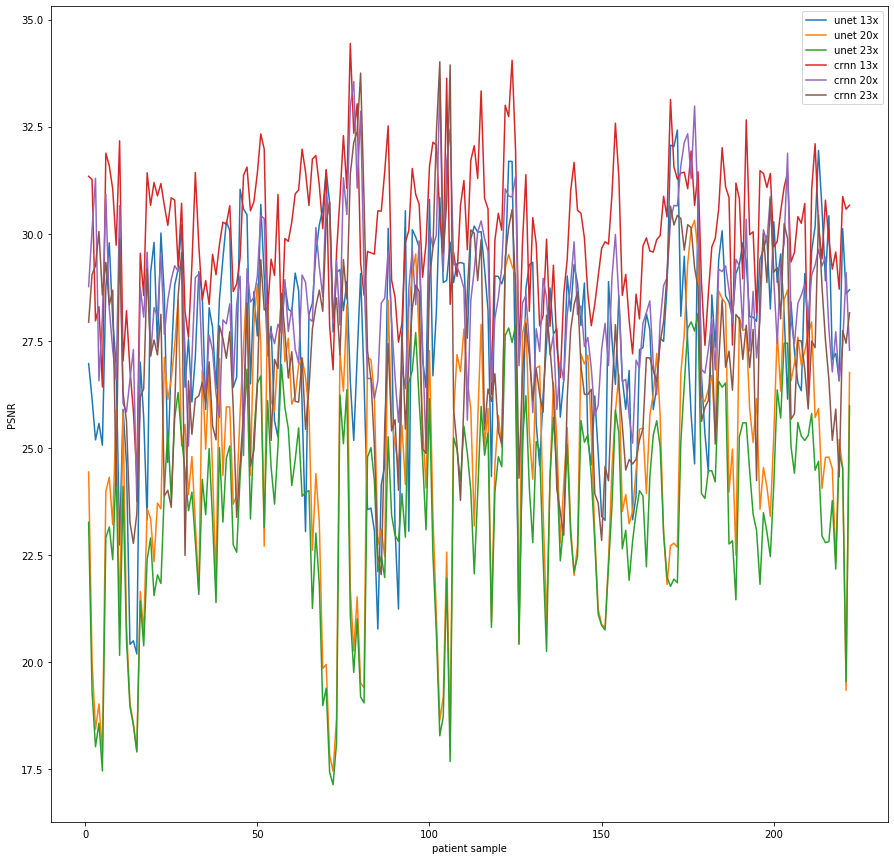

In [132]:
plt.figure(figsize=(15,15))
plt.plot(np.arange(222)+1, psnr_unet13, label='unet 13x')
plt.plot(np.arange(222)+1, psnr_unet20, label='unet 20x')
plt.plot(np.arange(222)+1, psnr_unet23, label='unet 23x')

plt.plot(np.arange(222)+1, psnr_crnn13, label='crnn 13x')
plt.plot(np.arange(222)+1, psnr_crnn20, label='crnn 20x')
plt.plot(np.arange(222)+1, psnr_crnn23, label='crnn 23x')

plt.legend()
plt.xlabel('patient sample')
plt.ylabel('PSNR')

Text(0, 0.5, 'PSNR')

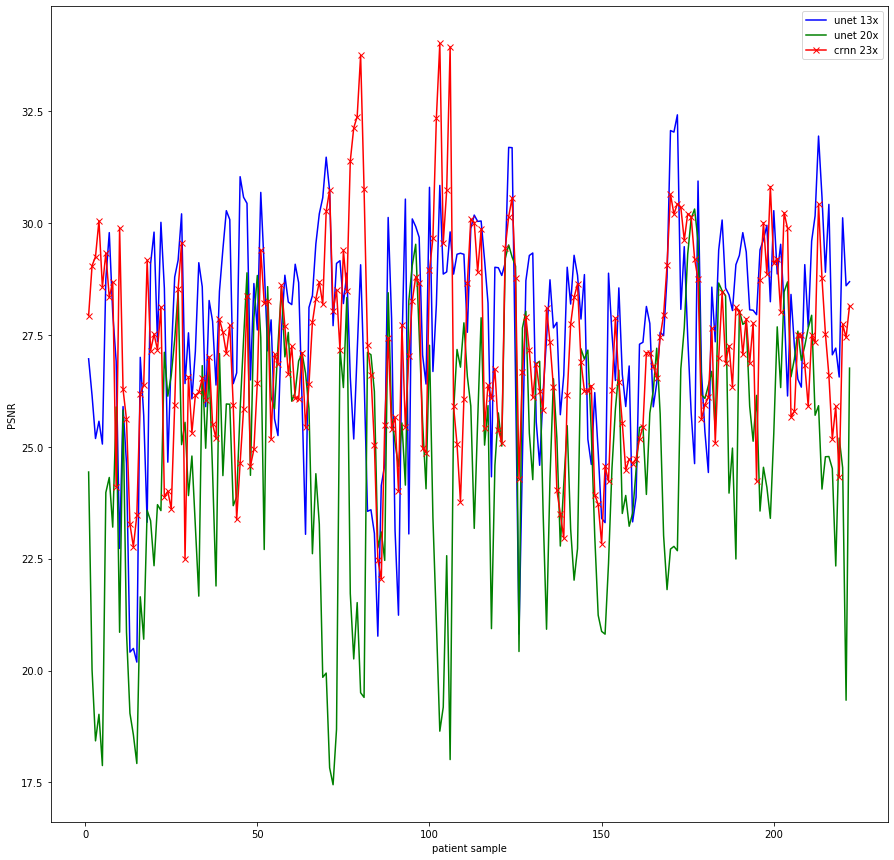

In [204]:
plt.figure(figsize=(15,15))
plt.plot(np.arange(222)+1, psnr_unet13, 'b', label='unet 13x')
plt.plot(np.arange(222)+1, psnr_unet20 , 'g' ,label='unet 20x')
#plt.plot(np.arange(222)+1, psnr_unet23  ,label='unet 23x')

#plt.plot(np.arange(222)+1, psnr_crnn13, label='crnn 13x')
#plt.plot(np.arange(222)+1, psnr_crnn20, label='crnn 20x')
plt.plot(np.arange(222)+1, psnr_crnn23, 'rx-', label='crnn 23x')

plt.legend()
plt.xlabel('patient sample')
plt.ylabel('PSNR')

In [172]:
mse_unet13 = [0.004724059568144439, 0.011779083872425461, 0.015917944521641792, 0.013996672033429433, 0.017993942576311348, 0.005149869041377491, 0.004853903265057495, 0.005796038956325268, 0.0034651347816400746, 0.009689832389000844, 0.003920133368684799, 0.008956308693987693, 0.012782935559015962, 0.014115980771295661, 0.016320624425875962, 0.007253150478533711, 0.00919727738262426, 0.005834541398251745, 0.005141610729515659, 0.0070200025672837564, 0.00627270730298983, 0.006590952028248153, 0.0039769559693101945, 0.002876442519183277, 0.004171521536895393, 0.002700254532532846, 0.0023508351005646954, 0.003007843063614491, 0.0035873526540279297, 0.004471976519955696, 0.004037827682366801, 0.00527549463233825, 0.007011753501186898, 0.003760332454401517, 0.004536144216000482, 0.0031805509058010504, 0.004680081610574218, 0.007314684267296255, 0.0031655351820222633, 0.004727563312338185, 0.0033462196722452084, 0.0031301195939976733, 0.0053274227786459395, 0.005562877542324438, 0.0036997451635717056, 0.002823790404828049, 0.002073451180471083, 0.0046499441709208595, 0.002959347513160817, 0.0022426974419532475, 0.0021540783243614568, 0.004868733294041424, 0.0024772081448272403, 0.003527232600026746, 0.004281385346578538, 0.0031369031747771415, 0.0020226908685325724, 0.0025434186184842087, 0.0028594839799859434, 0.003877839860943387, 0.0033871663398809086, 0.0028473664752008384, 0.0041079167068778805, 0.00402247196177411, 0.003995634438368622, 0.007541180771597598, 0.0050398159165015175, 0.00664983577274372, 0.012780405548207679, 0.011597148612339046, 0.01824848923051512, 0.019444704824817558, 0.015470656290529294, 0.002383563475978276, 0.0031010673018765657, 0.0023239829667819046, 0.0077731400550271335, 0.010591504255755672, 0.007932037534266766, 0.012081575962717958, 0.01247854317940237, 0.0033479081328261578, 0.003161283935754254, 0.003786515075692985, 0.006200723284410564, 0.005684785041003428, 0.006356948745426841, 0.0029814249467664438, 0.004560012611410804, 0.0050637654284525335, 0.00523239752009679, 0.00404948958089628, 0.005117509963897917, 0.002230653938179389, 0.0020901975388913216, 0.0017047930692058826, 0.0024630534188415246, 0.003356147811522974, 0.004919498860525354, 0.0024298436551559725, 0.005638045855885587, 0.008609682333991776, 0.014976735732860527, 0.013420435521383852, 0.006406466725141833, 0.017107805723467713, 0.0030494915332805474, 0.0032081651259956135, 0.0038124903306327915, 0.0028265483397686363, 0.0032913432171017406, 0.003999033132040156, 0.006235109576184582, 0.004076667290635358, 0.0025329306592771867, 0.0033515801617336055, 0.0029596487834059665, 0.00832486201841696, 0.00402039151832003, 0.003324768876936602, 0.003505468067475763, 0.0017306340914496523, 0.0016659904219990477, 0.0017990419300277824, 0.0016385897961187842, 0.00915179355724587, 0.0030466887718460004, 0.0023947267184346436, 0.003937396908285253, 0.005291285290656504, 0.0030641825171841045, 0.0032174222624303896, 0.005789405204549611, 0.009511893723650794, 0.003719441824229646, 0.0027008877325236146, 0.0035545526824558955, 0.005818686944322829, 0.0047582385190594895, 0.0031135943041539125, 0.0050543044219121145, 0.006180648728420799, 0.005673865988499604, 0.0027423985070443553, 0.00307939257902304, 0.0029548984490186535, 0.0036973634643529944, 0.00524409770830133, 0.007761089457725292, 0.00824273481373745, 0.008461171740686727, 0.006010915741884935, 0.004389027156675526, 0.0026506873406236973, 0.002931677519209148, 0.005449387970484736, 0.0049370636630406365, 0.006460312104107596, 0.0052146742941741415, 0.004505210484819055, 0.003997761555253251, 0.004108184076940272, 0.006010038883519557, 0.003710306300848424, 0.002956486434121534, 0.002748873821093791, 0.0031651538448420175, 0.005042842015806171, 0.006367539088072138, 0.006672808702271334, 0.006411356596278457, 0.006536849813789082, 0.003065051860033958, 0.0022577770161362537, 0.0016657165275439205, 0.001608621910697821, 0.0016933589529489128, 0.0015367487923503534, 0.004047292690171541, 0.004152585120118472, 0.003588363293094673, 0.0035860262212558036, 0.0038021757568960923, 0.0022174192293660834, 0.0022850715548755306, 0.0022368367767148867, 0.0053305094170064335, 0.0052371905276413395, 0.007243727480717896, 0.0030052186511917633, 0.0027701703470335345, 0.002799251182480208, 0.0035954658333441436, 0.004522130096465456, 0.0049385650486342605, 0.00659126862829283, 0.004485327662952714, 0.004978128946947302, 0.005690454461417782, 0.00386554197254012, 0.002318461858658983, 0.002696221145986668, 0.0018036747824309754, 0.0018051343495313625, 0.0031439071265328246, 0.003631949076495466, 0.002761790375784176, 0.0029712091738789714, 0.0030561292459949643, 0.0029654768952892467, 0.002631141442317509, 0.0035726687270212, 0.003415399738926962, 0.005089650216976928, 0.005299413202459627, 0.005271533537745938, 0.004205543215307494, 0.006071719932024771, 0.003259416857528709, 0.0035261652689496624, 0.011134765187459922, 0.002525198656646288]
mse_unet20 = [0.003603693259603316, 0.010005510757559071, 0.014449543194654158, 0.012583509032994298, 0.016345718192360192, 0.004005648685821839, 0.0037063258651876584, 0.004787761652781443, 0.002587681135579061, 0.008225267209812776, 0.002621165868436752, 0.008242129534522257, 0.012507884142180015, 0.013987528067636212, 0.01620025250093679, 0.006860013956484325, 0.00851081703077813, 0.004408984173940299, 0.004636841637624226, 0.005838211545042377, 0.004262620308659828, 0.0043944704481691695, 0.0019490178363557333, 0.002444058827761849, 0.0022080203572248627, 0.001823351082392597, 0.0014269417132762709, 0.003128214797042835, 0.0028041558781572917, 0.004079955377713441, 0.0033316634222352185, 0.004748275504442072, 0.006827080367781485, 0.0020852050145581677, 0.003195032865495828, 0.00211335535170292, 0.0036298232225071723, 0.006541248092408641, 0.001960568318357908, 0.0036802236998228653, 0.0025419359575209193, 0.002541006232012881, 0.0042895880899149735, 0.004092572320286984, 0.0026167203620861383, 0.0018228492017097764, 0.0012924614362393757, 0.0037012057886534576, 0.001645317136010573, 0.0013142596960073524, 0.0018104947981388373, 0.005368652828088387, 0.0014070115321228329, 0.0024667821472499967, 0.0026077539016689075, 0.0018839017064212528, 0.0013968512338502685, 0.00199219396516975, 0.0017611378753823418, 0.0025053840286651924, 0.0023940643126682316, 0.0020380297617688626, 0.001954409203910164, 0.002166721030254677, 0.002608075343129232, 0.005490608058250955, 0.003637764340985451, 0.00471735652847432, 0.010387914064527064, 0.010159602588900824, 0.01653495941143643, 0.018017017723108816, 0.013546873538792161, 0.001911364747209565, 0.002332181882543146, 0.0014770147979556386, 0.006739449415796188, 0.009442057252407283, 0.007061824377084502, 0.011230603964096836, 0.011488023468174562, 0.001948597355049493, 0.0019754610321768393, 0.002386091660272498, 0.005347069980791627, 0.004907080497870347, 0.005679785686837173, 0.0014324007606118867, 0.0027184773236256796, 0.003100984623648978, 0.003504839393596658, 0.002800373281659626, 0.0038552291951364005, 0.001495618546524771, 0.001246864230633904, 0.0011183598896779886, 0.0017577632666108075, 0.0027867786650506475, 0.0039273968112132265, 0.0018774187614952066, 0.00456924460353312, 0.007814485121106465, 0.013711282341265691, 0.012076960440525922, 0.005549641263573815, 0.01582939841586716, 0.0026385306492264673, 0.0019202519650049377, 0.002104941442034292, 0.0016753118083637406, 0.0022033923106326617, 0.0025693186762857003, 0.0048333320865861385, 0.002764246734139807, 0.00162940986982331, 0.003165820875441796, 0.002559093218831154, 0.008074027654791477, 0.003484378759103975, 0.002660695786549331, 0.0031517692486446335, 0.001201073748662992, 0.001121115434215681, 0.0011920479688598963, 0.0012491068856560065, 0.009114123957188941, 0.0017288921977905488, 0.0015789182104995823, 0.002952803921337844, 0.0037491430607179805, 0.0020627226298703632, 0.0020385632430294396, 0.004448359863589784, 0.008102303682951829, 0.00373943420136178, 0.002245033681633616, 0.00303658515548586, 0.005283672090138357, 0.003845126261197125, 0.0028383706058928097, 0.00483650510913754, 0.006289341908710526, 0.0053419193081081, 0.001914398674986569, 0.002020374868329545, 0.0019289555793105284, 0.0029361197692945097, 0.005007146371904849, 0.007525367047363439, 0.008178926604897248, 0.008293838486060055, 0.005764568978714877, 0.0035346852853629872, 0.002610967963250291, 0.0021327131588687515, 0.004458924568111805, 0.00406846064595042, 0.004773501213941656, 0.004453957767062154, 0.003584559288547259, 0.0028744210238354417, 0.002846350447922083, 0.004044824410195787, 0.0026609106130722577, 0.0023683711271885186, 0.0019072685223596613, 0.0026726029971495214, 0.004995739237364043, 0.006606080357980974, 0.00535616967988715, 0.00528160438033783, 0.0053991095694160985, 0.0021191192701619935, 0.0017159336429222727, 0.0011762938084468352, 0.0009775036799487859, 0.0009324822817933052, 0.0010974451423961503, 0.0024263948347473872, 0.002471235151476379, 0.002309847885796741, 0.0021453641832769126, 0.0029033257396420776, 0.001364343781285329, 0.001419709167820715, 0.0014578474263523269, 0.004018214311506944, 0.0031860946742242728, 0.005640252004850436, 0.001568186596694983, 0.0016844575216019484, 0.0016665790394256989, 0.002569232006846363, 0.0030797955191943123, 0.002428730630272965, 0.004405159549018166, 0.0035214334888694757, 0.0039001741157398836, 0.0045737351123465286, 0.0029564207994002335, 0.0017065361212361984, 0.0023338839793811, 0.0014261482009138079, 0.00135432970083826, 0.0022086918119648014, 0.002011930105125073, 0.0017477174954569866, 0.0020304356598266375, 0.0018857377618664802, 0.001730881173584778, 0.0016098907217771776, 0.002691074091768943, 0.002564029534633667, 0.00393516411473035, 0.0033348910442774033, 0.0033338623204123147, 0.003543688381930828, 0.005846866443375963, 0.0030244952068178422, 0.003524164979746684, 0.01165643527901749, 0.00210926765153741]
mse_unet23 = [0.004724059568144439, 0.011779083872425461, 0.015917944521641792, 0.013996672033429433, 0.017993942576311348, 0.005149869041377491, 0.004853903265057495, 0.005796038956325268, 0.0034651347816400746, 0.009689832389000844, 0.003920133368684799, 0.008956308693987693, 0.012782935559015962, 0.014115980771295661, 0.016320624425875962, 0.007253150478533711, 0.00919727738262426, 0.005834541398251745, 0.005141610729515659, 0.0070200025672837564, 0.00627270730298983, 0.006590952028248153, 0.0039769559693101945, 0.002876442519183277, 0.004171521536895393, 0.002700254532532846, 0.0023508351005646954, 0.003007843063614491, 0.0035873526540279297, 0.004471976519955696, 0.004037827682366801, 0.00527549463233825, 0.007011753501186898, 0.003760332454401517, 0.004536144216000482, 0.0031805509058010504, 0.004680081610574218, 0.007314684267296255, 0.0031655351820222633, 0.004727563312338185, 0.0033462196722452084, 0.0031301195939976733, 0.0053274227786459395, 0.005562877542324438, 0.0036997451635717056, 0.002823790404828049, 0.002073451180471083, 0.0046499441709208595, 0.002959347513160817, 0.0022426974419532475, 0.0021540783243614568, 0.004868733294041424, 0.0024772081448272403, 0.003527232600026746, 0.004281385346578538, 0.0031369031747771415, 0.0020226908685325724, 0.0025434186184842087, 0.0028594839799859434, 0.003877839860943387, 0.0033871663398809086, 0.0028473664752008384, 0.0041079167068778805, 0.00402247196177411, 0.003995634438368622, 0.007541180771597598, 0.0050398159165015175, 0.00664983577274372, 0.012780405548207679, 0.011597148612339046, 0.01824848923051512, 0.019444704824817558, 0.015470656290529294, 0.002383563475978276, 0.0031010673018765657, 0.0023239829667819046, 0.0077731400550271335, 0.010591504255755672, 0.007932037534266766, 0.012081575962717958, 0.01247854317940237, 0.0033479081328261578, 0.003161283935754254, 0.003786515075692985, 0.006200723284410564, 0.005684785041003428, 0.006356948745426841, 0.0029814249467664438, 0.004560012611410804, 0.0050637654284525335, 0.00523239752009679, 0.00404948958089628, 0.005117509963897917, 0.002230653938179389, 0.0020901975388913216, 0.0017047930692058826, 0.0024630534188415246, 0.003356147811522974, 0.004919498860525354, 0.0024298436551559725, 0.005638045855885587, 0.008609682333991776, 0.014976735732860527, 0.013420435521383852, 0.006406466725141833, 0.017107805723467713, 0.0030494915332805474, 0.0032081651259956135, 0.0038124903306327915, 0.0028265483397686363, 0.0032913432171017406, 0.003999033132040156, 0.006235109576184582, 0.004076667290635358, 0.0025329306592771867, 0.0033515801617336055, 0.0029596487834059665, 0.00832486201841696, 0.00402039151832003, 0.003324768876936602, 0.003505468067475763, 0.0017306340914496523, 0.0016659904219990477, 0.0017990419300277824, 0.0016385897961187842, 0.00915179355724587, 0.0030466887718460004, 0.0023947267184346436, 0.003937396908285253, 0.005291285290656504, 0.0030641825171841045, 0.0032174222624303896, 0.005789405204549611, 0.009511893723650794, 0.003719441824229646, 0.0027008877325236146, 0.0035545526824558955, 0.005818686944322829, 0.0047582385190594895, 0.0031135943041539125, 0.0050543044219121145, 0.006180648728420799, 0.005673865988499604, 0.0027423985070443553, 0.00307939257902304, 0.0029548984490186535, 0.0036973634643529944, 0.00524409770830133, 0.007761089457725292, 0.00824273481373745, 0.008461171740686727, 0.006010915741884935, 0.004389027156675526, 0.0026506873406236973, 0.002931677519209148, 0.005449387970484736, 0.0049370636630406365, 0.006460312104107596, 0.0052146742941741415, 0.004505210484819055, 0.003997761555253251, 0.004108184076940272, 0.006010038883519557, 0.003710306300848424, 0.002956486434121534, 0.002748873821093791, 0.0031651538448420175, 0.005042842015806171, 0.006367539088072138, 0.006672808702271334, 0.006411356596278457, 0.006536849813789082, 0.003065051860033958, 0.0022577770161362537, 0.0016657165275439205, 0.001608621910697821, 0.0016933589529489128, 0.0015367487923503534, 0.004047292690171541, 0.004152585120118472, 0.003588363293094673, 0.0035860262212558036, 0.0038021757568960923, 0.0022174192293660834, 0.0022850715548755306, 0.0022368367767148867, 0.0053305094170064335, 0.0052371905276413395, 0.007243727480717896, 0.0030052186511917633, 0.0027701703470335345, 0.002799251182480208, 0.0035954658333441436, 0.004522130096465456, 0.0049385650486342605, 0.00659126862829283, 0.004485327662952714, 0.004978128946947302, 0.005690454461417782, 0.00386554197254012, 0.002318461858658983, 0.002696221145986668, 0.0018036747824309754, 0.0018051343495313625, 0.0031439071265328246, 0.003631949076495466, 0.002761790375784176, 0.0029712091738789714, 0.0030561292459949643, 0.0029654768952892467, 0.002631141442317509, 0.0035726687270212, 0.003415399738926962, 0.005089650216976928, 0.005299413202459627, 0.005271533537745938, 0.004205543215307494, 0.006071719932024771, 0.003259416857528709, 0.0035261652689496624, 0.011134765187459922, 0.002525198656646288]

mse_crnn13 = [0.0007412131729217445, 0.0007520955308836509, 0.0016018825779296904, 0.0014829987923676582, 0.0022816782951697624, 0.0006512826962417801, 0.0006956447626391775, 0.0008002038832942745, 0.001081659106245476, 0.0006101717870212371, 0.0019857308563530625, 0.001545986655870645, 0.0021139181365708902, 0.0026311780834777994, 0.003744835609199194, 0.0011150693994232878, 0.001401586818328002, 0.0007348332982521708, 0.0008783908985511294, 0.0007819509210487876, 0.000845498429646625, 0.0007817735116561088, 0.0008722307588770413, 0.0009681127612876045, 0.0008297384403151567, 0.0008394643081339442, 0.0011948082578447645, 0.0008500034455419779, 0.001526243482319781, 0.001760103697293701, 0.0011819457311176714, 0.0007219197464964018, 0.001064891529971889, 0.0014326205380083721, 0.001289988513524068, 0.0014701058430069403, 0.0011261608965595317, 0.0012550739839723428, 0.0010611704816685242, 0.0009432870113128113, 0.0009533473041569018, 0.0008635579459040603, 0.0013730309729468762, 0.0013132816065485804, 0.0011430339781095037, 0.0007344250720368508, 0.0007047223592609832, 0.0008948549444619484, 0.0008490282130961047, 0.0007295453464161528, 0.0005894979932718859, 0.0006373354758950736, 0.0015106069210236545, 0.0011641895080503934, 0.0012548100270918148, 0.0008112943634698526, 0.001709569297545922, 0.0010306928661042985, 0.0010463020917207558, 0.0009427487122689916, 0.0008159016100548714, 0.0007958974461817873, 0.0006377642725256764, 0.0007200413178147768, 0.0008836059708556427, 0.0006793134976589266, 0.0006734520953964603, 0.0007779815670881303, 0.0009796732689422852, 0.0007105595118728065, 0.0016487568844900263, 0.0020894516989866637, 0.0011101494644081562, 0.0008393321583319291, 0.0005961767184196327, 0.0007915065373709448, 0.0003659144646907604, 0.0005913833538127162, 0.0005026136486397633, 0.001173089216733107, 0.0013937097832234086, 0.001103213790861094, 0.0011112822465904695, 0.0011188292015365912, 0.0008905493366127084, 0.0008882294648458556, 0.0007182887436031017, 0.000561483801485019, 0.0012929398497910775, 0.0014142625612615545, 0.0017992842243335105, 0.001622603749509371, 0.0010490643153435683, 0.0009862520063564255, 0.0007084295663792149, 0.0008109266966620987, 0.0008544866709466793, 0.0012746460310141638, 0.0010582728202611664, 0.0007092862339485009, 0.0006181936921678592, 0.0006250275611044978, 0.0009152170775249848, 0.0011349775359120204, 0.00044166941059952823, 0.001465956084035218, 0.0011100621914106644, 0.0012591845552623422, 0.0008599491049257387, 0.0007526276051264174, 0.0010923449512218893, 0.0006795700646263347, 0.0006244279970089929, 0.0007459816080678925, 0.0004644716358592815, 0.0008280854167014516, 0.0008759967733443289, 0.0023958744255880076, 0.0010543746040501446, 0.0009036044519496047, 0.0009980231694821293, 0.0005061960033541729, 0.0005357870501241438, 0.00039878080980139494, 0.0006398456053965524, 0.0019473755505512997, 0.0010563692254196605, 0.0007317104410706993, 0.0015225949817683792, 0.0009221518192987508, 0.001058364658021882, 0.001643639176326691, 0.001556666708596961, 0.0010427571866448875, 0.001661686209305314, 0.001196069740877007, 0.001842786361050338, 0.0021706524923111596, 0.0013888477816203473, 0.0011501434843986687, 0.0007971915416040663, 0.0006835227369530685, 0.000885037752135533, 0.0009059898197397578, 0.001026921732430175, 0.0013836246703810401, 0.0016411829411406126, 0.001464701457917661, 0.0012571215235214948, 0.0010838573735114554, 0.0010461852619303392, 0.0010585363542097903, 0.0008113422893912921, 0.0005532883494475617, 0.0007392289933819808, 0.0014006801330905961, 0.0012490262214101796, 0.0015984179746865665, 0.0019092500130980842, 0.0013867074429370677, 0.0015848653462940323, 0.0010743985685116374, 0.0010253095976899011, 0.0010990554534564753, 0.0011055110001777326, 0.0010350595661326675, 0.0010145090681773455, 0.0008203634178801497, 0.0009288489275777384, 0.0004872166732874603, 0.000700823351383303, 0.000747286486063857, 0.000722379668520703, 0.0007192082475164824, 0.0007871005996540944, 0.000643907046712944, 0.0008627748632509602, 0.0007191747019623539, 0.0013113027889008967, 0.0018287060561152813, 0.0013823074287014527, 0.0010799724773353275, 0.0010314522360061642, 0.0008788229859729102, 0.0006315043954394971, 0.0007792294212318671, 0.0008329876216115537, 0.001825001713096966, 0.00076276148370357, 0.0008297758752494274, 0.001277388073777246, 0.0005430325324817887, 0.0010137404452998384, 0.0009936651538460847, 0.001536198149168965, 0.0007141980834886, 0.0007243578526910477, 0.0007811178678874856, 0.0007249041417754002, 0.00107455486851046, 0.001044308650275138, 0.0008882334122168583, 0.0007823817710312658, 0.0007190898157346453, 0.0011679402235305022, 0.0011120191153381385, 0.0009199270378844454, 0.0009500990870125348, 0.0008557707959628335, 0.002422454544737806, 0.000802993613325501, 0.0006251964543788145, 0.0009695570972203295, 0.0011550169081728959, 0.000840152017429523, 0.0010367643952540518, 0.001222739479975507, 0.0011167679822980561, 0.0013512746534987993, 0.0008234899512793773, 0.0008812463367004784, 0.0008616089575328783]
mse_crnn20 = [0.0013347859692426204, 0.0009819758531089036, 0.0007461261493805357, 0.0022124159127374487, 0.0015650706577978088, 0.0008118539240563532, 0.0014941116923953292, 0.0018796701541363974, 0.0022018690059518882, 0.0008680573183547258, 0.002493237888800085, 0.0026444592350170666, 0.0022309233699468268, 0.0018877779385654873, 0.004249510223672556, 0.0013389042164868425, 0.0015693725164557626, 0.0011242107013550754, 0.0019446166206482731, 0.0015014703245992667, 0.0015833704566260106, 0.0011272741731693059, 0.001735536417822032, 0.001443581292262182, 0.0012886726128298596, 0.0011927788185079951, 0.0012266071750293487, 0.0011687480383723325, 0.0018782268584156589, 0.0031531627553876723, 0.001953257193753763, 0.0012713535276633228, 0.0012450755038815962, 0.002014948018080761, 0.0024445750543463786, 0.0017350230634106578, 0.0018793296453808253, 0.002371794158216194, 0.002692665703785159, 0.0015930446184522092, 0.0016286283964993685, 0.0014607724054562484, 0.0022487387089205695, 0.001468881768465095, 0.0012631387902747836, 0.003301344103596224, 0.0012126977914575, 0.0014563251296963733, 0.0014157873250124173, 0.0012622440051973148, 0.0009100551294995814, 0.0009238247744651597, 0.0018240980704188655, 0.0017191117672318251, 0.0018079551824527937, 0.0016301462262763738, 0.001701856813020347, 0.0012842711329422035, 0.0016978248004836081, 0.0014935878911047095, 0.001872678539827086, 0.0020188640979260488, 0.0012490185611403505, 0.0013023427503326096, 0.0015899098578971657, 0.0016081869336788297, 0.0009795168845837068, 0.0012030128366098173, 0.0014120008858877603, 0.0008136788586107781, 0.0009099150885968178, 0.0016297691222522293, 0.0011560177807222898, 0.0016426712196434626, 0.0007450965634362243, 0.000909077930604507, 0.000512948205527253, 0.000454264487735992, 0.0007923904974218937, 0.0005211262758118564, 0.0012539563663189965, 0.0021857949589311515, 0.002186277099995726, 0.00242787593740637, 0.0022154774534117816, 0.0014588284416233869, 0.0014192345720572866, 0.0011018710178493133, 0.0016129743497146538, 0.002171584727468576, 0.002760136059113767, 0.002046139926883282, 0.0023095171878973557, 0.0013446540170977302, 0.0010932938087697213, 0.0014665899315423933, 0.0010411454726324816, 0.0018382604343029033, 0.0032170831664676477, 0.0010018357573343263, 0.0010820762785853438, 0.0010169081197232777, 0.000442088360859828, 0.0012286396185132713, 0.000684965551896128, 0.0005733365192208362, 0.0011893093690092654, 0.0011973222583153498, 0.0012558673674872248, 0.001343525851197727, 0.0027289657747494255, 0.001433863704469326, 0.001222226883330577, 0.000993234521916262, 0.000934714461309372, 0.0010313692859563188, 0.0011072720012734016, 0.002250882812493549, 0.0015813799924832464, 0.0014258548856938866, 0.0012193522769992353, 0.0007925576314654998, 0.0008246885359167441, 0.0008265733966610342, 0.0007364743327610754, 0.0020509363996494565, 0.0014620275900551222, 0.0013968242933302866, 0.0018115246893037364, 0.0026246947654618422, 0.00167097168105998, 0.0018887489041638944, 0.0012768427243019299, 0.0014181634307018772, 0.0019296723649087108, 0.0017411546824001836, 0.0025786742462246765, 0.0020074139304583852, 0.002210717207512535, 0.0015512841225199243, 0.0013139658758245186, 0.0010476064649664846, 0.0015485127906315287, 0.0014906096172290348, 0.0018373798738940707, 0.0017530779120485305, 0.002062003652477218, 0.002655990316196846, 0.0025255611106701457, 0.0018663300495515792, 0.001622812910369816, 0.0020370659493547357, 0.0012743134081691979, 0.0010133210004818264, 0.0014139285122275961, 0.0022209254748249718, 0.002196109391037882, 0.002672730182761376, 0.0030862269193689352, 0.0019748085977076097, 0.0020697510954975655, 0.0016220220074909606, 0.0015306049206509028, 0.0014382253425414874, 0.0020175878085056864, 0.002380243560849332, 0.0016066499725817245, 0.001325786009104663, 0.001288778712691979, 0.0009302043142484515, 0.0008613550868738354, 0.0008632401573918874, 0.0006960067770439297, 0.0006145587733647816, 0.0005878908941168448, 0.000745837177630475, 0.0005047963361340632, 0.0008839375730390192, 0.002086282498381125, 0.0021236835780547906, 0.0018737155404102324, 0.0015907957728125207, 0.0020877176023381934, 0.0012123245433201123, 0.0012277159156782002, 0.0011901553654321277, 0.0013611963857566643, 0.001620491256331061, 0.0011526261450234506, 0.0011913043068128022, 0.001671594214798099, 0.0009270875665097657, 0.0018822162441583822, 0.0013696558184193412, 0.0019522397717854835, 0.0015844921999811374, 0.0009825117508502805, 0.0010482126649653232, 0.0008218929892169899, 0.0012811285461634308, 0.0018111765130741603, 0.0011863515557350916, 0.0010559669518433931, 0.0006519681527357358, 0.0015981630990562594, 0.0018134657651649236, 0.0014571617552668573, 0.001399996198245189, 0.001319748802610863, 0.001594090759830552, 0.001252776087844317, 0.0011872941544070201, 0.0010928726640887928, 0.001202195535447553, 0.0011407866837257006, 0.0016690300142899617, 0.0021101533873566767, 0.0017051063856709596, 0.002202340531644543, 0.0018217056372672642, 0.0012351261122791656, 0.0018748231863216715]
mse_crnn23 = [0.0016188013423885047, 0.0012483620618215078, 0.0011894588605974223, 0.0009897328157750253, 0.0013926396225042588, 0.0011708163697641755, 0.0014710747365783959, 0.001360591277137288, 0.0039031328677137577, 0.0010346458969719458, 0.0023561139582373427, 0.002772441241583874, 0.004789791234111272, 0.005332971322965107, 0.0045406757312528275, 0.00241578135201062, 0.002305600126126741, 0.0012342800353062652, 0.0019456463461804188, 0.0017804891549576085, 0.0019498154579015371, 0.001547056884299875, 0.0040938301553627675, 0.00399417726919406, 0.004360362333036778, 0.0025536613600837532, 0.0014090536536856388, 0.0011131572411920134, 0.005656345461970367, 0.0022606407333404764, 0.002945293633620218, 0.002445934924907201, 0.002441025529716573, 0.0022345218659246447, 0.002489215190926532, 0.001995680189536756, 0.0028344130672626608, 0.0030452651554971634, 0.0016517168372071887, 0.0017728150845881668, 0.0019630712758154515, 0.0017017308166796593, 0.0025636115084374965, 0.0046022638413399965, 0.0034478455721396366, 0.0026198861700065376, 0.001456301108776798, 0.0034985789176192744, 0.0032176183092673476, 0.002281842136893433, 0.0011570393071628094, 0.0015116707996103654, 0.001510242634381016, 0.003056443178339001, 0.001966210082219149, 0.0020654395507297835, 0.0013813491934625334, 0.0017016762562509491, 0.0021788447183827917, 0.0018893585808828905, 0.0024726068890504314, 0.0024779025253892826, 0.0019484709031998698, 0.0028647064242368443, 0.002331345713448439, 0.0016810536472645948, 0.0014873479979749236, 0.001362864712426147, 0.001523654601913991, 0.0009451465702316043, 0.0008451059566302602, 0.0015745325842566448, 0.0014141438532602377, 0.0019386348522582638, 0.0011529104314204467, 0.0014335210699114628, 0.0007369574132945111, 0.0006189178800809333, 0.0005943397960498894, 0.00042508553585217493, 0.0008402068342671633, 0.0018843040557367096, 0.002212503841936354, 0.003145853751743604, 0.005728593442355574, 0.006288925339416623, 0.0028469524924482565, 0.0018106816915131802, 0.002893899957439745, 0.0027292924545787964, 0.004002005491543567, 0.0016955550758100044, 0.0028679164518295207, 0.0019860704302731265, 0.001496852919519841, 0.0013265226192577717, 0.0013753789687414428, 0.0031946993421223015, 0.00327159798724027, 0.001289285968417535, 0.0010837556740430152, 0.0005912013345532879, 0.0004028096291241928, 0.0011101758572308802, 0.0008560120268936103, 0.0004070150995990226, 0.002606022695351779, 0.003143429834925162, 0.004206165412334806, 0.0024780489689375435, 0.0013704061941926086, 0.0009822548641777523, 0.0010024813674234987, 0.0012918676389512174, 0.0010342701666785348, 0.0028884636233574767, 0.0023831929757304085, 0.002492618035545643, 0.002132816755064654, 0.0029025730631930765, 0.0031087734724357563, 0.0011406847399178998, 0.0009717653627649882, 0.0008824260996410106, 0.0013294369538161279, 0.003734723117687777, 0.00215947462168524, 0.0016205250212475112, 0.0019356273602230151, 0.0024576146185299403, 0.002074104633793587, 0.00237555577316111, 0.002617990809280238, 0.0015551087212405878, 0.0018710217250268075, 0.0023414354408068947, 0.003964847407951384, 0.004475967681134815, 0.0050667799232899545, 0.002434057820405264, 0.0016864409240364918, 0.0014766354067756548, 0.001372368726468618, 0.0020484654617564896, 0.002396809115386616, 0.0023799305026507406, 0.0023164314694250807, 0.004065855448315303, 0.004284336319752039, 0.005234180589270874, 0.00352299438581113, 0.0037776266272732035, 0.0023838727047016234, 0.001675763588335824, 0.002307193494627202, 0.0028002532175390076, 0.0035855951498558205, 0.003378531074903643, 0.00345625391982205, 0.0033652380953167137, 0.0030399280161152774, 0.0028585393885138437, 0.0019505621489882019, 0.0019540505360559172, 0.002094482445931898, 0.002223965165020397, 0.0018109085176058414, 0.0016150562755219335, 0.0012576720073190315, 0.0008681593437214745, 0.0009585998973651042, 0.0009116301749531035, 0.0009286180107857215, 0.0010969045106367864, 0.0009579503729058964, 0.000972562950543466, 0.0012076217487586396, 0.0013399213297086352, 0.0027574130115333812, 0.0025616157996740377, 0.0024715059700017175, 0.0017258064641712308, 0.003117143615890236, 0.0020153078796419782, 0.001434846463925156, 0.0020563209060650125, 0.001893996590530853, 0.002324157860071939, 0.0015464675075572165, 0.0015827330188410375, 0.001967866142596049, 0.0016558248286864708, 0.002059126579310083, 0.0016826698374397243, 0.0037843500659035675, 0.0013441367640936433, 0.0010021551554751855, 0.0013044780850627164, 0.0008317366044188713, 0.0012403944064542116, 0.0012052071184145883, 0.0015915198753158808, 0.000954772322595467, 0.0010369454729090726, 0.0027206782226608835, 0.0026374043101724575, 0.0017801899820319989, 0.0017935364987164818, 0.0020840132273342808, 0.0025776183022272405, 0.001804272775311222, 0.0018674793653862289, 0.0009098348536155845, 0.001343012457210931, 0.001781904432452315, 0.00219865814323946, 0.0030535268132835082, 0.0025837955534165893, 0.0037084948474296114, 0.001691057186743404, 0.001805501346533326, 0.0015323610134146794]


Text(0, 0.5, 'MSE')

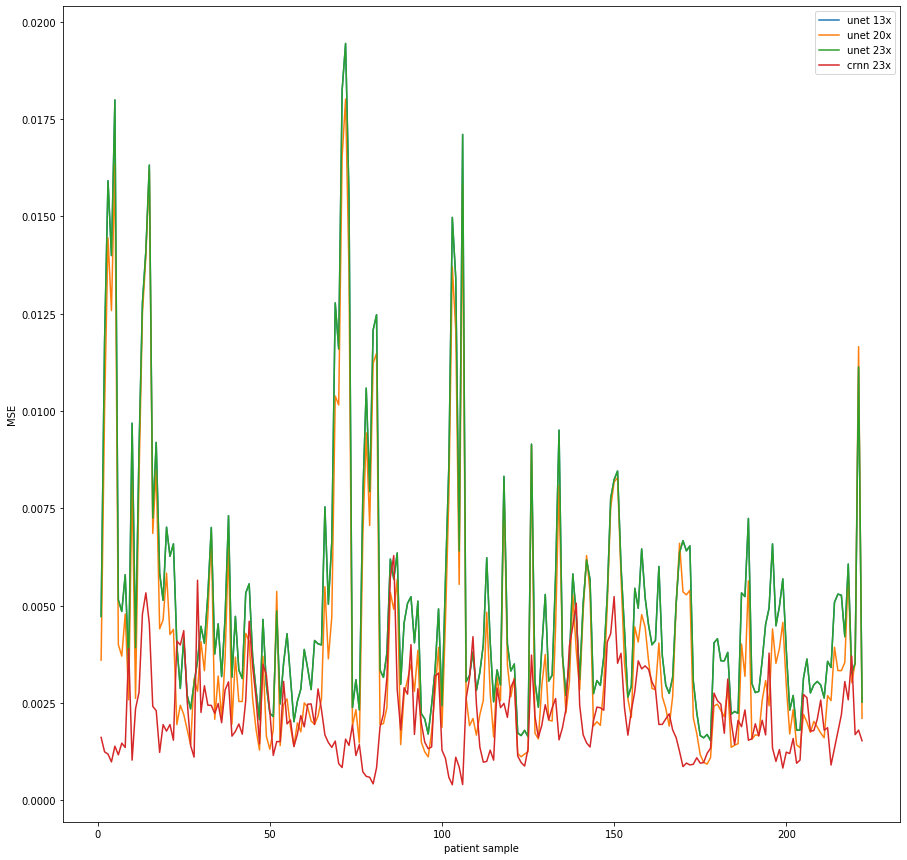

In [182]:
plt.figure(figsize=(15,15))
plt.plot(np.arange(222)+1, mse_unet13, label='unet 13x')
plt.plot(np.arange(222)+1, mse_unet20  ,label='unet 20x')
plt.plot(np.arange(222)+1, mse_unet23  ,label='unet 23x')

#plt.plot(np.arange(222)+1, mse_crnn13, label='crnn 13x')
#plt.plot(np.arange(222)+1, mse_crnn20, label='crnn 20x')
plt.plot(np.arange(222)+1, mse_crnn23, label='crnn 23x')

plt.legend()
plt.xlabel('patient sample')
plt.ylabel('MSE')

In [175]:
print("====SSIM results====")
print("unet13", np.mean(ssim_unet13), np.std(ssim_unet13))
print("unet20", np.mean(ssim_unet20), np.std(ssim_unet23))
print("unet23", np.mean(ssim_unet23), np.std(ssim_unet23))

print("crnn13", np.mean(ssim_crnn13), np.std(ssim_crnn13))
print("crnn20", np.mean(ssim_crnn20), np.std(ssim_crnn20))
print("crnn23", np.mean(ssim_crnn23), np.std(ssim_crnn23))


print("====PSNR results====")
print("unet13", np.mean(psnr_unet13), np.std(psnr_unet13))
print("unet20", np.mean(psnr_unet20), np.std(psnr_unet23))
print("unet23", np.mean(psnr_unet23), np.std(psnr_unet23))

print("crnn13", np.mean(psnr_crnn13), np.std(psnr_crnn13))
print("crnn20", np.mean(psnr_crnn20), np.std(psnr_crnn20))
print("crnn23", np.mean(psnr_crnn23), np.std(psnr_crnn23))

print("====MSE results====")
print("unet13", np.mean(mse_unet13), np.std(mse_unet13))
print("unet20", np.mean(mse_unet20), np.std(mse_unet23))
print("unet23", np.mean(mse_unet23), np.std(mse_unet23))

print("crnn13", np.mean(mse_crnn13), np.std(mse_crnn13))
print("crnn20", np.mean(mse_crnn20), np.std(mse_crnn20))
print("crnn23", np.mean(mse_crnn23), np.std(mse_crnn23))



====SSIM results====
unet13 0.8651826922522522 0.02849000027752534
unet20 0.8004003884234234 0.05456674861757263
unet23 0.750252442927928 0.05456674861757263
crnn13 0.8821714616216216 0.024293019824138156
crnn20 0.8486531342792794 0.031056092763670808
crnn23 0.8097574635135135 0.038062433217820386
====PSNR results====
unet13 27.678491421229854 2.347879435287226
unet20 24.865146064941285 2.332414621428774
unet23 23.630225444609017 2.332414621428774
crnn13 30.078710473936553 1.6018564304240361
crnn20 28.46120431873621 1.7121497085322892
crnn23 27.204908836421875 2.197814179004062
====MSE results====
unet13 0.0051063487305892975 0.0033792175515871734
unet20 0.004132952275330965 0.0033792175515871734
unet23 0.0051063487305892975 0.0033792175515871734
crnn13 0.001060971170138396 0.00043902490408002774
crnn20 0.0015414907702731389 0.0005863778400854224
crnn23 0.0021630704958448686 0.0010811571971089332


In [ ]:
recon_crnn13
recon_crnn20
recon_crnn23
recon_unet13
recon_unet20
recon_unet23

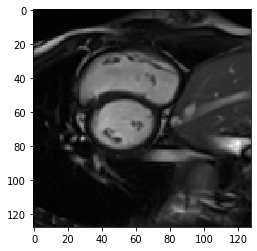

In [260]:
plt.imshow(test_truth[i,:,:,t,0], cmap='gray')

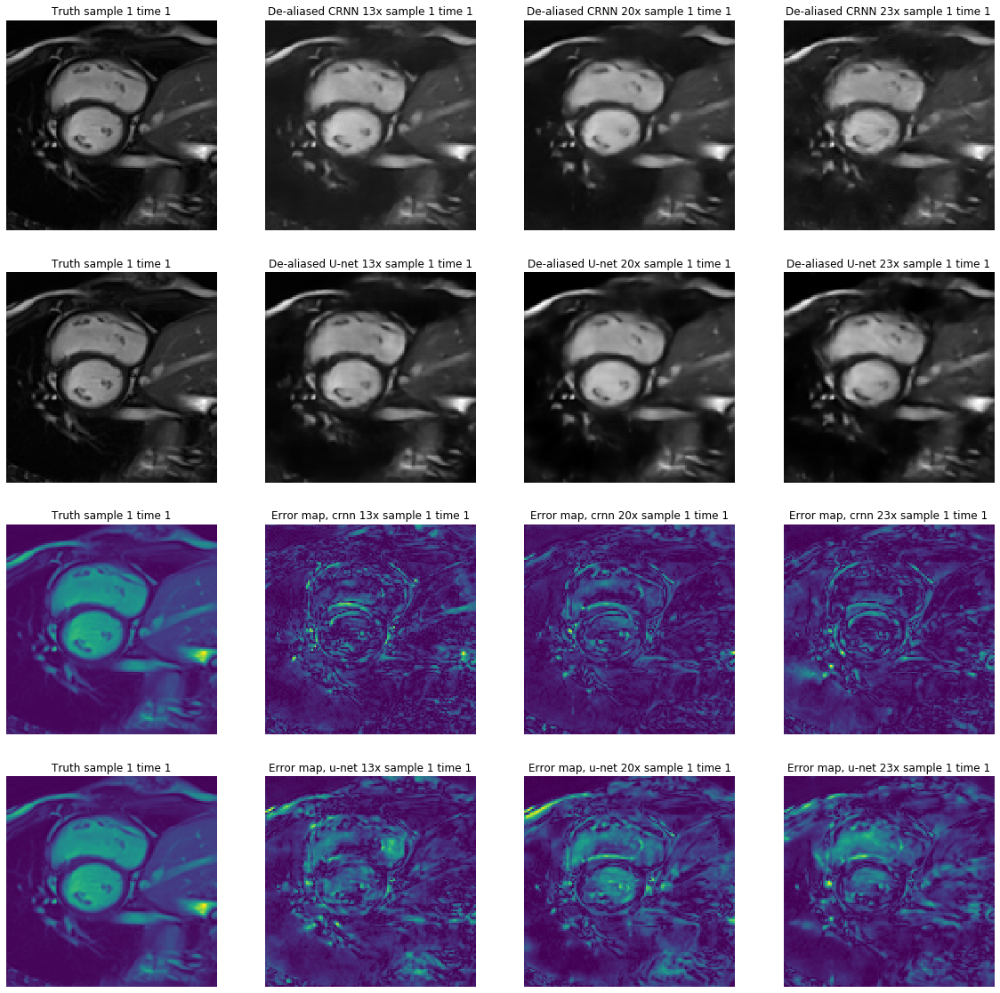

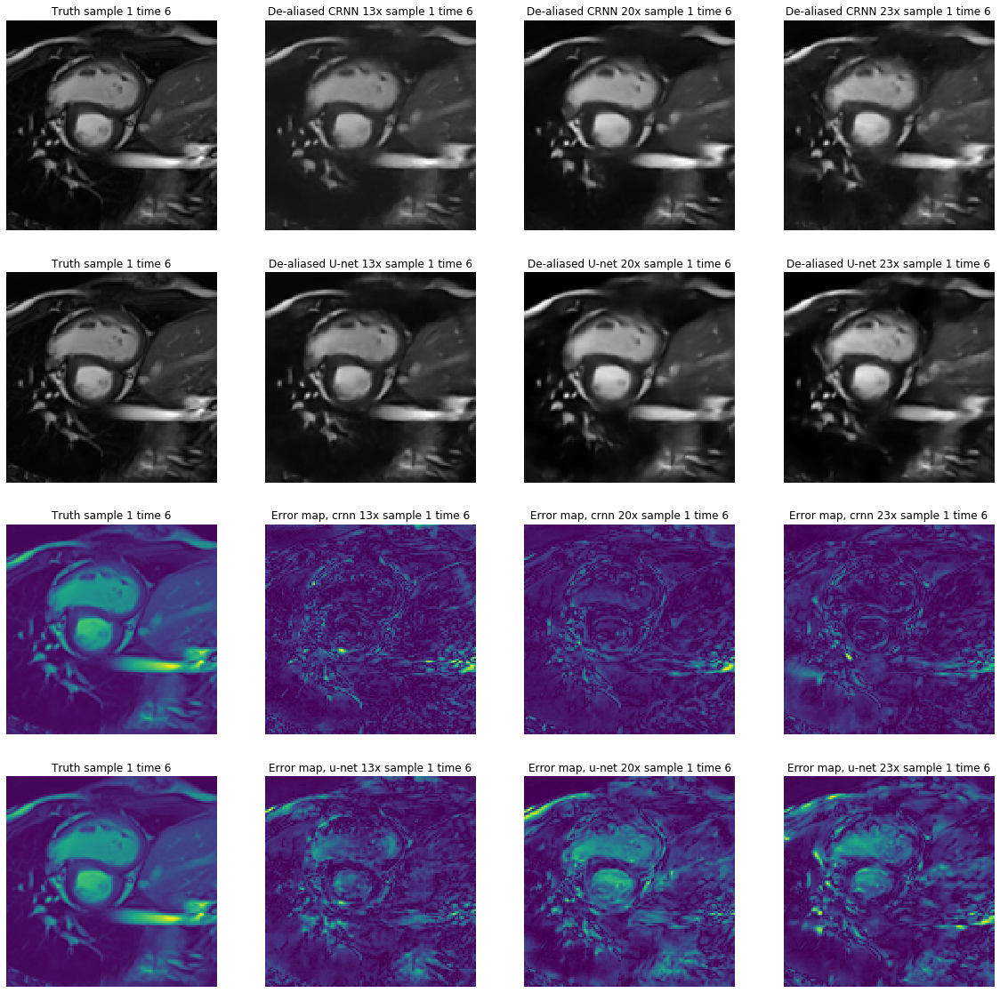

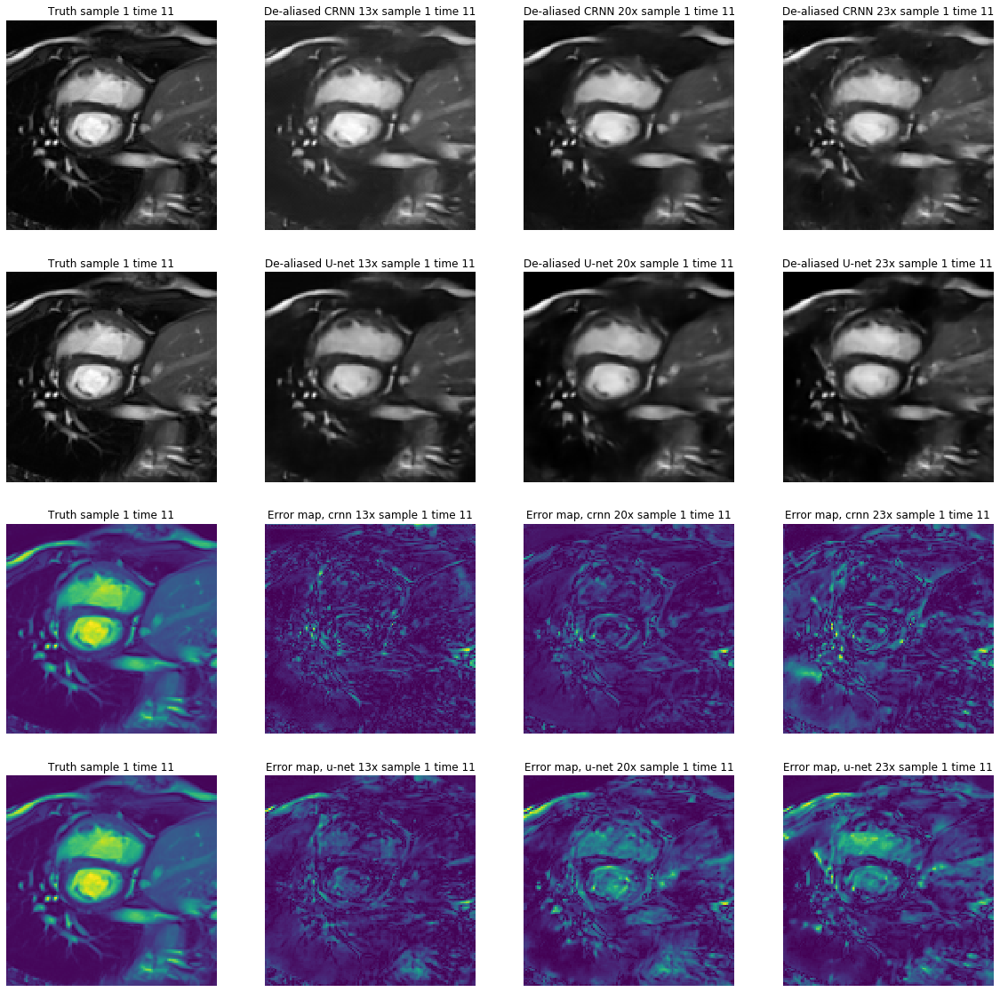

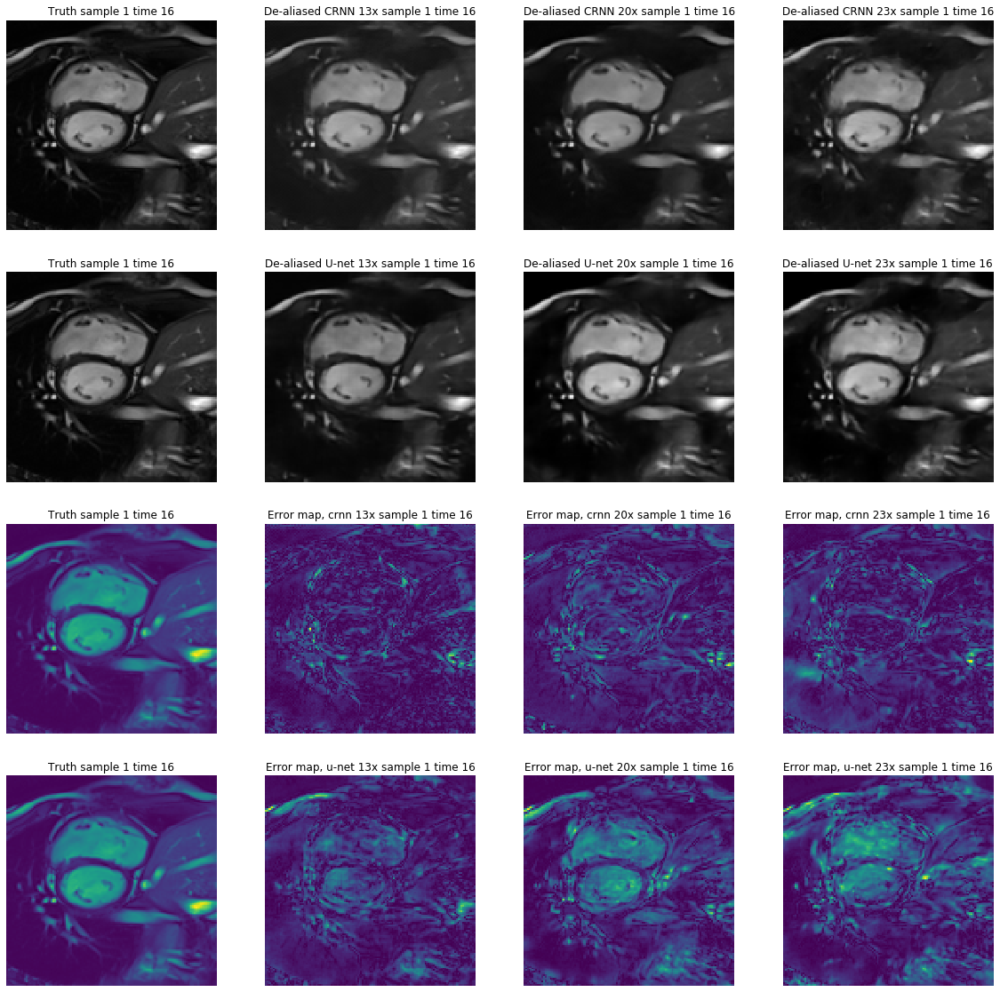

In [13]:
for i in range(0,2,2):
    for t in range(0,20,5):
        f, arr = plt.subplots(4,4, figsize=(20,20))
        arr[0,0].imshow(test_truth[i,:,:,t,0], cmap='gray')
        arr[0,0].set_title("Truth sample {} time {}".format(str(i+1), str(t+1)))
        arr[0,0].axis('off')

        arr[0,1].imshow(recon_crnn13[i,:,:,t,0], cmap='gray')
        arr[0,1].set_title("De-aliased CRNN 13x sample {} time {}".format(str(i+1), str(t+1)))
        arr[0,1].axis('off')

        arr[0,2].imshow(recon_crnn20[i,:,:,t,0], cmap='gray')
        arr[0,2].set_title("De-aliased CRNN 20x sample {} time {}".format(str(i+1), str(t+1)))
        arr[0,2].axis('off')

        arr[0,3].imshow(recon_crnn23[i,:,:,t,0], cmap='gray')
        arr[0,3].set_title("De-aliased CRNN 23x sample {} time {}".format(str(i+1), str(t+1)))
        arr[0,3].axis('off')

        arr[1,0].imshow(test_truth[i,:,:,t,0], cmap='gray')
        arr[1,0].set_title("Truth sample {} time {}".format(str(i+1), str(t+1)))
        arr[1,0].axis('off')

        arr[1,1].imshow(recon_unet13[i,:,:,t,0], cmap='gray')
        arr[1,1].set_title("De-aliased U-net 13x sample {} time {}".format(str(i+1), str(t+1)))
        arr[1,1].axis('off')

        arr[1,2].imshow(recon_unet20[i,:,:,t,0], cmap='gray')
        arr[1,2].set_title("De-aliased U-net 20x sample {} time {}".format(str(i+1), str(t+1)))
        arr[1,2].axis('off')

        arr[1,3].imshow(recon_unet23[i,:,:,t,0], cmap='gray')
        arr[1,3].set_title("De-aliased U-net 23x sample {} time {}".format(str(i+1), str(t+1)))
        arr[1,3].axis('off')
        
        arr[2,0].imshow(test_truth[i,:,:,t,0], cmap='viridis')
        arr[2,0].set_title("Truth sample {} time {}".format(str(i+1), str(t+1)))
        arr[2,0].axis('off')

        arr[2,1].imshow(np.abs(recon_crnn13[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[2,1].set_title("Error map, crnn 13x sample {} time {}".format(str(i+1), str(t+1)))
        arr[2,1].axis('off')

        arr[2,2].imshow(np.abs(recon_crnn20[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[2,2].set_title("Error map, crnn 20x sample {} time {}".format(str(i+1), str(t+1)))
        arr[2,2].axis('off')

        arr[2,3].imshow(np.abs(recon_crnn23[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[2,3].set_title("Error map, crnn 23x sample {} time {}".format(str(i+1), str(t+1)))
        arr[2,3].axis('off')
        
        arr[3,0].imshow(test_truth[i,:,:,t,0], cmap='viridis')
        arr[3,0].set_title("Truth sample {} time {}".format(str(i+1), str(t+1)))
        arr[3,0].axis('off')

        arr[3,1].imshow(np.abs(recon_unet13[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[3,1].set_title("Error map, u-net 13x sample {} time {}".format(str(i+1), str(t+1)))
        arr[3,1].axis('off')

        arr[3,2].imshow(np.abs(recon_unet20[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[3,2].set_title("Error map, u-net 20x sample {} time {}".format(str(i+1), str(t+1)))
        arr[3,2].axis('off')

        arr[3,3].imshow(np.abs(recon_unet23[i,:,:,t,0] - test_truth[i,:,:,t,0]), cmap='viridis')
        arr[3,3].set_title("Error map, u-net 23x sample {} time {}".format(str(i+1), str(t+1)))
        arr[3,3].axis('off')
        
        
        
        


